<a href="https://colab.research.google.com/github/NikolasAnic/Neural_Nets_Satellite_Imagery/blob/main/EuroSat_Clean.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# EuroSat Image Classification 

__Authors__: Nikolas Anic, Jorge de la Cal Medina, Jannick Sicher

In this Jupyter File, we are going to perform the EuroSat Image Classification task. The EuroSat is a program using satellite images openly accessible by the Earth observation program Copernicus. This dataset contains 27'000 labeled and geo-referenced satellite records. The labels identify 10 land cover classifications, such as agricultural area, industral area, forests, lakes or residential areas. Images cover 13 spectral bands (color dispersions). 


## Preliminary Steps
Before we can get started with the actual classification of satellite images, a few preparatory steps are necessary. This includes the libraries and packages we need in the course of the project.

Since we are storing our architectures due to high computational costs, we now need to mount the corresponding Google Drive as a first step. 

In [ ]:
# Mount to Google drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Loading Libraries and Packages
In the following we load all the libraries that we need in the project. Besides libraries, which make data handling much easier (e.g. [rasterio](https://rasterio.readthedocs.io/en/latest/) for geospatial data handling), we would like to use the [Keras](https://keras.io/) library, which is mainly used for our project. For the evaluation we mainly use [Scikit-Learn](https://scikit-learn.org/stable/).

In [ ]:
# We load the TensorBoard notebook extension and import tensorboard
%load_ext tensorboard

# Access Google drive
from google.colab import files

# Data processing and reading images
import pandas as pd
import zipfile
import requests
import io
from PIL import Image
from skimage.color import rgb2gray
!pip install rasterio
import rasterio
from rasterio.plot import show, show_hist

# Tensor processing
import numpy as np
import os
from sklearn.utils import shuffle
from sklearn.preprocessing import LabelBinarizer

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import ImageFont
!pip install tikzplotlib
import tikzplotlib
plt.rcParams['figure.dpi'] = 300 # increase dpi of figures
plt.style.use("ggplot")
!sudo apt-get install texlive-latex-extra texlive-fonts-recommended dvipng cm-super
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "font.serif": ["Computer Modern Roman"],
})
!pip install visualkeras 
import visualkeras

# Modelling
from sklearn.model_selection import train_test_split
import tensorflow as tf
import keras
from keras.models import Sequential
from keras.layers import Dense, Conv2D, MaxPooling2D, Activation, Flatten, BatchNormalization, ELU, Dropout
from keras.optimizers import RMSprop
from keras.applications import vgg16
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint, TensorBoard
from sklearn.metrics import confusion_matrix
from keras.preprocessing.image import ImageDataGenerator


# Evaluation metrics
from sklearn.metrics import classification_report
import pandas as pd

# Import the datatime and os package, which we need to label our training histories nicely in tensorboard
import datetime, os
import shutil
import random
from tqdm import tqdm

# Import the package CyclicLR to use cyclical learning rates
!git clone https://github.com/bckenstler/CLR.git
from CLR.clr_callback import CyclicLR

# KFold
from sklearn.model_selection import KFold

# SMOTE
from imblearn.over_sampling import SMOTE

# Different oversampling techniques
from keras.utils.data_utils import Sequence
from imblearn.over_sampling import RandomOverSampler
from imblearn.tensorflow import balanced_batch_generator

# Suppress the convergence warnings which occure when a lasso is fitted
import warnings
warnings.filterwarnings("ignore")

# Pickle 
import pickle 

# Transfer Learning
from keras.applications.densenet import DenseNet201, preprocess_input
from keras.applications.resnet50 import ResNet50, preprocess_input
from keras.applications.vgg16 import VGG16, preprocess_input
from keras.layers.experimental.preprocessing import Resizing
from tensorflow.image import resize_with_pad, ResizeMethod



     |████████████████████████████████| 19.3MB 1.2MB/s 
     |████████████████████████████████| 61kB 6.6MB/s 
Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  cm-super-minimal fonts-droid-fallback fonts-lato fonts-lmodern
  fonts-noto-mono fonts-texgyre ghostscript gsfonts javascript-common
  libcupsfilters1 libcupsimage2 libgs9 libgs9-common libijs-0.35 libjbig2dec0
  libjs-jquery libkpathsea6 libpotrace0 libptexenc1 libruby2.5 libsynctex1
  libtexlua52 libtexluajit2 libzzip-0-13 lmodern pfb2t1c2pfb poppler-data
  preview-latex-style rake ruby ruby-did-you-mean ruby-minitest
  ruby-net-telnet ruby-power-assert ruby-test-unit ruby2.5
  rubygems-integration t1utils tex-common tex-gyre texlive-base
  texlive-binaries texlive-latex-base texlive-latex-recommended
  texlive-pictures texlive-plain-generic tipa
Suggested packages:
  fonts-noto ghostscript-x apache2 | lighttpd | httpd poppler-

/usr/local/lib/python3.7/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.
  warnings.warn(message, FutureWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.utils.testing module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from s

## Data Preparation
After we completed all preliminaries, we can now start with the data preparation. These include loading the images via a zip file, the correct consideration of the label-names and the correct handling of the folder structure. 

### Image Upload

To upload the images, we will use an approach proposed by the Google Colab Research Team (for more information, check the following [source](https://colab.research.google.com/github/tensorflow/docs/blob/master/site/en/tutorials/load_data/images.ipynb)). Since the authors provide the files within a ".zip" format, we first need to unzip the dataset to obtain the raw image set. This is done by using the code below. 

In [ ]:
# RGB file URL
url = "http://madm.dfki.de/files/sentinel/EuroSAT.zip"

# Download zip
request = requests.get(url)
zips = zipfile.ZipFile(io.BytesIO(request.content))

In [ ]:
# Zipped name of the 500th jpg image
zips.namelist()[499]

'2750/River/River_2354.jpg'

### Handling the Label Names

The next question that arises is how to label the images accordingly. We aim to assign a name to each image that we can use as the respective label and then predict this label. 

We use the fact that the zip file includes jpg observations with **distinct** filenames, as seen in the code chunk above. The 500th image has a distinct path and title, namely River_2354, the 2354th image is labelled as a river. Due to this prior labelling of the dataset, we can use a "string-to-factor" approach later where we clip the name of each image and factorize it to obtain the respective label.



In [ ]:
# Here, we will get the filenames for each image in a first step
image_filenames = []

for file in zips.namelist():
  image_filenames.append(file)

# Now, we store all image filenames that include a "jpg" formulation, to make sure that only jpg files are stored in the dataset.
image_filenames = [x for x in image_filenames if ".jpg" in x]

# We will use these filenames to create a new np array that clipps the file strings accordingly and only gets the respective noun (e.g. River)
# We need this dtype in order to convert strings to characters and, as such, get the filnames
labs = np.empty(len(image_filenames), dtype = 'S20')

i = 0
for label in image_filenames:
  labs[i] = label.split('/')[1]
  i += 1

In [ ]:
# Display label of 500th image
labs[499]

b'River'

In [ ]:
# Now, we just need to convert the names into numbers to obtain a numerical label for each image: 
label_names, yLabels = np.unique(labs, return_inverse=True)

# This command now assigned to each unique name the respective numbering and orders it alphabetically
label_Dict = dict(zip(np.unique(yLabels), label_names))

# Now, we just need to zip both files together in order to get the respective pair 
print(label_Dict)

{0: b'AnnualCrop', 1: b'Forest', 2: b'HerbaceousVegetation', 3: b'Highway', 4: b'Industrial', 5: b'Pasture', 6: b'PermanentCrop', 7: b'Residential', 8: b'River', 9: b'SeaLake'}


We now receive a dictionary with the correctly assigned labels, which we will use in the further course of this notebook. 

### Image Files in Correct Order

As we obtained the image labels and assigned a name and label to each of them, we need to convert the images into a single file. The conversion can be done using the Image Opener and converting the original image size to image sizes that are already scaled between zero and one. 

In [ ]:
# First, we need to find out what the shape(s) of each image actually are. This can be done by opening the zip-image as 
# an array and then observing its shape accordingly
np.asarray(Image.open(zips.open("2750/River/River_2354.jpg"))).shape

(64, 64, 3)

In [ ]:
# Read images to numpy array
XImages = np.zeros([len(image_filenames), 64, 64, 3])

i = 0
for image in image_filenames:
  XImages[i] = np.asarray(Image.open(zips.open(image))).astype('uint8')/255
  i += 1

In [ ]:
# As we can see, we now transformed each image into its respective coordiantes
XImages.shape

(27000, 64, 64, 3)

8
b'River'


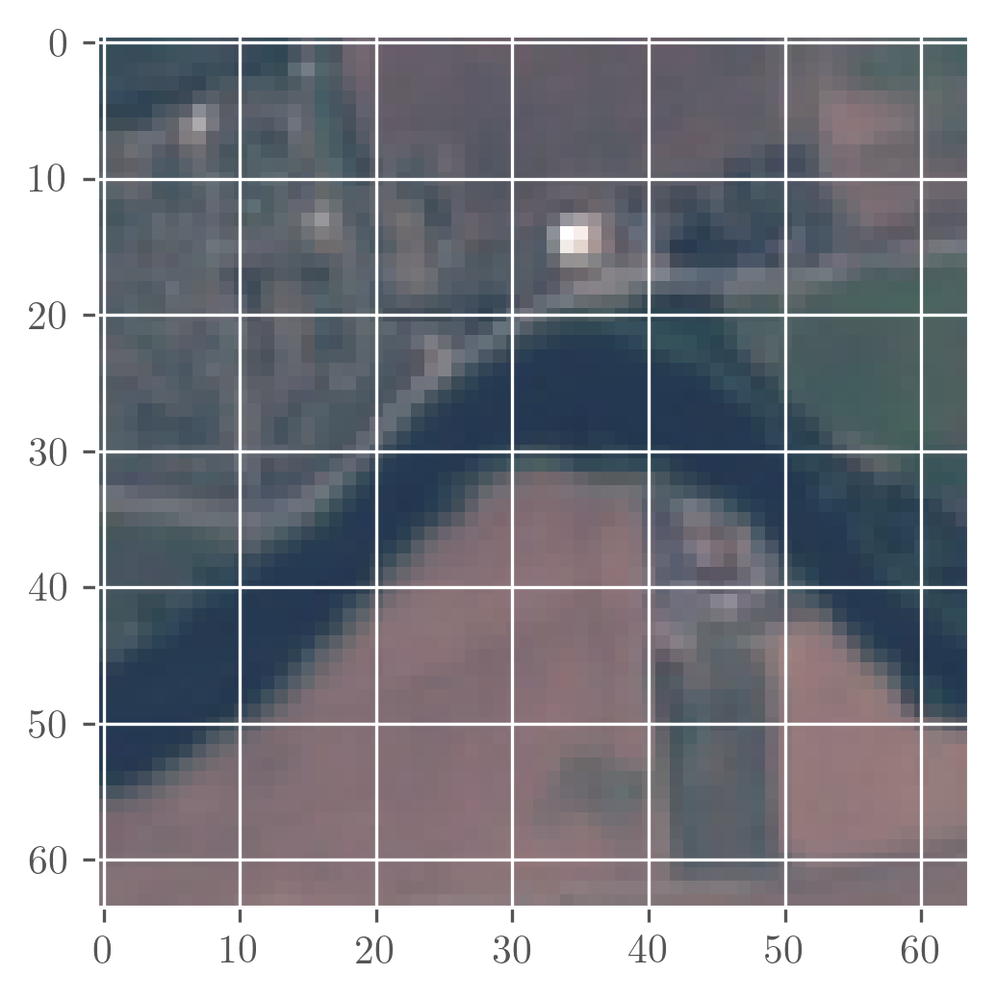

In [ ]:
# Now, we can test whether the images have the correct respective (I) Label (II) Label Name
tmp = 500
img = XImages[tmp]

print(yLabels[tmp])
print(label_names[yLabels[tmp]])
plt.imshow(img);
plt.savefig('example_picture.png')

## Custom Convolutional Neural Network
After completing the data preparation, we are now in a position to develop our custom convolutional neural network (CNN). In a first step we define a baseline framework. Afterwards, we lead through the centerpiece of our project: the experimentation, i.e. the fine-tuning of our hyperparameters. 

### Training-Test-Validation Split for the Classification Task

As a first step, we can determine how to split and define the dataset to obtain training, testing, and validation sets. We have chosen a **test size** of 0.2, i.e. 20% of the images are saved for a test set. We also define a random state, i.e. we set a seed to the random generator so that our train-test split is always deterministic.  

After having done the initial training-test split we randomly assign a training and validation status to the images.

Finally, we check the shape of the training set. 

In [ ]:
# Define the train test split for the images
X_train_full, X_test, y_train_full, y_test = train_test_split(XImages, yLabels, test_size = 0.2, random_state = 42)

In [ ]:
# Now, we randomly assign training and validation status to the respective variables
shuffler = np.random.permutation(X_train_full.shape[0])
X_valid, X_train = X_train_full[shuffler[:5000]], X_train_full[shuffler[5000:]]
y_valid, y_train = y_train_full[shuffler[:5000]], y_train_full[shuffler[5000:]]

In [ ]:
# Checking the shape of the X_valid set
X_valid.shape

(5000, 64, 64, 3)

In [ ]:
# Checking the shape of the X_train set
X_train.shape

(16600, 64, 64, 3)

As we can see from the output above, we obtain 16,600 images which are assigned to our training set. 

### Analyzing the Satellite Images
To ensure that all labels are present in the training set and that they are correct, we check the training set.  Additionally, we check again if the assigned classes correspond to the corresponding images. 

In [ ]:
# Find the unique numbers from the train labels
classes = np.unique(y_train)
nClasses = len(classes)
print('Total number of outputs : ', nClasses)
print('Output classes : ', classes)

Total number of outputs :  10
Output classes :  [0 1 2 3 4 5 6 7 8 9]


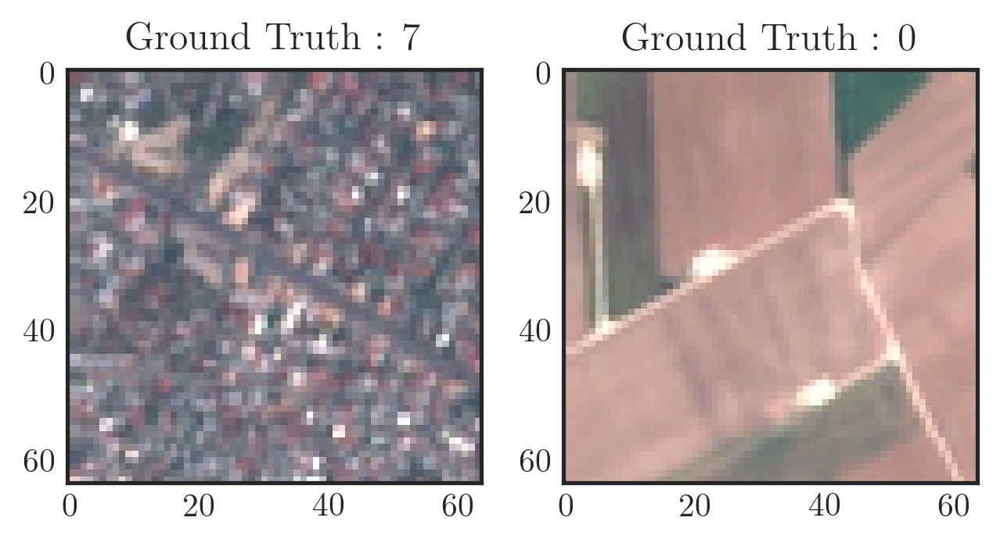

In [ ]:
# Define figure size
plt.figure(figsize=[5,5])

# Display the first image in training data
plt.subplot(121)
plt.imshow(X_train[0,:,:], cmap='gray')
plt.title("Ground Truth : {}".format(y_train[0]))

# Display the first image in testing data
plt.subplot(122)
plt.imshow(X_test[0,:,:], cmap='gray')
plt.title("Ground Truth : {}".format(y_test[0]))
plt.savefig('ground_truth.png')

### Structure of Custom Convolutional Neural Network

With the successful training-test-validation split, we are now in a position to define our first CNN. Our initial model is based on a structure from [Stanford](https://cs231n.github.io/convolutional-networks/) Convolutional Neural Networks (CNNs/ ConvNets) for Visual Recognition . This structure gives us a good starting point to define our network. 

The model presented here is reminiscent of the VGGNet developed by [Karen Simonyan and Andrew Zisserman (2015)](https://arxiv.org/abs/1409.1556). This model showed that the network depth can have a significant contribution to the performance. Here we use the variant with 16 convolutional/fully-connected layers. An exciting aspect of the architecture is that we only do 3x3 convolutions and 2x2 pooling from start to finish.

We use a Recitfied Linear Unit (ReLU) activation function and the He Normal initializer. We do this since from the literature we are aware that the He initialization is the recommended one if the activation function is a ReLU.

We also use padding with "same", which results in padding with zeros evenly to the left/right or up/down of the input such that the output has the same height/width dimension as the input. 

The final layer then uses a softmax activation which enables us to perform our multi-label classification task. The softmax function here is a generalization of logistic regression that can be used for multiclass classification.


In [ ]:
# We use the initial structure from Stanford Convolutional Neural Networks (CNNs / ConvNets) for Visual Recognition learning source 
def conv_model():

  model_cnn = keras.models.Sequential()
  model_cnn.add(keras.layers.Conv2D(filters=64, kernel_size = 3, activation = "relu", kernel_initializer="he_normal", padding = "same", input_shape = [64,64,3]))
  model_cnn.add(keras.layers.Conv2D(filters=64, kernel_size = 3, activation = "relu", kernel_initializer="he_normal", padding = "same")) 
  model_cnn.add(keras.layers.MaxPooling2D(pool_size = 2, strides = 2))
  model_cnn.add(keras.layers.Conv2D(filters=128, kernel_size = 3, activation = "relu", kernel_initializer="he_normal", padding = "same")) 
  model_cnn.add(keras.layers.Conv2D(filters=128, kernel_size = 3, activation = "relu", kernel_initializer="he_normal", padding = "same")) 
  model_cnn.add(keras.layers.MaxPooling2D(pool_size = 2, strides = 2))
  model_cnn.add(keras.layers.Conv2D(filters=256, kernel_size = 3, activation = "relu", kernel_initializer="he_normal", padding = "same")) 
  model_cnn.add(keras.layers.Conv2D(filters=256, kernel_size = 3, activation = "relu", kernel_initializer="he_normal", padding = "same")) 
  model_cnn.add(keras.layers.Conv2D(filters=256, kernel_size = 3, activation = "relu", kernel_initializer="he_normal", padding = "same")) 
  model_cnn.add(keras.layers.MaxPooling2D(pool_size = 2, strides = 2))
  model_cnn.add(keras.layers.Conv2D(filters=512, kernel_size = 3, activation = "relu", kernel_initializer="he_normal", padding = "same")) 
  model_cnn.add(keras.layers.Conv2D(filters=512, kernel_size = 3, activation = "relu", kernel_initializer="he_normal", padding = "same")) 
  model_cnn.add(keras.layers.Conv2D(filters=512, kernel_size = 3, activation = "relu", kernel_initializer="he_normal", padding = "same")) 
  model_cnn.add(keras.layers.MaxPooling2D(pool_size = 2, strides = 2))
  model_cnn.add(keras.layers.Conv2D(filters=512, kernel_size = 3, activation = "relu", kernel_initializer="he_normal", padding = "same")) 
  model_cnn.add(keras.layers.Conv2D(filters=512, kernel_size = 3, activation = "relu", kernel_initializer="he_normal", padding = "same")) 
  model_cnn.add(keras.layers.Conv2D(filters=512, kernel_size = 3, activation = "relu", kernel_initializer="he_normal", padding = "same")) 
  model_cnn.add(keras.layers.MaxPooling2D(pool_size = 2, strides = 2))
  model_cnn.add(keras.layers.Flatten())
  model_cnn.add(keras.layers.Dense(512, activation = "relu", kernel_initializer="he_normal"))
  model_cnn.add(keras.layers.Dense(256, activation = "relu", kernel_initializer="he_normal"))
  model_cnn.add(keras.layers.Dense(10, activation = "softmax"))

  # Compile the model
  ## Note:
  ### As usual in classification problems we use the categorical crossentropy as the loss function
  ### We use the Adam method as the optimizer with learning rate 0.01 for initialisation
  ### We set the argument metrics to "accuracy", such that Keras computes and outputs the accuracy of the model on the validation set while it is trained
  model_cnn.compile(loss="sparse_categorical_crossentropy",
                optimizer=keras.optimizers.Adam(learning_rate=0.0001),
                metrics=["accuracy"])

  return model_cnn

# To ensure that our model training histories are labelled nicely in tensorboard including a time indication of when the model has been fitted, 
## we define a variable to capture the exact logdirectory and assign this directory to the tensorboard callback afterwards.
logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_cb = TensorBoard(logdir, histogram_freq=1)

# To prevent overfitting, we introduce early stopping, such that the training is stopped as soon as no improvement has been monitored over 10 periods according to the validation accuracy
early_stopping_cb = EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True)
#early_stopping_cb = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

In [ ]:
# Define name for baseline model
model_cnn_baseline = conv_model()

In [ ]:
# Get the summary of our CNN
model_cnn_baseline.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 64, 64, 64)        1792      
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 64, 64, 64)        36928     
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 32, 32, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 32, 32, 128)       73856     
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 32, 32, 128)       147584    
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 16, 16, 128)       0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 16, 16, 256)       2

The visualkeras package allows us to visualize our custom CNN. Below we present our custom architecture of our CNN. 

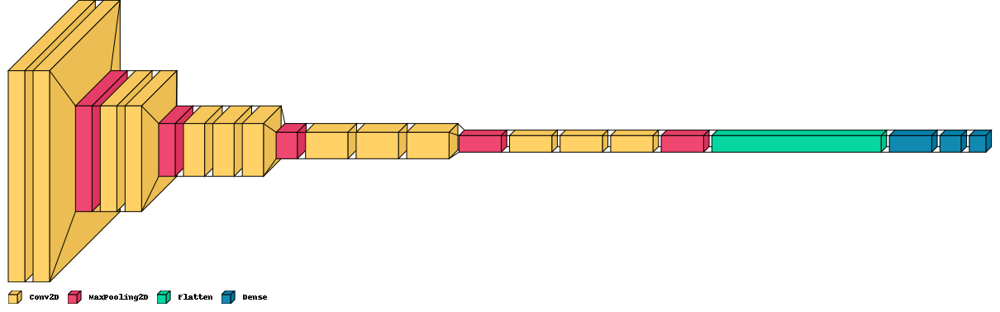

In [ ]:
# Create visualization of custom CNN
visualkeras.layered_view(model_cnn_baseline, legend=True, to_file='custom_cnn.png').show() # write and show
visualkeras.layered_view(model_cnn_baseline, legend=True)

### Training of Custom Convolutional Neural Network

Now, we are training the CNN. We use a batch size of 50: thus we use 50 training examples in a forward/backward pass. This of course comes with a trade-off: the larger the batch size we define, the more memory space is needed. We also define 50 epochs: one epoch corresponds to one forward and one backward pass of all training examples. 

In [ ]:
# Important Note: Training can only be done with a GPU connection
# Train the model on the data
history = model_cnn_baseline.fit(X_train, y_train, batch_size=50, epochs=50, verbose=1,
                    validation_data=(X_valid, y_valid), 
                    callbacks=[early_stopping_cb, tensorboard_cb])

Epoch 1/50
332/332 [==============================] - 40s 30ms/step - loss: 1.6965 - accuracy: 0.3539 - val_loss: 0.9982 - val_accuracy: 0.6164
Epoch 2/50
332/332 [==============================] - 8s 26ms/step - loss: 0.9839 - accuracy: 0.6444 - val_loss: 0.9355 - val_accuracy: 0.6432
Epoch 3/50
332/332 [==============================] - 8s 26ms/step - loss: 0.8128 - accuracy: 0.7108 - val_loss: 0.7565 - val_accuracy: 0.7334
Epoch 4/50
332/332 [==============================] - 8s 26ms/step - loss: 0.6880 - accuracy: 0.7547 - val_loss: 0.6060 - val_accuracy: 0.7906
Epoch 5/50
332/332 [==============================] - 8s 26ms/step - loss: 0.5662 - accuracy: 0.8041 - val_loss: 0.5461 - val_accuracy: 0.8066
Epoch 6/50
332/332 [==============================] - 8s 25ms/step - loss: 0.5114 - accuracy: 0.8200 - val_loss: 0.5501 - val_accuracy: 0.8094
Epoch 7/50
332/332 [==============================] - 8s 26ms/step - loss: 0.4034 - accuracy: 0.8593 - val_loss: 0.4581 - val_accuracy: 0.838

In [ ]:
# Evaluate the model on the test data using 'evaluate'
model_cnn_baseline.evaluate(X_test, y_test)

169/169 [==============================] - 2s 8ms/step - loss: 0.3402 - accuracy: 0.8939


[0.34022483229637146, 0.8938888907432556]

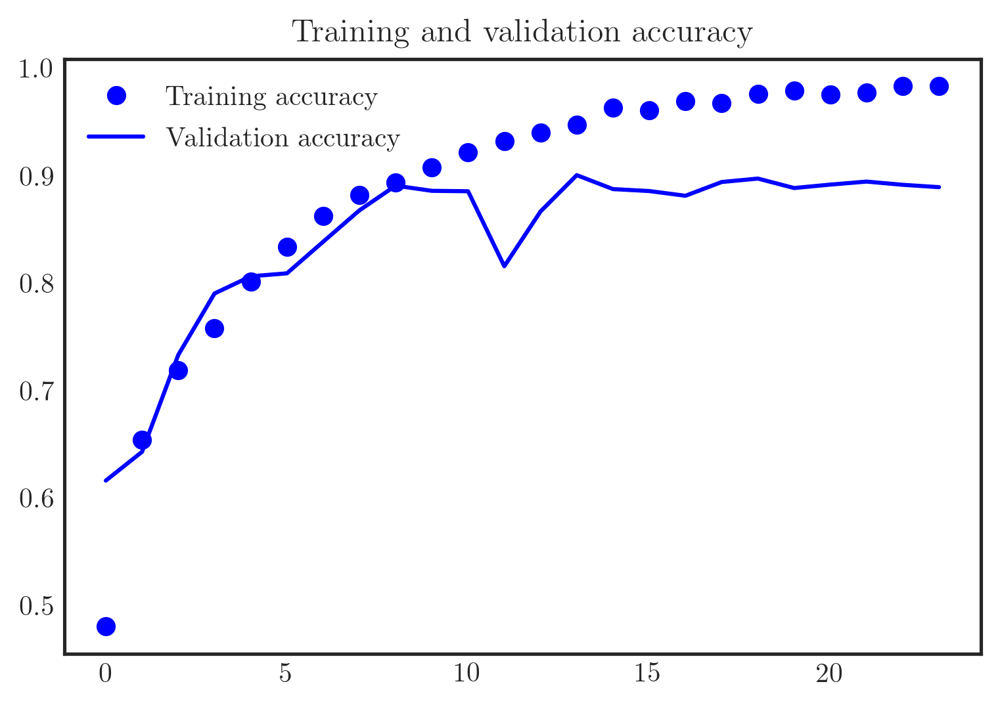

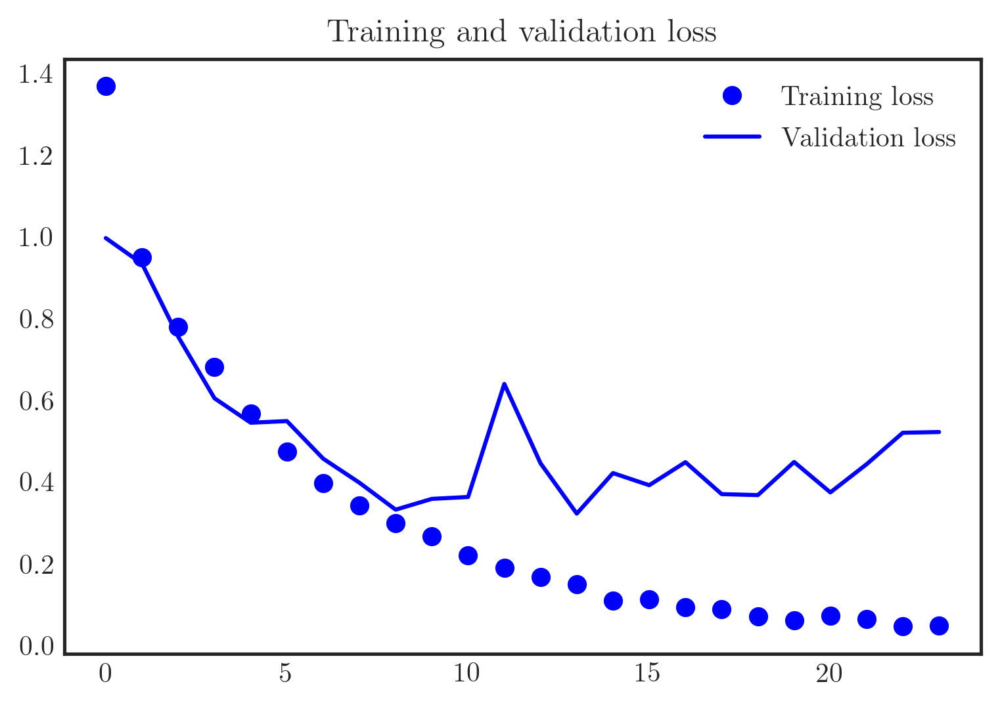

In [ ]:
# Alternative Visualization
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(len(accuracy))
plt.plot(epochs, accuracy, 'bo', label='Training accuracy')
plt.plot(epochs, val_accuracy, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()



dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


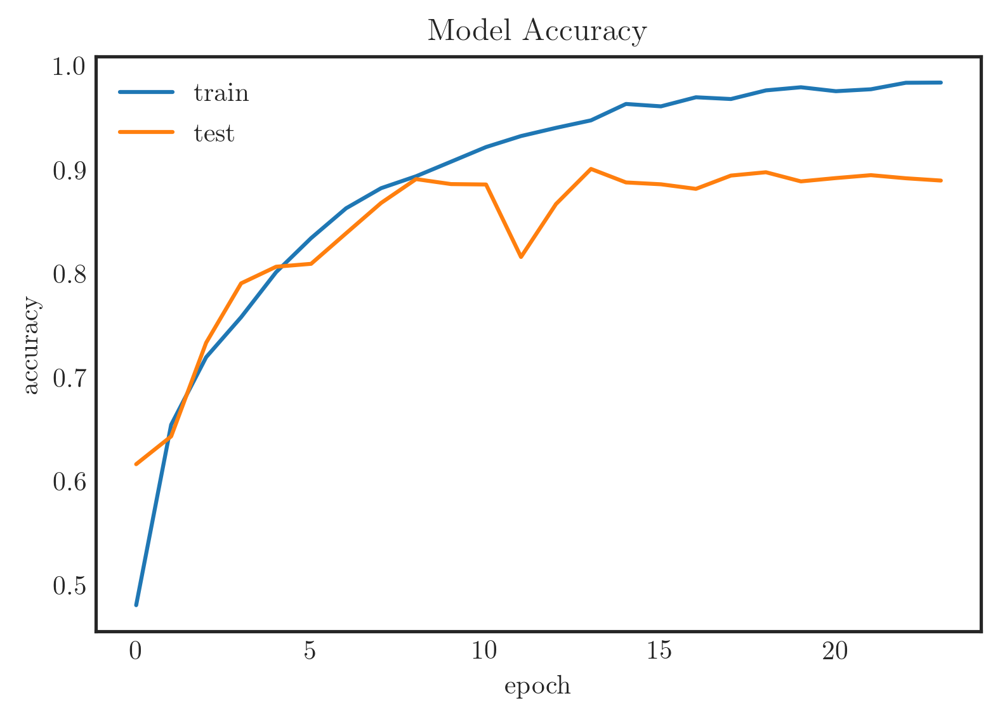

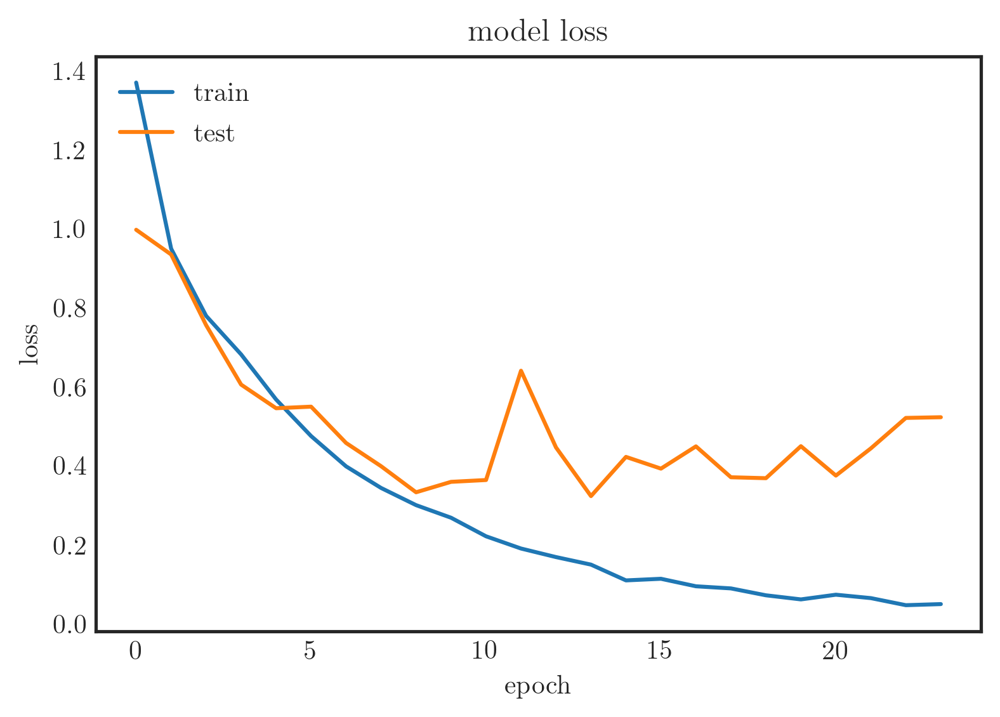

In [ ]:
# Alternative Visualization
print("\n")
print(history.history.keys())

# summarize history for accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

Next, we want to perform a classification report, where we shed light on the different evaluation metrics for each class.

In [ ]:
# Create classification report 
predictions_test_baseline = model_cnn_baseline.predict(X_test)
preds_test_baseline = np.argmax(predictions_test_baseline, axis = 1)

print(classification_report(y_test, preds_test_baseline))
print(model_cnn_baseline.evaluate(X_test, y_test))

              precision    recall  f1-score   support

           0       0.90      0.89      0.89       612
           1       0.95      0.98      0.97       597
           2       0.86      0.79      0.82       616
           3       0.85      0.81      0.83       528
           4       0.97      0.89      0.93       503
           5       0.91      0.85      0.88       368
           6       0.76      0.85      0.80       505
           7       0.95      0.97      0.96       598
           8       0.81      0.89      0.85       482
           9       0.97      0.99      0.98       591

    accuracy                           0.89      5400
   macro avg       0.89      0.89      0.89      5400
weighted avg       0.90      0.89      0.89      5400

169/169 [==============================] - 3s 15ms/step - loss: 0.3402 - accuracy: 0.8939
[0.3402249217033386, 0.8938888907432556]


From the classification report above we can see that both the class 2, 3, and 6 underperform with respect to the **precision** and class 2, 3, 5, and 6 underperform with respect to the **recall**. 

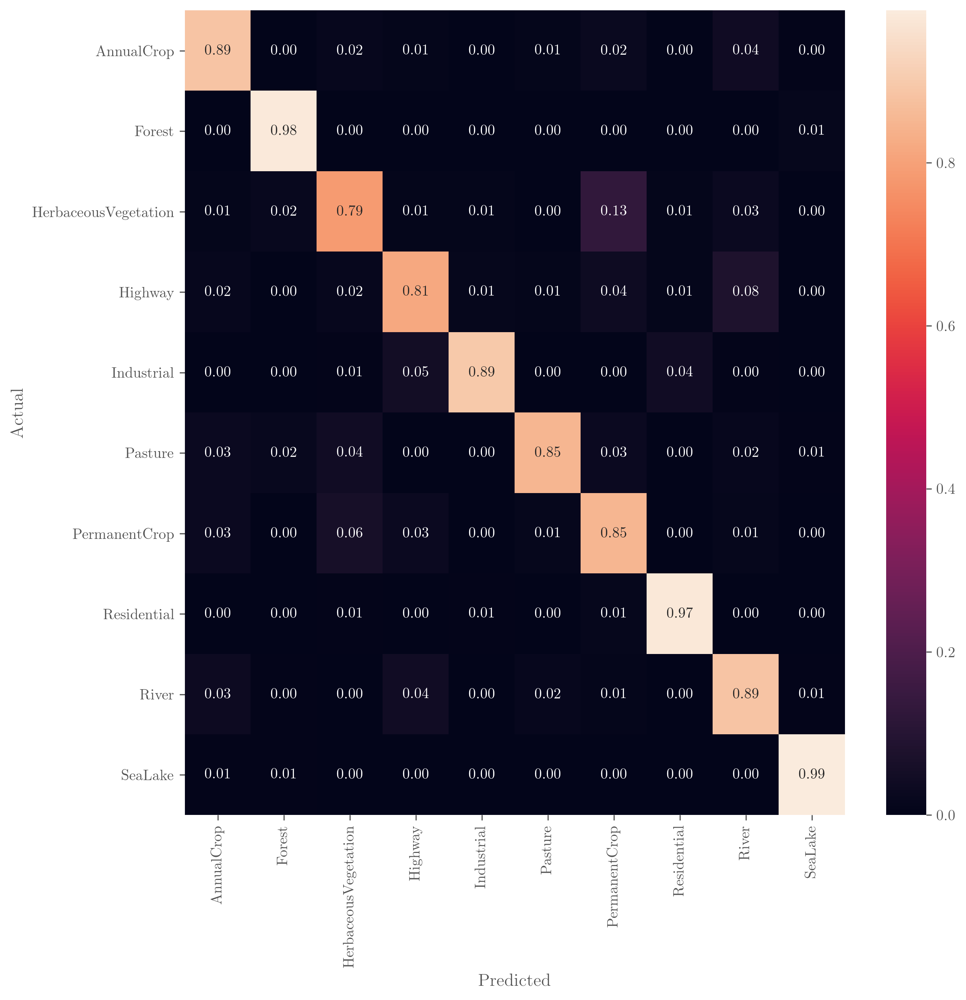

In [ ]:
# Create confusion matrix
preds_test = np.argmax(predictions_test_baseline, axis = 1)

cm = confusion_matrix(y_test, preds_test_baseline)
labels = ['AnnualCrop','Forest','HerbaceousVegetation','Highway',
        'Industrial','Pasture','PermanentCrop','Residential','River','SeaLake']

# Normalise
cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(cmn, annot=True, fmt='.2f', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.savefig('Confusion_Matrix_Baseline.pdf')  
plt.show(block=False)

The overall performance of our model is applicable in the confusion matrix. As we understand, we face considerable disceepancies in overall performance depending on the individual classes. In general, our scores range from 0.79 for Herbaceous Vegetation to 0.99 for SeaLake, while most of the scores are within a band 0.85 to 0.9. The reason for the bad assessment of the Herbaceous Vegetation is applicable in its mismatch with PermanentCrop, that occured in approximately 13% of the cases. That is to be expected as the rudimentary structure of our model only allows us to differentiate between high-level factors, implying that only images that are to a large degree unique in their high-level constitutions will be portrayed accurately in the large majority of cases, such as SeaLake which differentiates itself from the remaining classes as it is solely given in a blue colour without any shapes or structures in it (as opposed to highway or rivers, which also show to be somewhat correlated and mismatched with one another). As such, we can say that our model does already an acceptable job in distinguishing apparent high-level features, but it is unable to factorise on low-level similarities. 

In [ ]:
# Save the model on the drive 
path = "/content/drive/MyDrive/EuroSat_Clean/"
model_cnn_baseline.save(path + "Model_CNN_baseline")

# Save the params as pickle on the drive

with open(path +'train_history_baseline', 'wb') as file_pi_baseline_history:
        pickle.dump(history.history, file_pi_baseline_history)      

INFO:tensorflow:Assets written to: /content/drive/MyDrive/EuroSat_Clean/Model_CNN_baseline/assets


#### Testing the Upload from Google Drive - Baseline Model



dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.


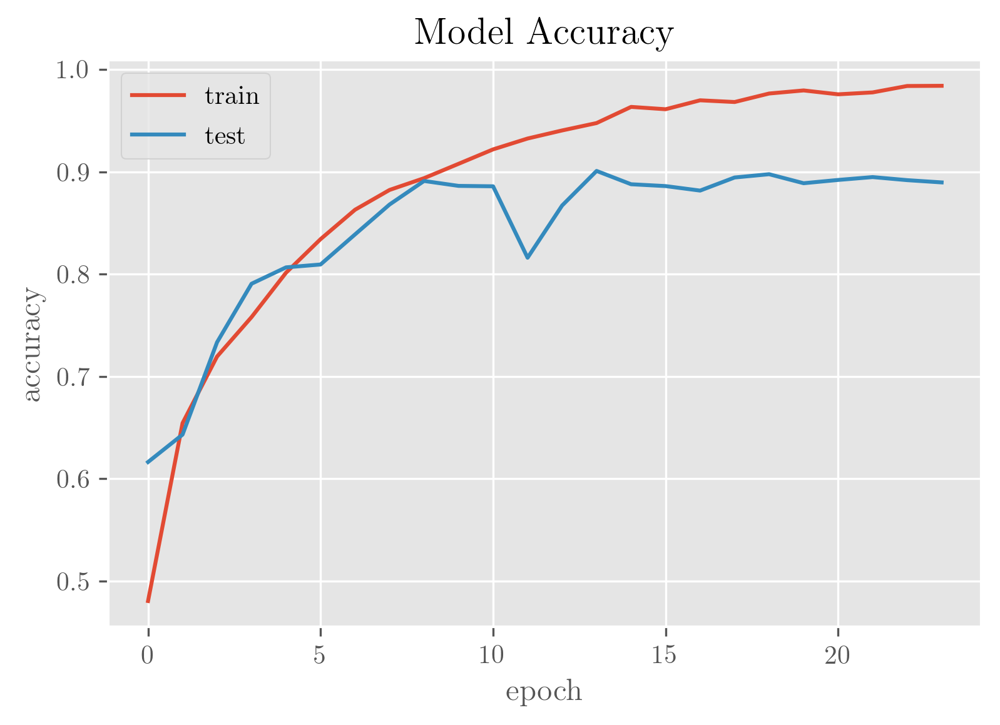

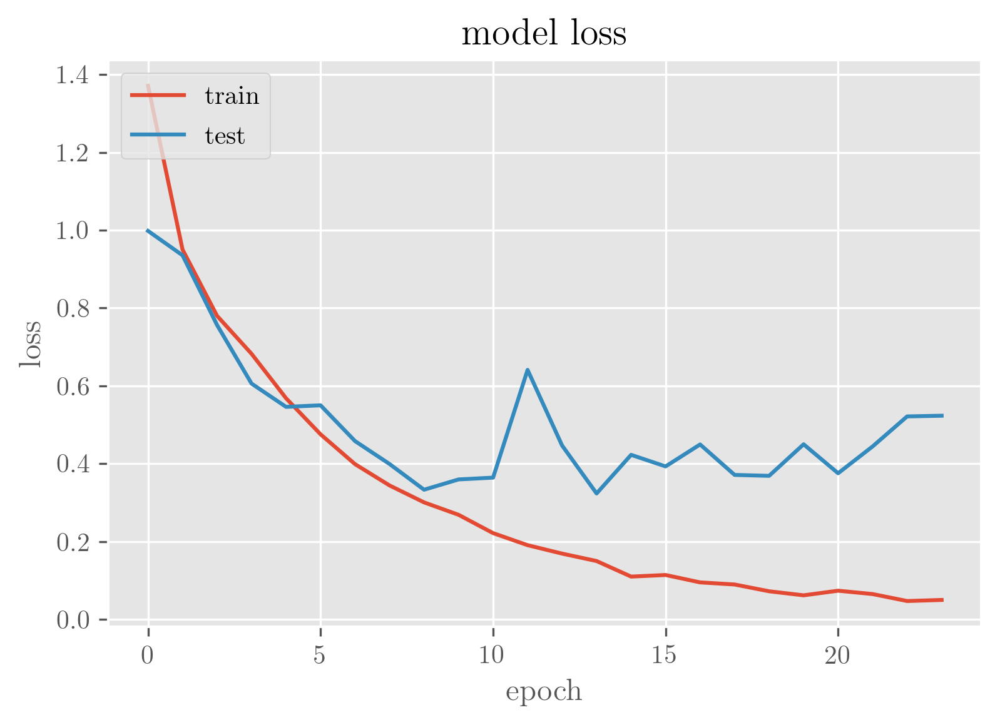

In [ ]:
# Here, we saved the baseline history as history_new

# Save the model on the drive 
path = "/content/drive/MyDrive/EuroSat_Clean/"

history_new = pickle.load(open(path +'train_history_baseline', "rb"))

# This is how to print it:

# Alternative Visualization
print("\n")
print(history_new.keys())

# summarize history for accuracy
plt.plot(history_new['accuracy'])
plt.plot(history_new['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

# summarize history for loss
plt.plot(history_new['loss'])
plt.plot(history_new['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

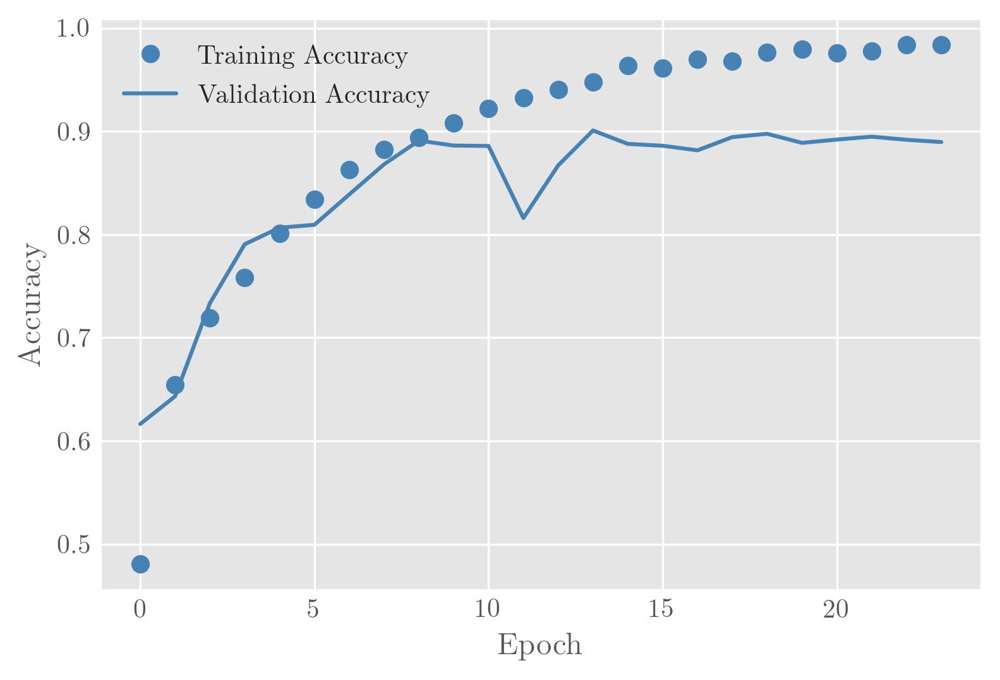

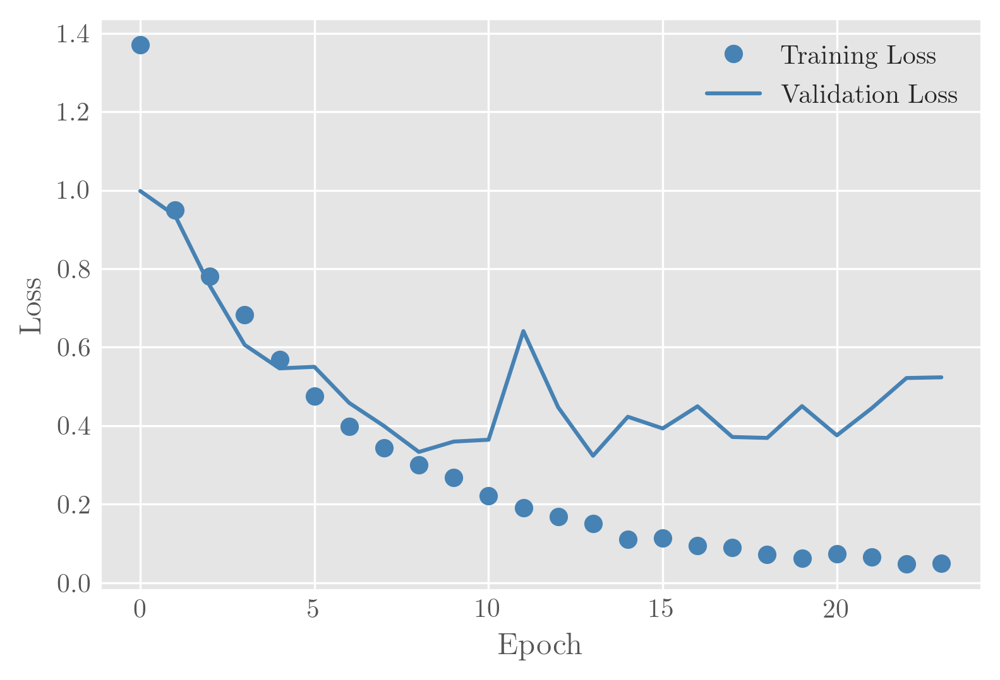

In [ ]:
# Alternative Visualization
accuracy = history_new['accuracy']
val_accuracy = history_new['val_accuracy']
loss = history_new['loss']
val_loss = history_new['val_loss']
epochs = range(len(accuracy))
plt.plot(epochs, accuracy, 'bo', label='Training Accuracy', color="steelblue")
plt.plot(epochs, val_accuracy, 'b', label='Validation Accuracy', color="steelblue")
#plt.title('Training and Validation Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend()
plt.savefig('Validation_Accuracy_Baseline.pdf')  
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training Loss', color="steelblue")
plt.plot(epochs, val_loss, 'b', label='Validation Loss', color="steelblue")
#plt.title('Training and Validation Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend()
plt.savefig('Validation_Loss_Baseline.pdf')  
plt.show()


In [ ]:
model_cnn_baseline = keras.models.load_model('/content/drive/MyDrive/EuroSat_Clean/Model_CNN_baseline')

In [ ]:
model_cnn_baseline = keras.models.load_model('/content/drive/MyDrive/EuroSat_Clean/Model_CNN_baseline')

predictions_test = model_cnn_baseline.predict(X_test)
preds_test = np.argmax(predictions_test, axis = 1)

print(classification_report(y_test, preds_test))

print(model_cnn_baseline.evaluate(X_test, y_test))



              precision    recall  f1-score   support

           0       0.90      0.89      0.89       612
           1       0.95      0.98      0.97       597
           2       0.86      0.79      0.82       616
           3       0.85      0.81      0.83       528
           4       0.97      0.89      0.93       503
           5       0.91      0.85      0.88       368
           6       0.76      0.85      0.80       505
           7       0.95      0.97      0.96       598
           8       0.81      0.89      0.85       482
           9       0.97      0.99      0.98       591

    accuracy                           0.89      5400
   macro avg       0.89      0.89      0.89      5400
weighted avg       0.90      0.89      0.89      5400

169/169 [==============================] - 2s 9ms/step - loss: 0.3402 - accuracy: 0.8939
[0.3402248024940491, 0.8938888907432556]


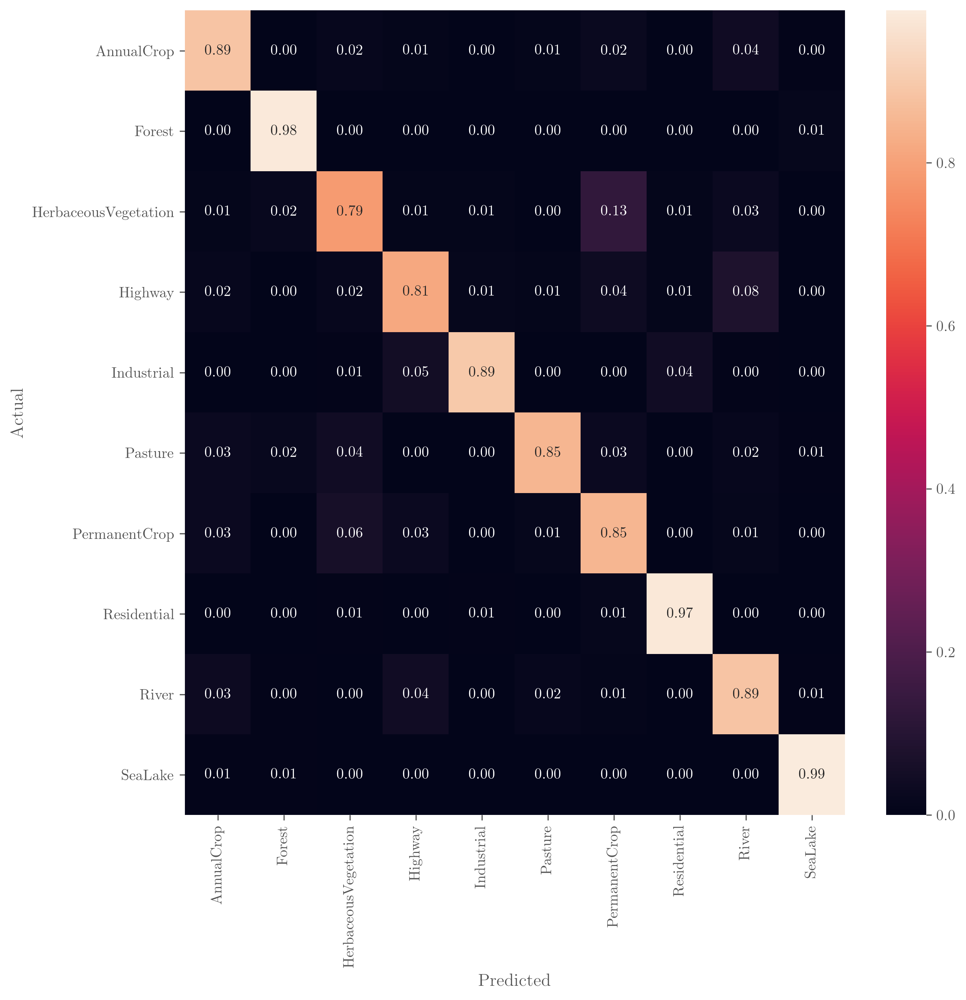

In [ ]:
# Create confusion matrix
preds_test = np.argmax(predictions_test, axis = 1)

cm = confusion_matrix(y_test, preds_test)
labels = ['AnnualCrop','Forest','HerbaceousVegetation','Highway',
        'Industrial','Pasture','PermanentCrop','Residential','River','SeaLake']

# Normalise
cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(cmn, annot=True, fmt='.2f', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show(block=False)

### Experimentation: Fine-Tuning the Custom CNN
Now we come to the centerpiece of our project: fine-tuning and experimenting with different features of our network. 

In a first step, we will perform data augmentation based on imbalanced classes. Subsequently, different features like a cyclic learning rate, different numbers of neurons per hidden layer, the depth of the model, different activation functions, filters, kernel sizes, batch normalization and dropout rates will be examined and optimized for our purposes.

#### Perform Data Augmentation

Since we only have 27'000 images to classify, which were further reduced to account for balanced samples, we will use a data augmentation strategy to increase the number of our training images artificially. 

Data augmentation is a way to account for overfitting issues by generating new variations of a specific training instance. It enables the creation of new training instances belonging to the same class as the base instance, especially computer vision issues. In general, data augmentation adjusts the model to become more tolerant towards image specifications and thus enables the network to value generalisations of classes. 

Data augmentation generates copies of the original conducting a wide range of techniques to slightly and randomly change it. 

We will use the package "ImageDataGenerator", the most widely used software for data augmentation, throughout our training procedure. Compileable with Keras and Tensorflow, we can adjust visual representations of data on multiple levels. These levels include: 

- **Rotation Range**: Random Rotation of an image from 0 to 360 degrees. In our case appropriate since image classification of satellite data is from a birds-eye view
- **Random Shift**: Shifts the data randomly from the centre in a pre-specified range. Available for both height and width 
- **Random Flips**: Flips images on the vertical or horizontal axis. This is only sensible in the case of symmetric data and, thus, the application must be pre-determined by data constraints. 
- **Random Brightness**: Changes Brightness of the image
- **Random Zoom**: Zooms in/out of the original image within a pre-specified range

The most widespread method for data augmentation is called "On the Fly", which is also the default mode by the software we are implementing. During the training process, the model does not train on the initial instance but only on the generated instance, which changes at each epoch. It ensures that the model receives new variations of the images at each epoch while not adding them to the overall image corpus. Due to this batchification procedure, we prevent overfitting (as the model does not see the same image multiple times) while requiring lower memory costs. 

Throughout the implementation, the software creates $\frac{\text{Number of training samples}}{\text{Batch Size}}$ per epoch. This way, each training sample is augmented only one time per epoch, and the overfitting issue is reduced. However, the number of training images does not increase for an epoch compared to the original setting. Rather, we apply augmentation to increase the overall amount of images available throughout the entire training process. 

Note that we decide to use the data augmentation from the beginning as it serves as a suitable means to optimise storage capacity and prevent changing the number of epochs resulting from image augmentation inclusion decisions. 





In [ ]:
# We use the ImageDataGenerator to augment our images
datagen = ImageDataGenerator(rotation_range=15, width_shift_range=0.25, height_shift_range=0.25, horizontal_flip=True, zoom_range=0.1)
train_data_aug = datagen.flow(X_train, y_train, batch_size=10)

#### Initial Ranges of Hyperparameters 

Tuning hyperparameters requires the architects to define an initial range of potential values per parameter the original model can choose from. Hypothetically, this range could cover all values that ensure a successful compiling of the model. However, due to time constraints and to ensure consistency with previous research, we deem it reasonable to orientate on commonly accepted factor ranges for CNN architectures initially. Especially, since we use the slightly adjusted VGGNet Model used by the Stanford Visual Recognition team as baseline model (https://cs231n.github.io/convolutional-networks/), we will follow their assessments on initial ranges based on the hyperparameters (I) Kernel Size (II) Filter Size (III) Pooling Layer as well as (IV) Padding. Moreover, we will follow guidance by Géron (2018) (Aurélien Géron. "Hands-On Machine Learning with Scikit-Learn, Keras, and TensorFlow") to initially set options for the number of (V) Neurons per Hidden Layer, (VI) Batch Sizes and Epochs, (VII) Activation functions, (VIII) Learning Rates, (IX) Batch Normalization features as well as (X) Dropout Rates. Note that, for defining neurons per hidden layer, we multiply the potential values by a factor of 2, 4, 8 and 16 to create a triangular shape of the model, as it is common in practice. Furthermore, we decide against using multiple optimizers, such as Nesterov, SGD or RMSProp, and instead apply the Adam optimizer directly, as it is commonly accepted that this optimizer outperforms the alternatives based on convergence speed and quality when applying deep neural network structures (Géron, 2018). However, to ensure some form of variation, we use an important modification of the optimizer by applying an approach called cyclic learning rate (Smith, 2017), which we will describe below.

#### Batch Size and Epochs

From the initial assessment above, we notice that the accuracy of the model is still very far from what could be deemed acceptable. As such, we will train the hyperparameters accordingly. We start with defining the optimal choices for finetuning the batch size as well as the epochs. 

- **Batch Size**: The batch size is a hyperparameter that defines the number of samples to work through before updating the internal model parameters. As such, it tells us how many training samples are used to create one batch of outputs.

- **Epochs**: On the other hand, an epoch is a hyperparameter that defines the number of times that the learning algorithm will work through the entire training dataset. One epoch means that each sample in the training dataset has had an opportunity to update the internal model parameters. An epoch comprises one or more batches (the exact number here is: sample/n = n batches; if all batches are updated once, then the epoch is completed). 

We start with those two hyperparameters since they are the most fundamental. Furthermore, they do not depend on the other hyperparameters. Although we will then run more epochs for the final model(s), we still need to configure the parameters without requiring too much time. 

In [ ]:
# We use the initial structure from Stanford Convolutional Neural Networks (CNNs / ConvNets) for Visual Recognition learning source 

def conv_model(bs = 50, ep = 100):
  # Define the model 
  model_cnn = keras.models.Sequential()
  model_cnn.add(keras.layers.Conv2D(filters=64, kernel_size = 3, activation = "relu", kernel_initializer="he_normal", padding = "same", input_shape = [64,64,3]))
  model_cnn.add(keras.layers.Conv2D(filters=64, kernel_size = 3, activation = "relu", kernel_initializer="he_normal", padding = "same")) 
  model_cnn.add(keras.layers.MaxPooling2D(pool_size = 2, strides = 2))
  model_cnn.add(keras.layers.Conv2D(filters=128, kernel_size = 3, activation = "relu", kernel_initializer="he_normal", padding = "same")) 
  model_cnn.add(keras.layers.Conv2D(filters=128, kernel_size = 3, activation = "relu", kernel_initializer="he_normal", padding = "same")) 
  model_cnn.add(keras.layers.MaxPooling2D(pool_size = 2, strides = 2))
  model_cnn.add(keras.layers.Conv2D(filters=256, kernel_size = 3, activation = "relu", kernel_initializer="he_normal", padding = "same")) 
  model_cnn.add(keras.layers.Conv2D(filters=256, kernel_size = 3, activation = "relu", kernel_initializer="he_normal", padding = "same")) 
  model_cnn.add(keras.layers.Conv2D(filters=256, kernel_size = 3, activation = "relu", kernel_initializer="he_normal", padding = "same")) 
  model_cnn.add(keras.layers.MaxPooling2D(pool_size = 2, strides = 2))
  model_cnn.add(keras.layers.Conv2D(filters=512, kernel_size = 3, activation = "relu", kernel_initializer="he_normal", padding = "same")) 
  model_cnn.add(keras.layers.Conv2D(filters=512, kernel_size = 3, activation = "relu", kernel_initializer="he_normal", padding = "same")) 
  model_cnn.add(keras.layers.Conv2D(filters=512, kernel_size = 3, activation = "relu", kernel_initializer="he_normal", padding = "same")) 
  model_cnn.add(keras.layers.MaxPooling2D(pool_size = 2, strides = 2))
  model_cnn.add(keras.layers.Conv2D(filters=512, kernel_size = 3, activation = "relu", kernel_initializer="he_normal", padding = "same")) 
  model_cnn.add(keras.layers.Conv2D(filters=512, kernel_size = 3, activation = "relu", kernel_initializer="he_normal", padding = "same")) 
  model_cnn.add(keras.layers.Conv2D(filters=512, kernel_size = 3, activation = "relu", kernel_initializer="he_normal", padding = "same")) 
  model_cnn.add(keras.layers.MaxPooling2D(pool_size = 2, strides = 2))
  model_cnn.add(keras.layers.Flatten())
  model_cnn.add(keras.layers.Dense(512, activation = "relu", kernel_initializer="he_normal"))
  model_cnn.add(keras.layers.Dense(256, activation = "relu", kernel_initializer="he_normal"))
  model_cnn.add(keras.layers.Dense(10, activation = "softmax"))
  # Compile the model
  ## Note:
  ### As usual in classification problems we use the categorical crossentropy as the loss function
  ### We use the Adam method as the optimizer with learning rate 0.01 for initialisation
  ### We set the argument metrics to "accuracy", such that Keras computes and outputs the accuracy of the model on the validation set while it is trained
  model_cnn.compile(loss="sparse_categorical_crossentropy",
                optimizer=keras.optimizers.Adam(learning_rate=0.0001),
                metrics=["accuracy"])
    
  return model_cnn

# To ensure that our model training histories are labelled nicely in tensorboard including a time indication of when the model has been fitted, 
## we define a variable to capture the exact logdirectory and assign this directory to the tensorboard callback afterwards.
logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_cb = TensorBoard(logdir, histogram_freq=1)

# To prevent overfitting, we introduce early stopping, such that the training is stopped as soon as no improovement has been monitored over 10 periods according to the validation accuracy
early_stopping_cb = EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True)
#early_stopping_cb = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

In [ ]:
# Create a function to perform grid search
def best_hyp_initial_CNN(X_train, y_train, X_valid, y_valid, n_hidden_range=[0,2], nh_neurons_range=[30,50,70,100], 
             activations=["relu","elu"], lr_range=[0.001,0.0005], batch_norm_range=[True,False], batch_size = [40,50,60,70,80,90,100], epochs = [40,50,60,70,80,90,100] ):
  # Create a variable to store the best score seen so far
  best_score = 0
  # Set up a loop to go through all possible parameter combinations
  for bs in batch_size:
    for ep in epochs:
      # Fit the model  
      model_cnn = conv_model(bs, ep)
      history = model_cnn.fit(train_data_aug, batch_size=bs, steps_per_epoch=len(X_train)/bs, epochs=ep, verbose=1,
                              validation_data=(X_valid, y_valid), 
                              callbacks=[early_stopping_cb]) 
      # Calculate losses and accuracy
      loss, accuracy = model_cnn.evaluate(X_valid, y_valid, verbose=0)
      print('Using a batch size of', bs, 'and an epoch size of', ep, 'the initial model achieves a validation accuracy of', accuracy)    
      if accuracy > best_score:
        best_score = accuracy
        best_model = model_cnn
        best_params = [bs, ep]
        print("The best test accuracy so far is:", best_score)

  return best_score, best_params

In [ ]:
# Note, we need to run the batch sizes separately since the RAM is used to the max and the server crashes if we would attempt to train more parameters
score, params = best_hyp_initial_CNN(X_train, y_train, X_valid, y_valid, batch_size = [40,50,60,70,80,90,100], epochs = [40,50,60,70,80,90,100])

print("The best overall Accuracy score is:", score)
print("The Best model parameters are:", params)

Streaming output truncated to the last 5000 lines.
415/415 [==============================] - 8s 20ms/step - loss: 0.2684 - accuracy: 0.9062 - val_loss: 0.3439 - val_accuracy: 0.9030
Epoch 56/100
415/415 [==============================] - 8s 20ms/step - loss: 0.2696 - accuracy: 0.9059 - val_loss: 0.3841 - val_accuracy: 0.8780
Epoch 57/100
415/415 [==============================] - 8s 19ms/step - loss: 0.2667 - accuracy: 0.9122 - val_loss: 0.2901 - val_accuracy: 0.9088
Epoch 58/100
415/415 [==============================] - 8s 20ms/step - loss: 0.2402 - accuracy: 0.9221 - val_loss: 0.2070 - val_accuracy: 0.9360
Epoch 59/100
415/415 [==============================] - 8s 20ms/step - loss: 0.2958 - accuracy: 0.9079 - val_loss: 0.3764 - val_accuracy: 0.8824
Epoch 60/100
415/415 [==============================] - 8s 19ms/step - loss: 0.2158 - accuracy: 0.9264 - val_loss: 0.3722 - val_accuracy: 0.8834
Epoch 61/100
415/415 [==============================] - 8s 20ms/step - loss: 0.2750 - accura

After running the different combinations, we understand that the optimal batch size is 40 with epochs of 80. 

In [ ]:
# Data augmentation
datagen = ImageDataGenerator(height_shift_range=0.25, horizontal_flip=True, zoom_range=0.1)
train_data_aug = datagen.flow(X_train, y_train, batch_size=40)

# Note that we already defined the batchsize here, but we need to change it accordingly in the subsequent training sessions
# We use the initial structure from Stanford Convolutional Neural Networks (CNNs / ConvNets) for Visual Recognition learning source 

def conv_model_tuned(nh_neurons = 32, fil = 64, k_size = 3, p_size = 2, stri = 2, pad = "same", activ = "relu",  lr = 0.01, batch_norm = False, drop = 0.2, deeper = False):

  if activ == "selu":
    k_init = "lecun_normal"
  else:
    k_init = "he_normal"
  
  model_cnn = keras.models.Sequential()
  model_cnn.add(keras.layers.Conv2D(filters=fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad, input_shape = [64,64,3]))
  
  if batch_norm == True & deeper == True: 
  
    model_cnn.add(keras.layers.Conv2D(filters=fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(BatchNormalization())
    model_cnn.add(keras.layers.MaxPooling2D(pool_size = p_size, strides = stri))
    model_cnn.add(Dropout(drop))
    model_cnn.add(keras.layers.Conv2D(filters=2*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(BatchNormalization())
    model_cnn.add(keras.layers.Conv2D(filters=2*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(BatchNormalization())
    model_cnn.add(keras.layers.MaxPooling2D(pool_size = p_size, strides = stri))
    model_cnn.add(Dropout(drop))
    model_cnn.add(keras.layers.Conv2D(filters=4*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(BatchNormalization())
    model_cnn.add(keras.layers.Conv2D(filters=4*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(BatchNormalization())
    model_cnn.add(keras.layers.Conv2D(filters=4*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(BatchNormalization())
    model_cnn.add(keras.layers.MaxPooling2D(pool_size = p_size, strides = stri))
    model_cnn.add(Dropout(drop))
    model_cnn.add(keras.layers.Conv2D(filters=8*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(BatchNormalization())
    model_cnn.add(keras.layers.Conv2D(filters=8*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(BatchNormalization())
    model_cnn.add(keras.layers.Conv2D(filters=8*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(BatchNormalization())
    model_cnn.add(keras.layers.MaxPooling2D(pool_size = p_size, strides = stri))
    model_cnn.add(Dropout(drop))
    model_cnn.add(keras.layers.Conv2D(filters=8*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(BatchNormalization())
    model_cnn.add(keras.layers.Conv2D(filters=8*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(BatchNormalization())
    model_cnn.add(keras.layers.Conv2D(filters=8*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(BatchNormalization())
    model_cnn.add(keras.layers.MaxPooling2D(pool_size = p_size, strides = stri))
    model_cnn.add(Dropout(drop))
    model_cnn.add(keras.layers.Flatten())
    model_cnn.add(keras.layers.Dense(nh_neurons*16, activation = activ, kernel_initializer = k_init))
    model_cnn.add(Dropout(drop))    
    model_cnn.add(BatchNormalization())
    model_cnn.add(keras.layers.Dense(nh_neurons*8, activation = activ, kernel_initializer = k_init))
    model_cnn.add(Dropout(drop))    
    model_cnn.add(BatchNormalization())
    model_cnn.add(keras.layers.Dense(nh_neurons*4, activation = activ, kernel_initializer = k_init))
    model_cnn.add(Dropout(drop))  
    model_cnn.add(keras.layers.Dense(10, activation = "softmax"))

  elif batch_norm == False & deeper == True:

    model_cnn.add(keras.layers.Conv2D(filters=fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(keras.layers.MaxPooling2D(pool_size = p_size, strides = stri))
    model_cnn.add(Dropout(drop))
    model_cnn.add(keras.layers.Conv2D(filters=2*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(keras.layers.Conv2D(filters=2*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(keras.layers.MaxPooling2D(pool_size = p_size, strides = stri))
    model_cnn.add(Dropout(drop))
    model_cnn.add(keras.layers.Conv2D(filters=4*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(keras.layers.Conv2D(filters=4*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(keras.layers.Conv2D(filters=4*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(keras.layers.MaxPooling2D(pool_size = p_size, strides = stri))
    model_cnn.add(Dropout(drop))
    model_cnn.add(keras.layers.Conv2D(filters=8*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(keras.layers.Conv2D(filters=8*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(keras.layers.Conv2D(filters=8*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(keras.layers.MaxPooling2D(pool_size = p_size, strides = stri))
    model_cnn.add(Dropout(drop))
    model_cnn.add(keras.layers.Conv2D(filters=8*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(keras.layers.Conv2D(filters=8*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(keras.layers.Conv2D(filters=8*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(keras.layers.MaxPooling2D(pool_size = p_size, strides = stri))
    model_cnn.add(Dropout(drop))
    model_cnn.add(keras.layers.Flatten())
    model_cnn.add(keras.layers.Dense(nh_neurons*16, activation = activ, kernel_initializer = k_init))
    model_cnn.add(Dropout(drop))    
    model_cnn.add(keras.layers.Dense(nh_neurons*8, activation = activ, kernel_initializer = k_init))
    model_cnn.add(Dropout(drop))    
    model_cnn.add(keras.layers.Dense(nh_neurons*4, activation = activ, kernel_initializer = k_init))
    model_cnn.add(Dropout(drop))  
    model_cnn.add(keras.layers.Dense(10, activation = "softmax"))

  elif batch_norm == True & deeper == False: 
  
    model_cnn.add(keras.layers.Conv2D(filters=fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(BatchNormalization())
    model_cnn.add(keras.layers.MaxPooling2D(pool_size = p_size, strides = stri))
    model_cnn.add(Dropout(drop))
    model_cnn.add(keras.layers.Conv2D(filters=2*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(BatchNormalization())
    model_cnn.add(keras.layers.MaxPooling2D(pool_size = p_size, strides = stri))
    model_cnn.add(Dropout(drop))
    model_cnn.add(keras.layers.Conv2D(filters=4*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(BatchNormalization())
    model_cnn.add(keras.layers.Conv2D(filters=4*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(BatchNormalization())
    model_cnn.add(keras.layers.MaxPooling2D(pool_size = p_size, strides = stri))
    model_cnn.add(Dropout(drop))
    model_cnn.add(keras.layers.Conv2D(filters=8*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(BatchNormalization())
    model_cnn.add(keras.layers.Conv2D(filters=8*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(BatchNormalization())
    model_cnn.add(keras.layers.MaxPooling2D(pool_size = p_size, strides = stri))
    model_cnn.add(Dropout(drop))
    model_cnn.add(keras.layers.Conv2D(filters=8*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(BatchNormalization())
    model_cnn.add(keras.layers.Conv2D(filters=8*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(BatchNormalization())
    model_cnn.add(keras.layers.MaxPooling2D(pool_size = p_size, strides = stri))
    model_cnn.add(Dropout(drop))
    model_cnn.add(keras.layers.Flatten())
    model_cnn.add(keras.layers.Dense(nh_neurons*16, activation = activ, kernel_initializer = k_init))
    model_cnn.add(Dropout(drop))    
    model_cnn.add(BatchNormalization())
    model_cnn.add(keras.layers.Dense(nh_neurons*8, activation = activ, kernel_initializer = k_init))
    model_cnn.add(Dropout(drop))    
    model_cnn.add(BatchNormalization())
    model_cnn.add(keras.layers.Dense(nh_neurons*4, activation = activ, kernel_initializer = k_init))
    model_cnn.add(Dropout(drop))  
    model_cnn.add(keras.layers.Dense(10, activation = "softmax"))

  else:

    model_cnn.add(keras.layers.Conv2D(filters=fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(keras.layers.MaxPooling2D(pool_size = p_size, strides = stri))
    model_cnn.add(Dropout(drop))
    model_cnn.add(keras.layers.Conv2D(filters=2*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad))  
    model_cnn.add(keras.layers.MaxPooling2D(pool_size = p_size, strides = stri))
    model_cnn.add(Dropout(drop))
    model_cnn.add(keras.layers.Conv2D(filters=4*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(keras.layers.Conv2D(filters=4*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(keras.layers.MaxPooling2D(pool_size = p_size, strides = stri))
    model_cnn.add(Dropout(drop))
    model_cnn.add(keras.layers.Conv2D(filters=8*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(keras.layers.Conv2D(filters=8*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(keras.layers.MaxPooling2D(pool_size = p_size, strides = stri))
    model_cnn.add(Dropout(drop))
    model_cnn.add(keras.layers.Conv2D(filters=8*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(keras.layers.Conv2D(filters=8*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(keras.layers.MaxPooling2D(pool_size = p_size, strides = stri))
    model_cnn.add(Dropout(drop))
    model_cnn.add(keras.layers.Flatten())
    model_cnn.add(keras.layers.Dense(nh_neurons*16, activation = activ, kernel_initializer = k_init))
    model_cnn.add(Dropout(drop))    
    model_cnn.add(keras.layers.Dense(nh_neurons*8, activation = activ, kernel_initializer = k_init))
    model_cnn.add(Dropout(drop))    
    model_cnn.add(keras.layers.Dense(nh_neurons*4, activation = activ, kernel_initializer = k_init))
    model_cnn.add(Dropout(drop))  
    model_cnn.add(keras.layers.Dense(10, activation = "softmax"))

  # Compile the model
  ## Note:
  ### As usual in classification problems we use the categorical crossentropy as the loss function
  ### We use the Adam method as the optimizer with learning rate 0.01 for initialisation
  ### We set the argument metrics to "accuracy", such that Keras computes and outputs the accuracy of the model on the validation set while it is trained
  model_cnn.compile(loss="sparse_categorical_crossentropy",
                optimizer=keras.optimizers.Adam(learning_rate=lr),
                metrics=["accuracy"])
  
  return model_cnn

# To ensure that our model training histories are labelled nicely in tensorboard including a time indication of when the model has been fitted, 
## we define a variable to capture the exact logdirectory and assign this directory to the tensorboard callback afterwards.
logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_cb = TensorBoard(logdir, histogram_freq=1)
# tensorboard_cb = TensorBoard(logdir, histogram_freq=1)
# To prevent overfitting, we introduce early stopping, such that the training is stopped as soon as no improvement has been monitored over 10 periods according to the validation accuracy
early_stopping_cb = EarlyStopping(monitor='val_accuracy', patience=17, restore_best_weights=True) 

#### Cyclic Learning Rate 

Since an appropriate learning rate is crucial to help the model converge more quickly, we apply a more sophisticated approach in the following. As we know, we initialized the optimizer to be Adam based on the notion that it combines two essential considerations: Adaptive Learning rates and Momentum. As is known, Adam uses two sets of Moments; the first, mean-based moment, and the second, decentralized variance moment. It also defines a specific "decay rate", which defines in which interval, or length, the moments should be adjusted. $\beta$ values indicate this rate, empirically found to be optimal at 0.9 and 0.99, respectively (the default setting). 

However, we decide to further tune this hyperparameter by following the approach proposed by Smith (2017). He argues that using a cyclical learning rate can additionally increase model performance as it changes parameters within a pre-defined interval according to some cycles. The idea of introducing a cyclical learning rate is to use a learning rate parameter that changes in magnitude for each cycle to gradually converge to an optimal rate such that training time and model accuracy can be improved. CLR means that the learning rate transgresses within a pre-defined interval. As such, it should address the problems of saddle points that lead to non globally optimal moments. In general, if the learning rate is at the upper bound and has a high value, the model can diverge quickly from saddle points, which is also given by the momentum strategy. However, this is complemented by a lower bound, allowing us to approach a global minimum more quickly. As such, we decided to additionally constrain the optimizer function in combination with the Adam optimizer. We are then expected to have an adaptive learning rate focusing on two distinct moments and define a gradual direction of the adaptive learning rate, including decay parameters and a given range. That is, we put an additional, iterative constraint on our momentum strategy with Adam and its beta values. To set up the cyclical learning rate callback appropriately, we must find some upper and lower bound and a cycle length, indicating the length of each max-min circuit. To do so, we follow the argumentation of Smith (2017): 

1. The cycle length (or step size) should be between 2-10 times the number of iterations divided by the batch size. Hence, we choose the step size to be $\frac{5\cdot N}{10}$ (where N stands for the number of observations in the training data).
2. The min and max values for the learning rate are given through an iterative training process similar to defining the initial learning rate in different settings. We just ran the model for different learning rates between 0.0001 and 0.001 and observed that the performance of the models did not vary too much. Hence, we choose 0.0001 as the lower bound and 0.001 as the upper bound.

Another advantage when working with a cyclical learning rate is that the selection of the initial learning rate becomes a minor concern, as the learning is anyway changing during the training process. Hence, we set the initial learning rate to be 0.0009, as this value appeared to lead to the best performing model the according to grid search described above. We observe that using a cyclical learning rate indeed increases the model's prediction accuracy while also causing the model to converge rather quickly. Hence, we decided to apply the cyclical learning rate strategy with an initial learning rate fixed to 0.0009 in all subsequent models.

In [ ]:
# We now use the Cyclic LR defined below 
# Define the above described clr callback to achieve an optimal learning rate
step_size = int((5*len(X_train)/40)) #( Number of iterations * 5 / batch size )
clr = CyclicLR(base_lr=0.0001, max_lr=0.001, step_size=step_size, mode='triangular')

In [ ]:
# Create a function to perform grid search
def best_hyp_CNN(X_train, y_train, X_valid, y_valid, X_test, y_test, nh_neurons_range=[16,32], deeper_range = [False], activations=["relu"], 
                 lr_range=[0.0001], filters = [64], kernel_size = [3], pool_size = [2], strides = [2], padding = ["same"], 
                 batch_norm_range=[False], dropout_rate = [0.2]):
  # Create a variable to store the best score seen so far
  predicted_targets = np.array([])
  actual_targets = np.array([])
  best_score = 0
  # Set up a loop to go through all possible parameter combinations
  for nh_neurons in nh_neurons_range:
    for deeper in deeper_range:
      for activ in activations:
        for lr in lr_range:
          for fil in filters:
            for k_size in kernel_size:
              for p_size in pool_size:
                for stri in strides:
                  for pad in padding:
                    for batch_norm in batch_norm_range:
                      for drop in dropout_rate:
                        # Assign the model
                        model_cnn = conv_model_tuned(nh_neurons, fil, k_size, p_size, stri, pad, activ, lr, batch_norm, drop, deeper)
                        # Fit the model  
                        history = model_cnn.fit(train_data_aug, batch_size=40, steps_per_epoch=len(X_train)/40, epochs=80, verbose=1,
                                                validation_data=(X_valid, y_valid), 
                                                callbacks=[early_stopping_cb, clr, tensorboard_cb]) 
                        # Get predicted values
                        predictions = model_cnn.predict(X_valid)
                        # This is to store the predicted and actual target values for the confusion matrix in the end
                        predicted_targets = np.append(predicted_targets, predictions)
                        actual_targets = np.append(actual_targets, y_valid)
                        # Calculate losses
                        loss, accuracy = model_cnn.evaluate(X_valid, y_valid, verbose=0)
                        print("The parameter combination", [nh_neurons, deeper, activ, lr, fil, k_size, p_size, stri, pad, batch_norm, drop], "leads to a validation accuracy of", model_cnn.evaluate(X_valid, y_valid, verbose=0)[1])
                        if accuracy > best_score:
                          best_score = accuracy
                          best_model = model_cnn
                          best_params = [nh_neurons, deeper, activ, lr, fil, k_size, p_size, stri, pad, batch_norm, drop]
                          print("The best test accuracy so far is:", best_score, "and it is given by the parameter combination:", best_model)

  return best_score, best_model, best_params, predicted_targets, actual_targets, history

#### Neurons per Hidden Layer

In a next step we want to tune the number of hidden layers. The hidden layers of a CNN typically consist of convolutional layers, pooling layers, fully connected layers, and normalization layers.


In [ ]:
# Now let's finetune the hyperparameter for: hidden neurons per layer 
score, model_cnn, params, predicted, actual, history = best_hyp_CNN(X_train, y_train, X_valid, y_valid, X_test, y_test, nh_neurons_range=[16, 32], deeper_range = [False],
                                                           activations=["relu"], lr_range=[0.0001], filters = [64], kernel_size = [3], pool_size = [2], strides = [2], 
                                                           padding = ["same"], batch_norm_range=[False], dropout_rate = [0.2])

print("The best overall Accuracy score is:", score)
print("The Best model parameters are:", params)

Epoch 1/80
415/415 [==============================] - 29s 53ms/step - loss: 2.0870 - accuracy: 0.3329 - val_loss: 4.0363 - val_accuracy: 0.2486
Epoch 2/80
415/415 [==============================] - 21s 50ms/step - loss: 1.1035 - accuracy: 0.6285 - val_loss: 2.2187 - val_accuracy: 0.5026
Epoch 3/80
415/415 [==============================] - 22s 53ms/step - loss: 0.9947 - accuracy: 0.6645 - val_loss: 4.4036 - val_accuracy: 0.2526
Epoch 4/80
415/415 [==============================] - 21s 51ms/step - loss: 0.9122 - accuracy: 0.6901 - val_loss: 3.2761 - val_accuracy: 0.2576
Epoch 5/80
415/415 [==============================] - 21s 50ms/step - loss: 0.8534 - accuracy: 0.7145 - val_loss: 2.7829 - val_accuracy: 0.3922
Epoch 6/80
415/415 [==============================] - 21s 50ms/step - loss: 0.7283 - accuracy: 0.7605 - val_loss: 1.2203 - val_accuracy: 0.6716
Epoch 7/80
415/415 [==============================] - 21s 50ms/step - loss: 0.5949 - accuracy: 0.8093 - val_loss: 1.9186 - val_accuracy:

ValueError: ignored

As we can see from the first test, the best model parameter for th neurons per hidden layer is $t\cdot16$, where $t$ is in the range of $[2,4,8,16]$.

#### Depth of the Model

In a further step, we would now like to look at the depth of our network. 

In [ ]:
# Now let's finetune the hyperparameter for: Depth of the Model

score, model_cnn, params, predicted, actual = best_hyp_CNN(X_train, y_train, X_valid, y_valid, X_test, y_test, nh_neurons_range=[params[0]], deeper_range = [False, True],
                                                           activations=["relu"], lr_range=[0.0001], filters = [64], kernel_size = [3], pool_size = [2], strides = [2], 
                                                           padding = ["same"], batch_norm_range=[False], dropout_rate = [0.2])

print("The best overall Accuracy score is:", score)
print("The Best model parameters are:", params)

Epoch 1/80
415/415 [==============================] - 26s 54ms/step - loss: 1.7014 - accuracy: 0.4334 - val_loss: 4.9251 - val_accuracy: 0.2472
Epoch 2/80
415/415 [==============================] - 19s 47ms/step - loss: 1.0122 - accuracy: 0.6565 - val_loss: 1.5528 - val_accuracy: 0.5878
Epoch 3/80
415/415 [==============================] - 20s 49ms/step - loss: 0.8195 - accuracy: 0.7266 - val_loss: 1.4087 - val_accuracy: 0.6642
Epoch 4/80
415/415 [==============================] - 21s 50ms/step - loss: 0.7104 - accuracy: 0.7581 - val_loss: 1.1115 - val_accuracy: 0.6532
Epoch 5/80
415/415 [==============================] - 19s 47ms/step - loss: 0.7554 - accuracy: 0.7539 - val_loss: 2.4748 - val_accuracy: 0.4452
Epoch 6/80
415/415 [==============================] - 20s 49ms/step - loss: 0.7552 - accuracy: 0.7589 - val_loss: 0.9522 - val_accuracy: 0.7016
Epoch 7/80
415/415 [==============================] - 21s 50ms/step - loss: 0.7241 - accuracy: 0.7687 - val_loss: 1.5330 - val_accuracy:

#### Activation Functions

In this part, we will now look at how different activation functions affect the performance of our network. For this purpose, we will test three possibilities: In addition to ReLU, we will now also test Exponential Linear Unit (ELU) and Scaled Exponential Linear Unit (SELU).

In [ ]:
# Now let's finetune the hyperparameter for: Activation functions
score, model_cnn, params, predicted, actual = best_hyp_CNN(X_train, y_train, X_valid, y_valid, X_test, y_test, nh_neurons_range=[16], deeper_range = [False],
                                                           activations=["relu", "elu", "selu"], lr_range=[0.0001], filters = [64], kernel_size = [3], pool_size = [2], strides = [2], 
                                                           padding = ["same"], batch_norm_range=[False], dropout_rate = [0.2])

print("The best overall Accuracy score is:", score)
print("The Best model parameters are:", params)

Epoch 1/80
415/415 [==============================] - 43s 54ms/step - loss: 2.2333 - accuracy: 0.3150 - val_loss: 2.2344 - val_accuracy: 0.2804
Epoch 2/80
415/415 [==============================] - 20s 49ms/step - loss: 1.1375 - accuracy: 0.6129 - val_loss: 3.2987 - val_accuracy: 0.2318
Epoch 3/80
415/415 [==============================] - 20s 48ms/step - loss: 1.0119 - accuracy: 0.6627 - val_loss: 6.1592 - val_accuracy: 0.2830
Epoch 4/80
415/415 [==============================] - 19s 46ms/step - loss: 0.9290 - accuracy: 0.6850 - val_loss: 3.6670 - val_accuracy: 0.2188
Epoch 5/80
415/415 [==============================] - 20s 49ms/step - loss: 0.8991 - accuracy: 0.6984 - val_loss: 3.9952 - val_accuracy: 0.2478
Epoch 6/80
415/415 [==============================] - 20s 48ms/step - loss: 0.7826 - accuracy: 0.7388 - val_loss: 1.4076 - val_accuracy: 0.6314
Epoch 7/80
415/415 [==============================] - 19s 46ms/step - loss: 0.6567 - accuracy: 0.7855 - val_loss: 2.2021 - val_accuracy:

From the above output, we see that we could not achieve any improvement with the use of ELU and SELU. 

#### Learning Rates
We now come to the most important hyperparameter of our network: the learning rate. The learning rate reflects the amount with which the weights are updated during the training. The learning rate is a positive scalar which determines the step size and is in the interval of $\eta \in [0,1]$.

For our custom CNN, we use the following learning rates: $\eta \in [0.00005, 0.00007, 0.0001, 0.0003, 0.0005, 0.0007, 0.0009, 0.001, 0.01]$



In [ ]:
# Now let's finetune the hyperparameter for: learning rates
score, model_cnn, params, predicted, actual = best_hyp_CNN(X_train, y_train, X_valid, y_valid, X_test, y_test, nh_neurons_range=[16], deeper_range = [False],
                                                           activations=["relu"], lr_range=[0.00005, 0.00007, 0.0001, 0.0003, 0.0005, 0.0007, 0.0009, 0.001, 0.01], filters = [64], kernel_size = [3], pool_size = [2], strides = [2], 
                                                           padding = ["same"], batch_norm_range=[False], dropout_rate = [0.2])

print("The best overall Accuracy score is:", score)
print("The Best model parameters are:", params)

Epoch 1/80
415/415 [==============================] - 62s 63ms/step - loss: 1.9824 - accuracy: 0.3577 - val_loss: 3.8578 - val_accuracy: 0.2102
Epoch 2/80
415/415 [==============================] - 24s 57ms/step - loss: 1.1065 - accuracy: 0.6269 - val_loss: 2.2905 - val_accuracy: 0.3678
Epoch 3/80
415/415 [==============================] - 24s 58ms/step - loss: 0.9827 - accuracy: 0.6626 - val_loss: 6.9215 - val_accuracy: 0.2932
Epoch 4/80
415/415 [==============================] - 24s 58ms/step - loss: 0.8947 - accuracy: 0.6942 - val_loss: 2.2205 - val_accuracy: 0.4814
Epoch 5/80
415/415 [==============================] - 24s 58ms/step - loss: 0.8079 - accuracy: 0.7284 - val_loss: 7.5436 - val_accuracy: 0.2316
Epoch 6/80
415/415 [==============================] - 24s 57ms/step - loss: 0.7628 - accuracy: 0.7428 - val_loss: 2.2060 - val_accuracy: 0.5416
Epoch 7/80
415/415 [==============================] - 24s 58ms/step - loss: 0.6153 - accuracy: 0.7940 - val_loss: 0.8290 - val_accuracy:

Here we receive the best results with $\eta = 0.00007$ and with $\eta = 0.000007$. 

#### Filters

In a next step we would like to look at the filter sizes. We will use two sizes for this: 32 and 64.

In [ ]:
# Now let's finetune the hyperparameter for: filters
score, model_cnn, params, predicted, actual = best_hyp_CNN(X_train, y_train, X_valid, y_valid, X_test, y_test, nh_neurons_range=[16], deeper_range = [False],
                                                           activations=["relu"], lr_range=[params[3]], filters = [32, 64], kernel_size = [3], pool_size = [2], strides = [2], 
                                                           padding = ["same"], batch_norm_range=[False], dropout_rate = [0.2])

print("The best overall Accuracy score is:", score)
print("The Best model parameters are:", params)

Epoch 1/80
415/415 [==============================] - 28s 58ms/step - loss: 1.7643 - accuracy: 0.4073 - val_loss: 2.6264 - val_accuracy: 0.3286
Epoch 2/80
415/415 [==============================] - 22s 53ms/step - loss: 1.0376 - accuracy: 0.6435 - val_loss: 1.5697 - val_accuracy: 0.5614
Epoch 3/80
415/415 [==============================] - 22s 54ms/step - loss: 0.8318 - accuracy: 0.7146 - val_loss: 1.4839 - val_accuracy: 0.5932
Epoch 4/80
415/415 [==============================] - 22s 54ms/step - loss: 0.7370 - accuracy: 0.7526 - val_loss: 3.1305 - val_accuracy: 0.4020
Epoch 5/80
415/415 [==============================] - 22s 53ms/step - loss: 0.7915 - accuracy: 0.7311 - val_loss: 2.5868 - val_accuracy: 0.4418
Epoch 6/80
415/415 [==============================] - 22s 53ms/step - loss: 0.7382 - accuracy: 0.7561 - val_loss: 1.5297 - val_accuracy: 0.5706
Epoch 7/80
415/415 [==============================] - 22s 54ms/step - loss: 0.7489 - accuracy: 0.7585 - val_loss: 0.9805 - val_accuracy:

We can see that with a filter size of 64 we could achieve a significant improvement in performance. Thus, we will commit to a filter size of 64. 

#### Kernel Size

Now we want to optimize the kernel size. The kernel size here refers to the width x height of the filter mask. We test the kernel size of 3 and 5.

In [ ]:
# Now let's finetune the hyperparameter for: Kernel Sizes
score, model_cnn, params, predicted, actual = best_hyp_CNN(X_train, y_train, X_valid, y_valid, X_test, y_test, nh_neurons_range=[params[0]], deeper_range = [params[1]],
                                                           activations=[params[2]], lr_range=[params[3]], filters = [params[4]], kernel_size = [3,5], pool_size = [2], strides = [2], 
                                                           padding = ["same"], batch_norm_range=[False], dropout_rate = [0.2])

print("The best overall Accuracy score is:", score)
print("The Best model parameters are:", params)

Epoch 1/80
415/415 [==============================] - 28s 58ms/step - loss: 1.6853 - accuracy: 0.4360 - val_loss: 4.0348 - val_accuracy: 0.2194
Epoch 2/80
415/415 [==============================] - 22s 54ms/step - loss: 1.0224 - accuracy: 0.6483 - val_loss: 8.2525 - val_accuracy: 0.2214
Epoch 3/80
415/415 [==============================] - 23s 56ms/step - loss: 0.8441 - accuracy: 0.7133 - val_loss: 1.5637 - val_accuracy: 0.6098
Epoch 4/80
415/415 [==============================] - 24s 59ms/step - loss: 0.6919 - accuracy: 0.7706 - val_loss: 0.8474 - val_accuracy: 0.7208
Epoch 5/80
415/415 [==============================] - 25s 59ms/step - loss: 0.6175 - accuracy: 0.7986 - val_loss: 1.5458 - val_accuracy: 0.5994
Epoch 6/80
415/415 [==============================] - 24s 58ms/step - loss: 0.6886 - accuracy: 0.7764 - val_loss: 1.5008 - val_accuracy: 0.5572
Epoch 7/80
415/415 [==============================] - 24s 57ms/step - loss: 0.6820 - accuracy: 0.7786 - val_loss: 1.7899 - val_accuracy:

A kernel size of 3 achieves a better result than a kernel size of 5. 

#### Batch Normalization

Next we use batch normalization. Batch normalization corresponds to a normalization of the data by learning scale and shift variable during training. 

In [ ]:
# Now let's finetune the hyperparameter for: Batch Normalisation
score, model_cnn, params, predicted, actual = best_hyp_CNN(X_train, y_train, X_valid, y_valid, X_test, y_test, nh_neurons_range=[params[0]], deeper_range = [params[1]],
                                                           activations=[params[2]], lr_range=[params[3]], filters = [params[4]], kernel_size = [params[5]], pool_size = [2], strides = [2], 
                                                           padding = ["same"], batch_norm_range=[False, True], dropout_rate = [0.2])

print("The best overall Accuracy score is:", score)
print("The Best model parameters are:", params)

Epoch 1/80
415/415 [==============================] - 29s 60ms/step - loss: 1.7395 - accuracy: 0.4229 - val_loss: 6.7000 - val_accuracy: 0.1142
Epoch 2/80
415/415 [==============================] - 23s 55ms/step - loss: 1.0037 - accuracy: 0.6616 - val_loss: 2.6117 - val_accuracy: 0.4360
Epoch 3/80
415/415 [==============================] - 23s 55ms/step - loss: 0.8245 - accuracy: 0.7160 - val_loss: 1.2332 - val_accuracy: 0.6218
Epoch 4/80
415/415 [==============================] - 23s 55ms/step - loss: 0.7468 - accuracy: 0.7525 - val_loss: 0.9860 - val_accuracy: 0.6690
Epoch 5/80
415/415 [==============================] - 23s 55ms/step - loss: 0.7615 - accuracy: 0.7479 - val_loss: 1.2158 - val_accuracy: 0.6552
Epoch 6/80
415/415 [==============================] - 23s 56ms/step - loss: 0.7584 - accuracy: 0.7438 - val_loss: 3.2731 - val_accuracy: 0.3266
Epoch 7/80
415/415 [==============================] - 23s 56ms/step - loss: 0.7083 - accuracy: 0.7720 - val_loss: 1.7401 - val_accuracy:

Unfortunately, we did not get any performance improvement with batch normalization, so we will not use it in the further course. 

#### Dropout Rates

Next, we would like to perform dropout regularization. Especially the dropout regularization helps us to reduce the problem of overfitting. Dropout works in such a way that a number of layer ouputs are ranomly ignored. 

In [ ]:
# Now let's finetune the hyperparameter for: dropout rate
score, model_cnn, params, predicted, actual = best_hyp_CNN(X_train, y_train, X_valid, y_valid, X_test, y_test, nh_neurons_range=[params[0]], deeper_range = [params[1]],
                                                           activations=[params[2]], lr_range=[params[3]], filters = [params[4]], kernel_size = [params[5]], pool_size = [2], strides = [2], 
                                                           padding = ["same"], batch_norm_range=[params[9]], dropout_rate = [0.05, 0.1, 0.2, 0.4, 0.6, 0.8])

print("The best overall Accuracy score is:", score)
print("The Best model parameters are:", params)

Epoch 1/80
415/415 [==============================] - 30s 62ms/step - loss: 1.3059 - accuracy: 0.5627 - val_loss: 2.4909 - val_accuracy: 0.3602
Epoch 2/80
415/415 [==============================] - 24s 57ms/step - loss: 0.7736 - accuracy: 0.7329 - val_loss: 7.9514 - val_accuracy: 0.1588
Epoch 3/80
415/415 [==============================] - 24s 58ms/step - loss: 0.7792 - accuracy: 0.7302 - val_loss: 1.8473 - val_accuracy: 0.3856
Epoch 4/80
415/415 [==============================] - 24s 57ms/step - loss: 0.7632 - accuracy: 0.7384 - val_loss: 2.3716 - val_accuracy: 0.4422
Epoch 5/80
415/415 [==============================] - 24s 57ms/step - loss: 0.6694 - accuracy: 0.7767 - val_loss: 4.7768 - val_accuracy: 0.2638
Epoch 6/80
415/415 [==============================] - 23s 56ms/step - loss: 0.5805 - accuracy: 0.8065 - val_loss: 0.7934 - val_accuracy: 0.7374
Epoch 7/80
415/415 [==============================] - 24s 57ms/step - loss: 0.4878 - accuracy: 0.8318 - val_loss: 1.8783 - val_accuracy:

From the output above we receive the best results with a dropout rate of 0.1.

In [ ]:
# Reload the overall model again to ensure consistency of the estimates 
score, model_cnn, params, predicted, actual, history = best_hyp_CNN(X_train, y_train, X_valid, y_valid, X_test, y_test, nh_neurons_range=[16], deeper_range = [False],
                                                           activations=["relu"], lr_range=[7e-05], filters = [64], kernel_size = [3], pool_size = [2], strides = [2], 
                                                           padding = ["same"], batch_norm_range=[False], dropout_rate = [0.1])

print("The best overall Accuracy score is:", score)
print("The Best model parameters are:", params)

Epoch 1/80
415/415 [==============================] - 25s 53ms/step - loss: 1.4542 - accuracy: 0.5026 - val_loss: 2.3139 - val_accuracy: 0.5254
Epoch 2/80
415/415 [==============================] - 20s 49ms/step - loss: 0.9277 - accuracy: 0.6800 - val_loss: 5.1108 - val_accuracy: 0.2990
Epoch 3/80
415/415 [==============================] - 21s 51ms/step - loss: 0.7425 - accuracy: 0.7405 - val_loss: 2.2334 - val_accuracy: 0.4630
Epoch 4/80
415/415 [==============================] - 20s 49ms/step - loss: 0.6010 - accuracy: 0.7977 - val_loss: 0.6177 - val_accuracy: 0.8004
Epoch 5/80
415/415 [==============================] - 21s 51ms/step - loss: 0.5136 - accuracy: 0.8270 - val_loss: 0.9759 - val_accuracy: 0.7318
Epoch 6/80
415/415 [==============================] - 21s 49ms/step - loss: 0.5527 - accuracy: 0.8114 - val_loss: 3.6626 - val_accuracy: 0.3798
Epoch 7/80
415/415 [==============================] - 20s 49ms/step - loss: 0.5771 - accuracy: 0.8088 - val_loss: 0.9623 - val_accuracy:

### First Evaluation of Custom CNN

As we can see, the first evaluation shows that an optimal combination of the following hyperparameters exist: 

- **Neurons per Hidden Layer**: 16
- **Depth of the Model**: Shallow
- **Activation function**: Relu
- **Learning Rate**: 0.00007
- **Filter Size**: 64
- **Kernel Size**: 3
- **Pool Size**: 2
- **Strides**: 2
- **Padding**: Same
- **Batch Normalisation**: False 
- **Dropout Rate**: 0.1 

Three things to consider are of especial importance. Initially, we see that a small learning rate paired with a cyclicality range, as given by Smith (2017) appears to suit the most on our data. This could indicate that our model is already quite precise. As such, a small learning rate prevents jumping around a (globally) optimal descent. On the other hand, we see that validation accuracy is dispersed to some extent, which highlights the importance of applying cyclicality to overcome issues of vanishing gradients and sticking around non-globally optimal rates. 

Next, we see that batch normalisation is not required within our setting to improve overall accuracies. That is to be expected, as batch normalisation is usually used for deeper learning architectures with a wider range of parameters and a larger dataset basis. In general, it provides some regularisation by adding a little noise to the network. You can consider batch normalisation as a bit of extra regularization, allowing you to reduce some of the dropout you might add to a network. As already a very low dropout rate appears to deliver the best results, the exclusion of batch normalisation based on its adjacencies to dropout features is consistent. Further, normalisation allows much higher learning rates, increasing the speed at which networks train. As we also find a very low learning rate to deliver the best accuracy, we also assume that normalisation is not well compatible with small rates, thus rendering it indifferent. 


We will now evaluate the model based on the an accuracy score as well as a confusion matrix.

In [ ]:
# Evaluate the model on the test data
model_cnn.evaluate(X_test, y_test)

169/169 [==============================] - 1s 6ms/step - loss: 0.1395 - accuracy: 0.9591


[0.13952933251857758, 0.959074079990387]

In [ ]:
# Start TensorBoard
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

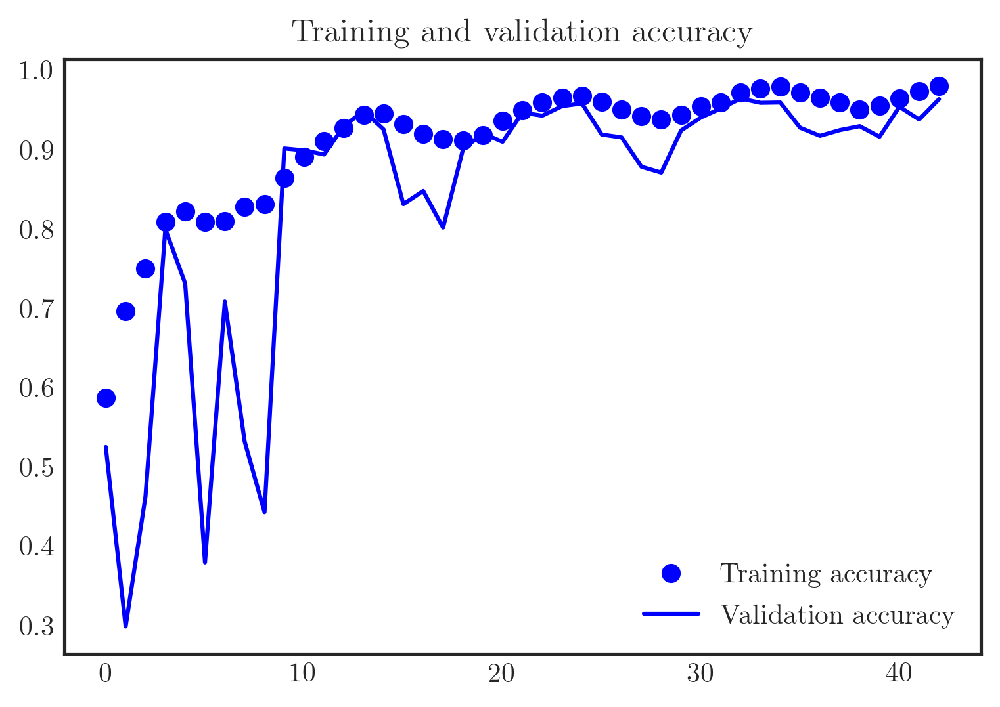

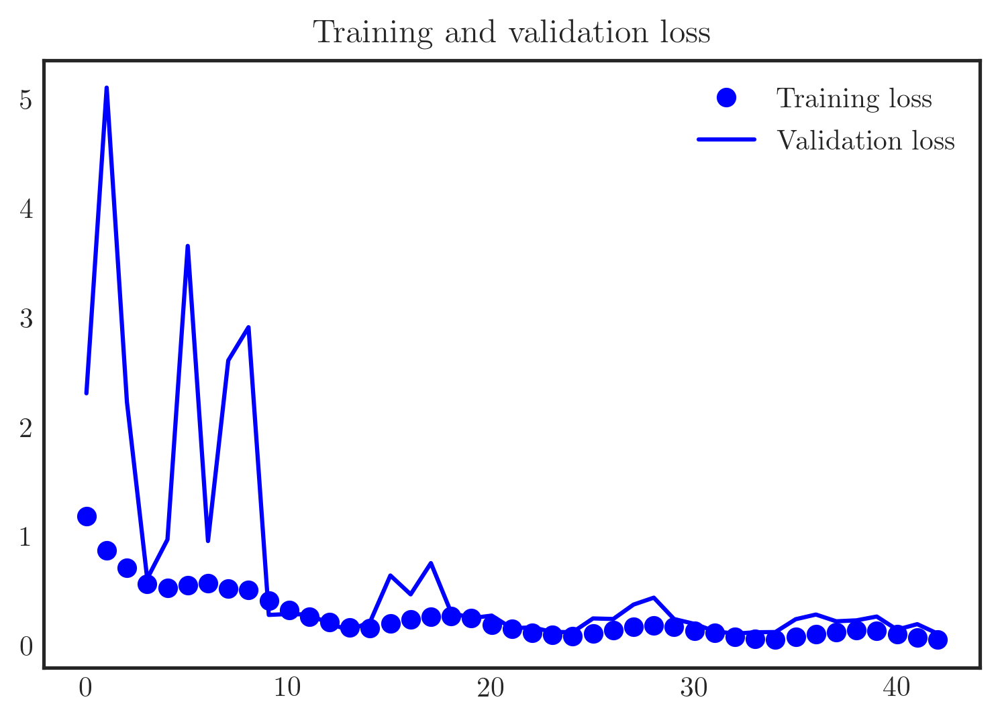

In [ ]:
# Alternative Visualization
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(len(accuracy))
plt.plot(epochs, accuracy, 'bo', label='Training accuracy')
plt.plot(epochs, val_accuracy, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()



dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


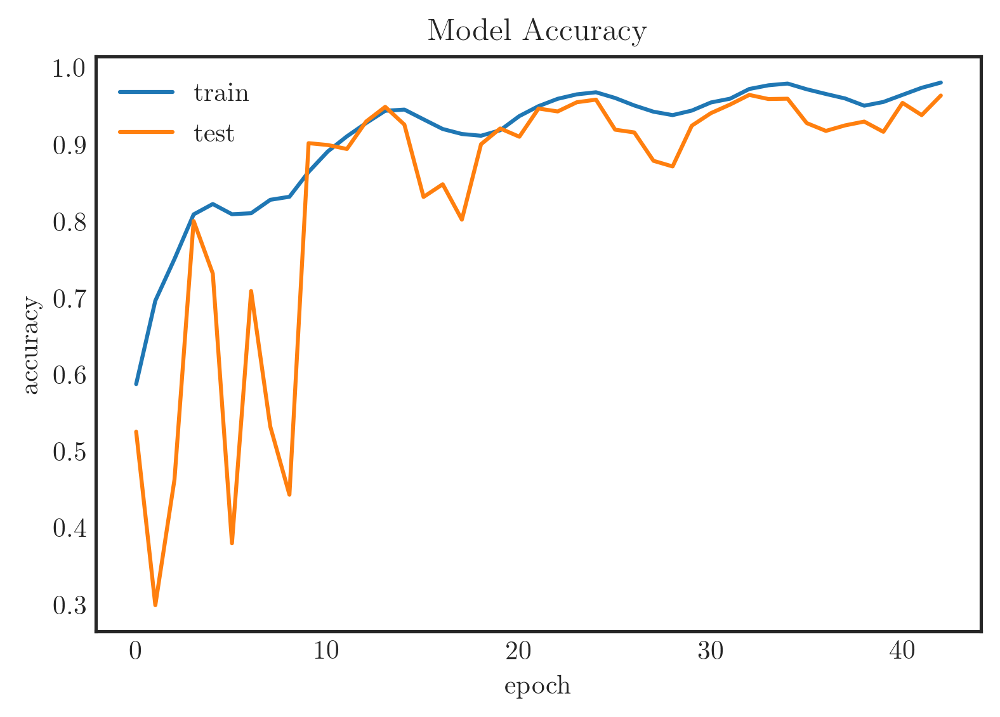

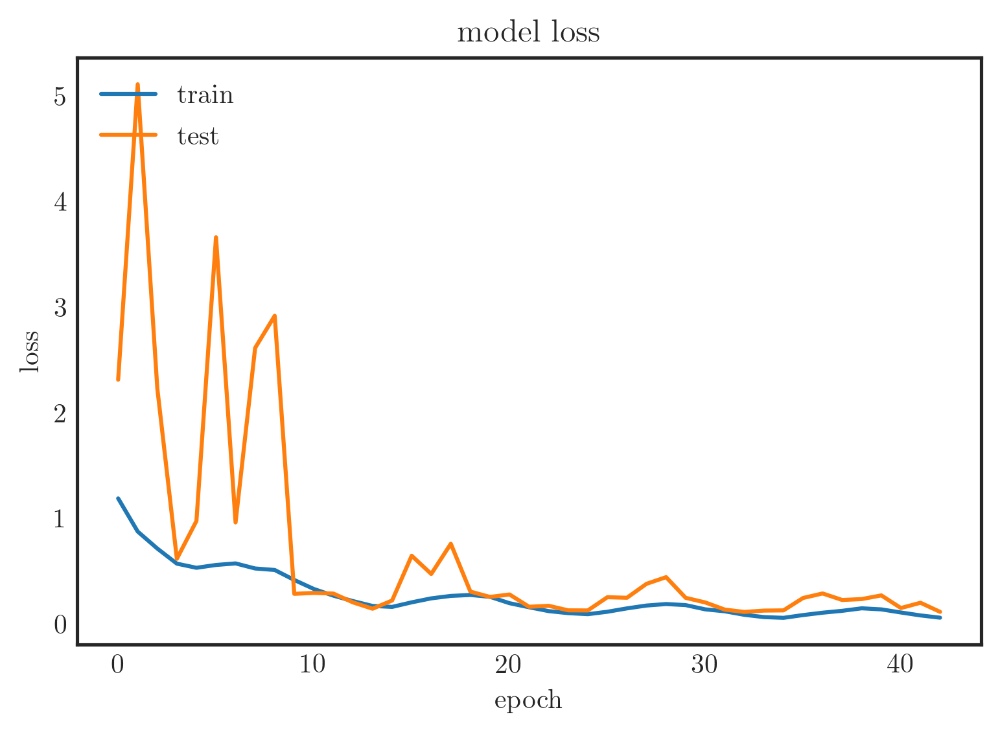

In [ ]:
print("\n")
print(history.history.keys())

# summarize history for accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [ ]:
# show the structure of your model
model_cnn.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_31 (Conv2D)           (None, 64, 64, 64)        1792      
_________________________________________________________________
conv2d_32 (Conv2D)           (None, 64, 64, 64)        36928     
_________________________________________________________________
batch_normalization_26 (Batc (None, 64, 64, 64)        256       
_________________________________________________________________
max_pooling2d_15 (MaxPooling (None, 32, 32, 64)        0         
_________________________________________________________________
dropout_22 (Dropout)         (None, 32, 32, 64)        0         
_________________________________________________________________
conv2d_33 (Conv2D)           (None, 32, 32, 128)       73856     
_________________________________________________________________
batch_normalization_27 (Batc (None, 32, 32, 128)      

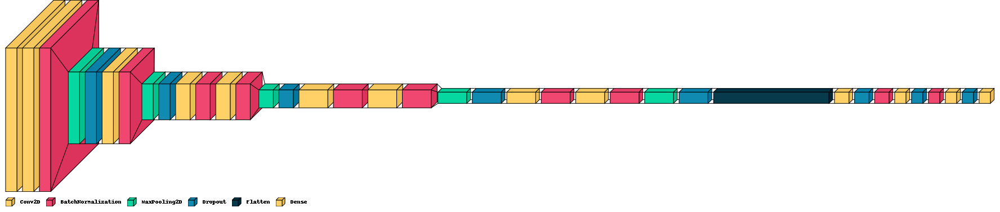

In [ ]:
# Visualize the custom CNN architecture with fine-tuning
visualkeras.layered_view(model_cnn).show() # display using your system viewer
visualkeras.layered_view(model_cnn, to_file='custom_cnn_final.png') # write to disk
visualkeras.layered_view(model_cnn, legend=True, to_file='custom_cnn_final.png').show() # write and show
visualkeras.layered_view(model_cnn, legend=True)

#### Confusion Matrix 


In [ ]:
predictions_test = model_cnn.predict(X_test)
preds_test = np.argmax(predictions_test, axis = 1)

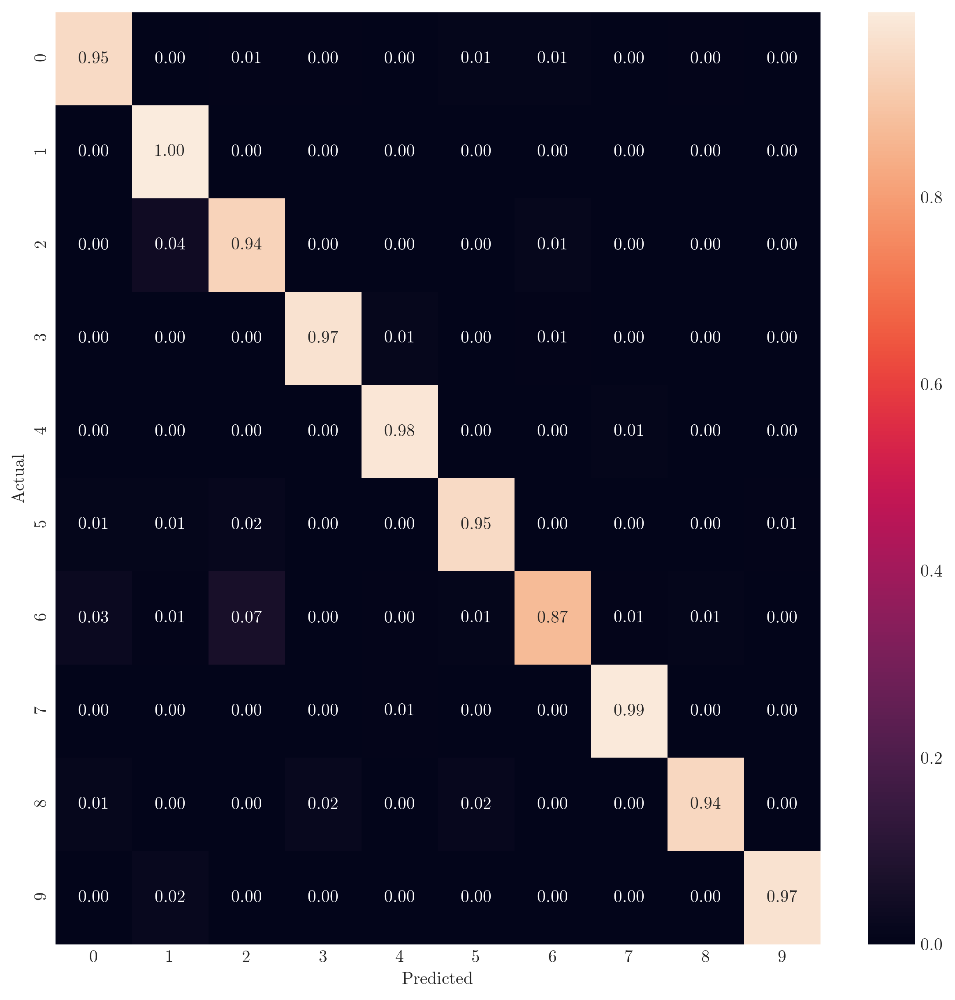

<Figure size 1800x1200 with 0 Axes>

In [ ]:
cm = confusion_matrix(y_test, preds_test)
labels=[0,1,2,3,4,5,6,7,8,9]

# Normalise
cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(cmn, annot=True, fmt='.2f', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show(block=False)
plt.savefig('confusion_matrix1.png')
plt.show()

As we can see, using a customised model and after having tuned 10 parameters, we can display much improved class scores, compared to our baseline model. In general, we were able to improve performance in by approximately 5-10 percentage points, while eight of ten classes experienced an increase in scores. As such, we understand that our tuned model was able to absorb more nuanced, or lower level, characteristics that distinguish classes from one another. For instance, we were able to improve our predictions on highway, industrial sites and rivers, which showed some considerable correlation mismatches during the first iteration, implying that the model did successfully distinguish color, field and shape combinations. Further, we can show that the more nuanced model was able to distinguish different types of land, potentially because it was able to detect colour bands better. On the other hand, we note that, interestingly, it was unable to improve the accuracy between Herbecious Vegetation and permanent crop, indicating a persisting inability to differentiate based on farmland characteristics. This is likely to be due to both classes' cut-off structure, as can be seen below. As such, we assume that the model is able to differentiate the colours, but struggles with the cuts. 

Text(0.5, 1.0, 'Ground Truth : 6')

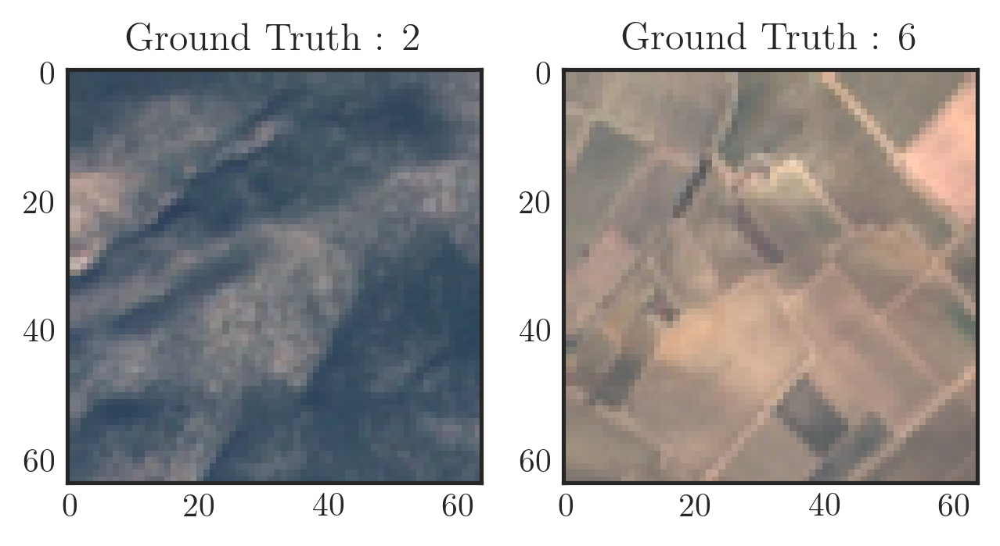

In [ ]:
# Now, we can test whether the images have the correct respective (I) Label (II) Label Name
tmp = 7501
img = XImages[tmp]

tmp2 = 25001
img2 = XImages[tmp2]

# Define figure size
plt.figure(figsize=[5,5])

# Display the first image in training data
plt.subplot(121)
plt.imshow(img)
plt.title("Ground Truth : {}".format(yLabels[tmp]))

# Display the first image in testing data
plt.subplot(122)
plt.imshow(img2)
plt.title("Ground Truth : {}".format(yLabels[tmp2]))


#### Classification Report

In [ ]:
# Print classification report
print(classification_report(y_test, preds_test))

# Save report
report = classification_report(y_test, preds_test, output_dict=True)
classification_df = pd.DataFrame(report).transpose()
classification_df.to_csv ('classification_tuned.csv', index = True, header=True)

              precision    recall  f1-score   support

           0       0.95      0.95      0.95       612
           1       0.93      1.00      0.96       597
           2       0.92      0.94      0.93       616
           3       0.97      0.97      0.97       528
           4       0.97      0.98      0.98       503
           5       0.94      0.95      0.95       368
           6       0.96      0.87      0.91       505
           7       0.98      0.99      0.99       598
           8       0.98      0.94      0.96       482
           9       0.99      0.97      0.98       591

    accuracy                           0.96      5400
   macro avg       0.96      0.96      0.96      5400
weighted avg       0.96      0.96      0.96      5400



### Model Saving on Google Drive

In [ ]:
# Save the model on the drive 
path = "/content/drive/MyDrive/EuroSat_Clean/"
model_cnn.save(path + "Model_CNN_tuned")

# Save the params as pickle on the drive
with open(path +'train_history_tuned', 'wb') as file_pi_tuned_history:
        pickle.dump(history.history, file_pi_tuned_history)   


INFO:tensorflow:Assets written to: /content/drive/MyDrive/EuroSat_Clean/Model_CNN_tuned/assets


In [ ]:
path = "/content/drive/MyDrive/EuroSat_Clean/"

history_new = pickle.load(open(path +'train_history_tuned', "rb"))

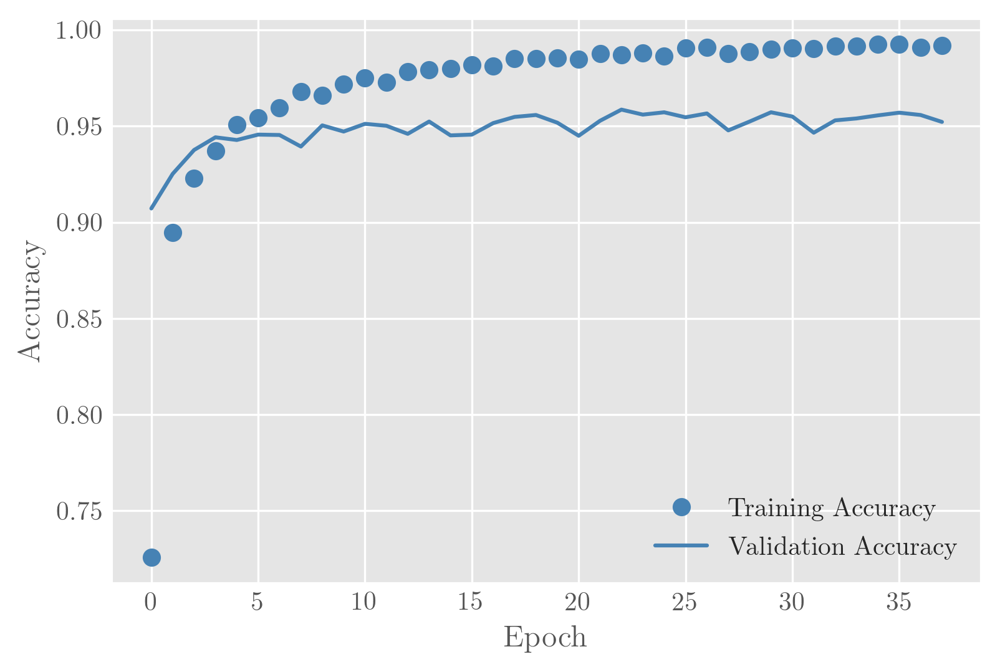

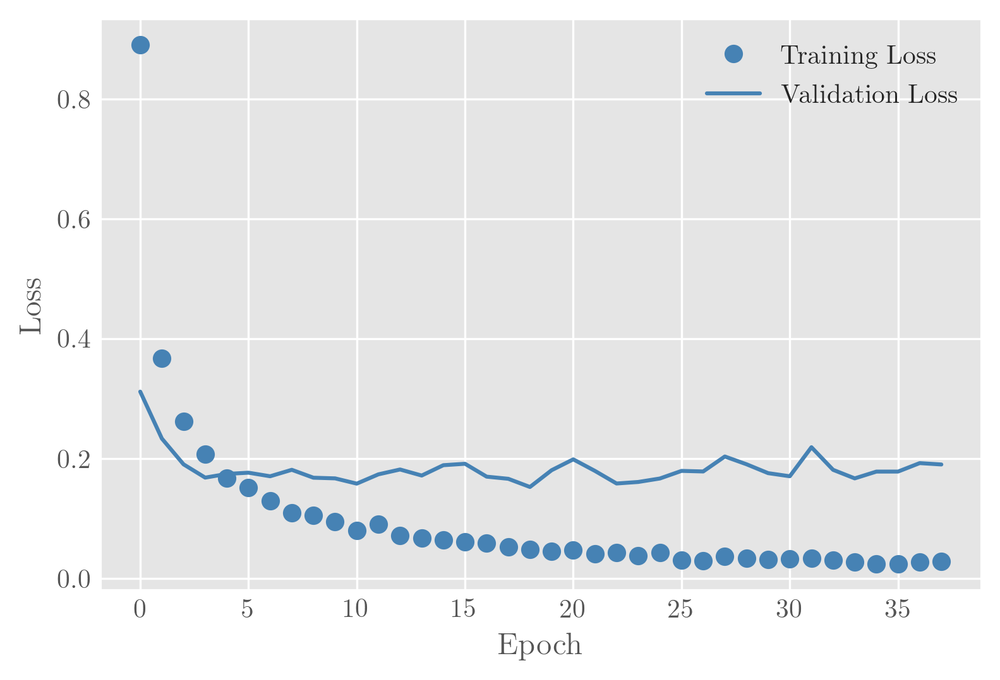

In [ ]:
# Alternative Visualization
accuracy = history_new['accuracy']
val_accuracy = history_new['val_accuracy']
loss = history_new['loss']
val_loss = history_new['val_loss']
epochs = range(len(accuracy))
plt.plot(epochs, accuracy, 'bo', label='Training Accuracy', color="steelblue")
plt.plot(epochs, val_accuracy, 'b', label='Validation Accuracy', color="steelblue")
#plt.title('Training and Validation Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend()
plt.savefig('Validation_Accuracy_Tuned.pdf')  
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training Loss', color="steelblue")
plt.plot(epochs, val_loss, 'b', label='Validation Loss', color="steelblue")
#plt.title('Training and Validation Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend()
plt.savefig('Validation_Loss_Tuned.pdf')  
plt.show()

## Comparison with Benchmarks

To see how the model performs compared to a state-of-the-art model, we use the Keras implementations for DenseNet201 (18,321,984 parameters) as well as  VGG16 (138,357,544 paramteres).

### DenseNet 201

**ADD DESCRIPTION HERE**

In [ ]:
# Import the Densenet model with the weights learned for the imagenet competition
## Note: We do not include the dense layers in the top of the model and adjust the input shape to the shape of our data
DenseNet_model = DenseNet201(include_top=False, input_shape=(71, 71, 3), weights="imagenet")
DenseNet_model.summary()

74850304/74836368 [==============================] - 0s 0us/step
Model: "densenet201"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 71, 71, 3)]  0                                            
__________________________________________________________________________________________________
zero_padding2d (ZeroPadding2D)  (None, 77, 77, 3)    0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, 36, 36, 64)   9408        zero_padding2d[0][0]             
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, 36, 36, 64)   256         conv1/conv[0][0]                 
_______________________

In [ ]:
### DenseNet201

# Import the DenseNet201 model with the weights learned for the imagenet competition
## Note: We do not include the dense layers in the top of the model and adjust the input shape to the shape of our data
DenseNet_model = DenseNet201(include_top=False, input_shape = (64,64,3), weights="imagenet") # (84,84,3) was also tried

# We take the full model and build our own trainable fully connected dense layers on top of it
## Note: we leave the last two blocks of the model fully trainable
x = DenseNet_model.output
# Flatten the features to transfrom the inputs into a 1D array
x = Flatten()(x)
x = BatchNormalization()(x)
# Add a sequence of dense layers
x = Dense(256, activation="relu", kernel_initializer="he_normal")(x)
x = Dropout(0.1)(x)
x = BatchNormalization()(x)
x = Dense(128, activation="relu", kernel_initializer="he_normal")(x)
x = Dropout(0.1)(x)
x = BatchNormalization()(x)
x = Dense(64, activation="relu", kernel_initializer="he_normal")(x)
x = Dropout(0.1)(x)
# Add an output layer with softmax activation for the 10 classes
output = Dense(10, activation="softmax")(x)
# Assign the model to the model variable
DenseNet_model = keras.Model(inputs=DenseNet_model.input, outputs=output)

# Freeze the first three blocks of layers from the ResNet model
for layer in DenseNet_model.layers[:-567]:
  layer.trainable=False

In [ ]:
# Compile the model
## Note:
### As usual in classification problems we use the categorical crossentropy as the loss function
### We use the Adam method as the optimizer with learning rate 0.0002
### We set the argument metrics to "accuracy", such that Keras computes and outputs the accuracy of the model on the validation set while it is trained
DenseNet_model.compile(loss="sparse_categorical_crossentropy",
              optimizer=keras.optimizers.Adam(learning_rate=0.00007),
              metrics=["accuracy"])

# To ensure that our model training histories are labelled nicely in tensorboard including a time indication of when the model has been fitted, 
## we define a variable to capture the exact logdirectory and assign this directory to the tensorboard callback afterwards.
logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_cb = TensorBoard(logdir, histogram_freq=1)

# To prevent overfitting, we introduce early stopping, such that the training is stopped as soon as no improovement has been monitored over 10 periods according to the validation accuracy
early_stopping_cb = EarlyStopping(monitor='val_accuracy', patience=15, restore_best_weights=True)
#early_stopping_cb = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

In [ ]:
# Train model with data Augmentation and the usual input parameters (64, 64, 3)
# Data augmentation
datagen = ImageDataGenerator(height_shift_range=0.1, horizontal_flip=True, zoom_range=0.1)
train_data_aug = datagen.flow(X_train, y_train, batch_size=40)

# Train the model on augmented data
history = DenseNet_model.fit(train_data_aug, steps_per_epoch=len(X_train)/40, epochs=80, verbose=1,
                    validation_data=(X_valid, y_valid), 
                    callbacks=[early_stopping_cb, tensorboard_cb])

Epoch 1/80
415/415 [==============================] - 105s 136ms/step - loss: 1.4069 - accuracy: 0.5550 - val_loss: 0.3117 - val_accuracy: 0.9072
Epoch 2/80
415/415 [==============================] - 36s 87ms/step - loss: 0.3985 - accuracy: 0.8889 - val_loss: 0.2333 - val_accuracy: 0.9252
Epoch 3/80
415/415 [==============================] - 36s 86ms/step - loss: 0.2700 - accuracy: 0.9206 - val_loss: 0.1903 - val_accuracy: 0.9376
Epoch 4/80
415/415 [==============================] - 36s 87ms/step - loss: 0.2187 - accuracy: 0.9351 - val_loss: 0.1681 - val_accuracy: 0.9442
Epoch 5/80
415/415 [==============================] - 36s 86ms/step - loss: 0.1563 - accuracy: 0.9531 - val_loss: 0.1743 - val_accuracy: 0.9428
Epoch 6/80
415/415 [==============================] - 35s 85ms/step - loss: 0.1492 - accuracy: 0.9551 - val_loss: 0.1764 - val_accuracy: 0.9456
Epoch 7/80
415/415 [==============================] - 35s 85ms/step - loss: 0.1271 - accuracy: 0.9603 - val_loss: 0.1704 - val_accurac

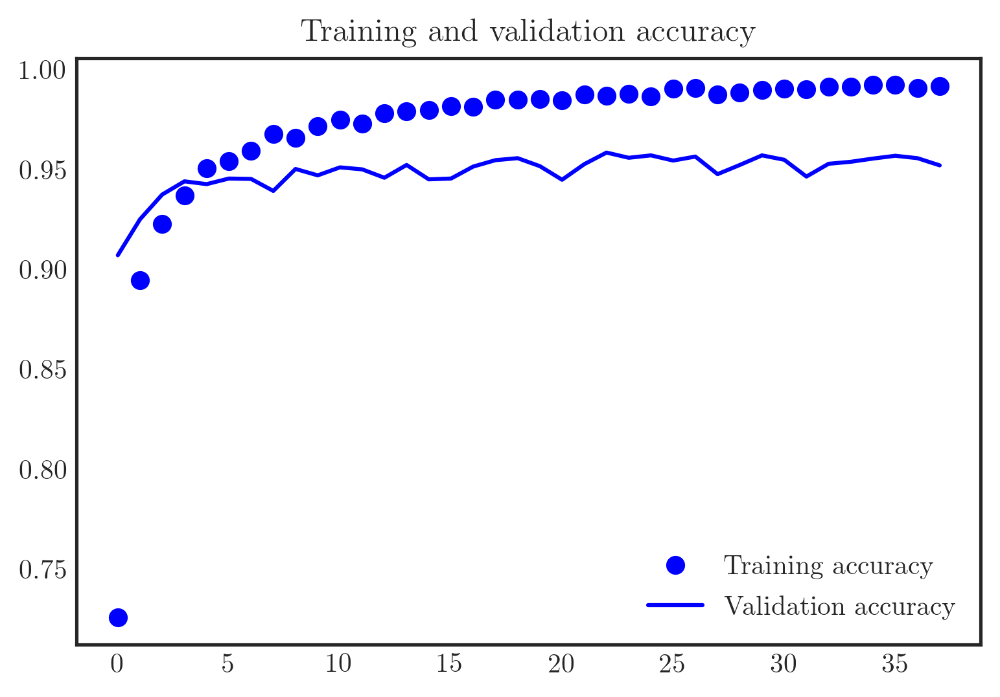

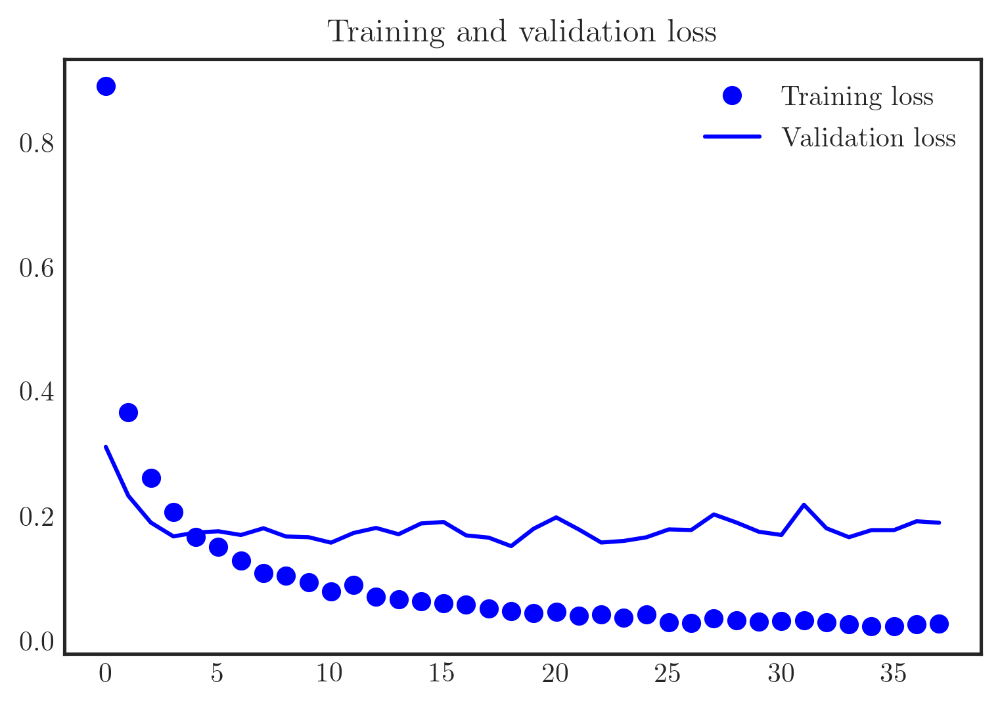

In [ ]:
# Alternative Visualization
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(len(accuracy))
plt.plot(epochs, accuracy, 'bo', label='Training accuracy')
plt.plot(epochs, val_accuracy, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()



dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


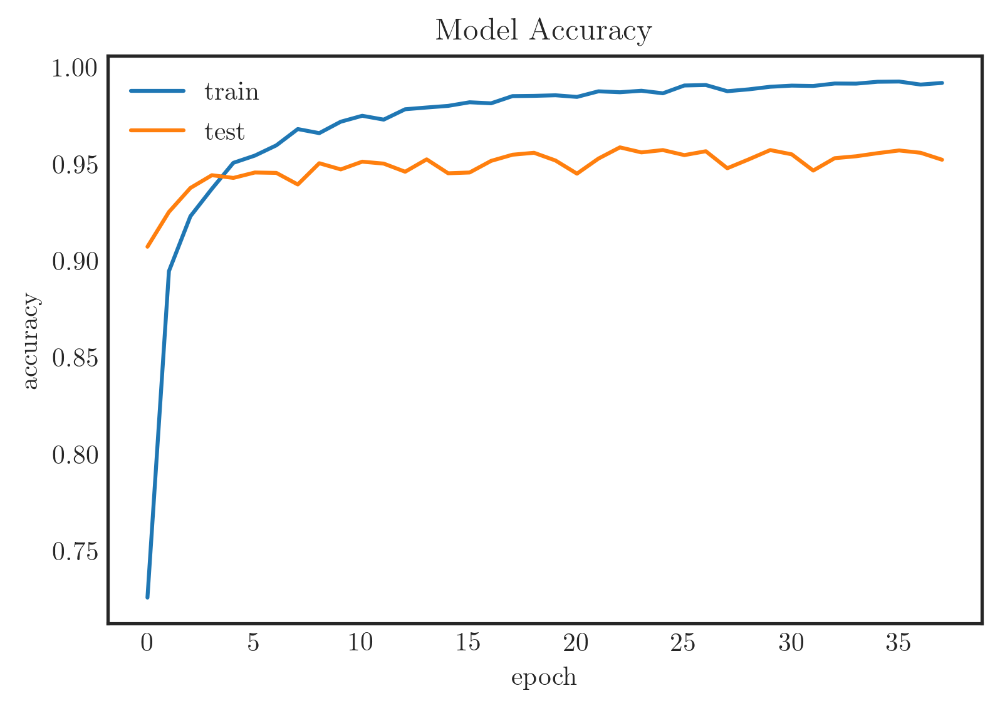

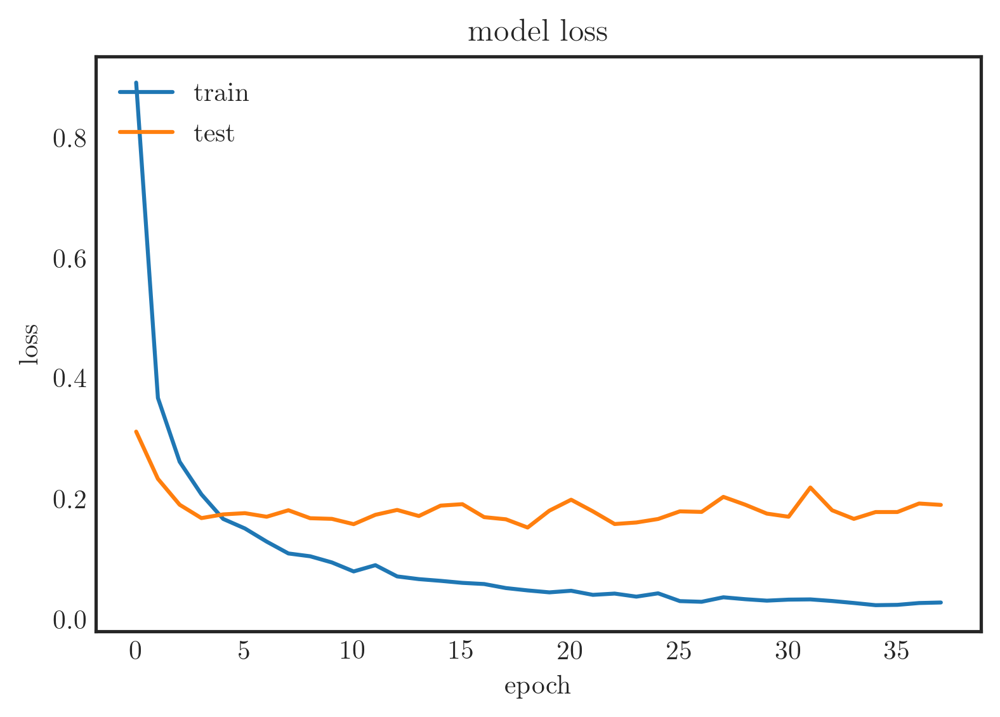

In [ ]:
print("\n")
print(history.history.keys())

# summarize history for accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [ ]:
# Look again at these two metrics
predictions_test_dense_normal_size = DenseNet_model.predict(X_test)
preds_test_dense_normal_size = np.argmax(predictions_test_dense_normal_size, axis = 1)

print(classification_report(y_test, preds_test_dense_normal_size))

print(DenseNet_model.evaluate(X_test, y_test))

              precision    recall  f1-score   support

           0       0.97      0.97      0.97       612
           1       0.97      0.99      0.98       597
           2       0.95      0.95      0.95       616
           3       0.93      0.95      0.94       528
           4       0.98      0.96      0.97       503
           5       0.94      0.98      0.96       368
           6       0.94      0.90      0.92       505
           7       0.96      1.00      0.98       598
           8       0.97      0.94      0.95       482
           9       1.00      0.97      0.98       591

    accuracy                           0.96      5400
   macro avg       0.96      0.96      0.96      5400
weighted avg       0.96      0.96      0.96      5400

169/169 [==============================] - 4s 23ms/step - loss: 0.1505 - accuracy: 0.9615
[0.1504983901977539, 0.9614814519882202]


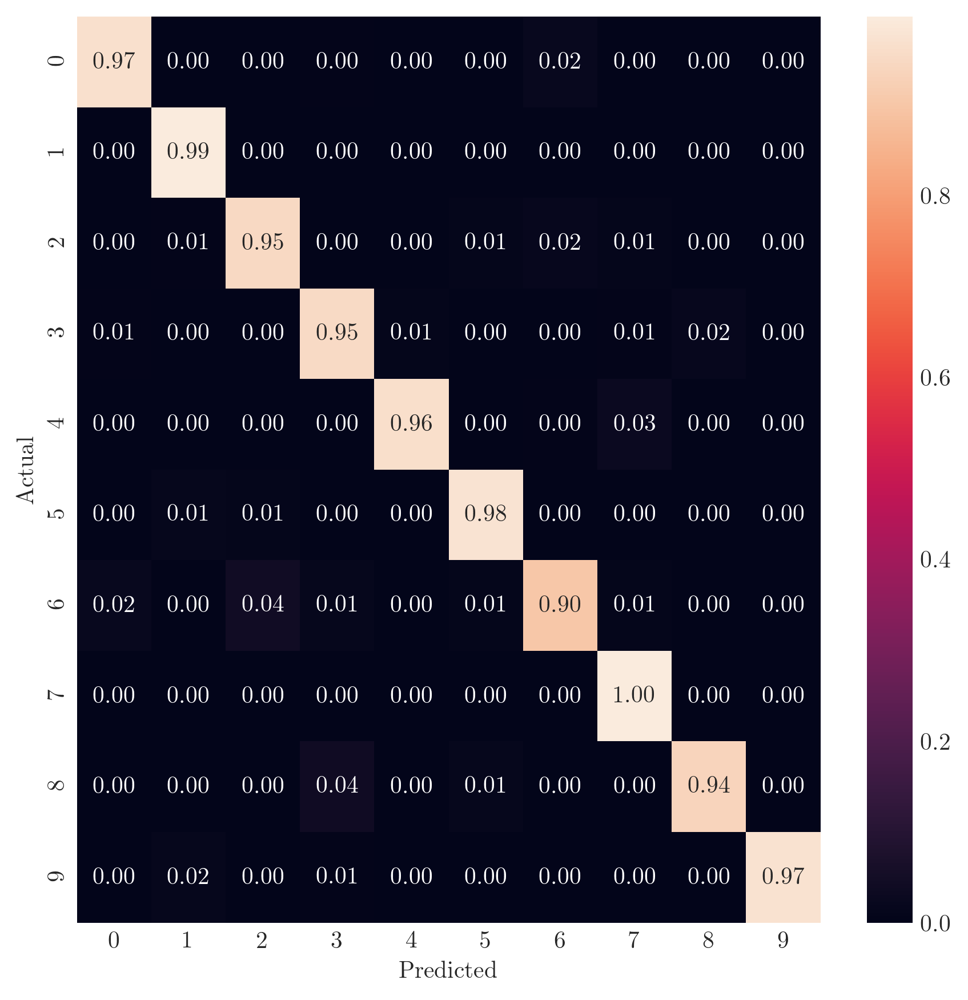

In [ ]:
# Compute confusion matrix
cm = confusion_matrix(y_test, preds_test_dense_normal_size)
labels=[0,1,2,3,4,5,6,7,8,9]

# Normalise
cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
fig, ax = plt.subplots(figsize=(7,7))
sns.heatmap(cmn, annot=True, fmt='.2f', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show(block=False)

As it is applicable, using a DenseNet architecture slightly improved the accuracy of already very accurate classes slightly. For instance, we see approximately one to two percentage point improvements for classes 1-5 and 7, while accuracy dropped somewhat for class 6 and 8. This can be explained by the model depth. Potentially, the DenseNet Model is able to more accurately depict differences in classes on a lower level than is our model, while it could be that the large parameter size tends to overfit some of the classes and thus includes an artificial mismatch. 

However, most prominently, we see that 

In [ ]:
# Save the model on the drive 
path = "/content/drive/MyDrive/EuroSat_Clean/"

DenseNet_model.save(path + "Model_DenseNet201")

# Save the params as pickle on the drive
with open(path +'train_history_DenseNet201', 'wb') as file_pi_Dense201_history:
        pickle.dump(history.history, file_pi_Dense201_history)   

### VGG 16

In [ ]:
# Import the Densenet model with the weights learned for the imagenet competition
## Note: We do not include the dense layers in the top of the model and adjust the input shape to the shape of our data
VGG16_model = VGG16(include_top=False, input_shape=(64,64, 3), weights="imagenet")
VGG16_model.summary()

58900480/58889256 [==============================] - 1s 0us/step
Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 64, 64, 3)]       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 64, 64, 64)        1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 64, 64, 64)        36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 32, 32, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 32, 32, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 32, 32, 128)       147584    
______________________________________________________________

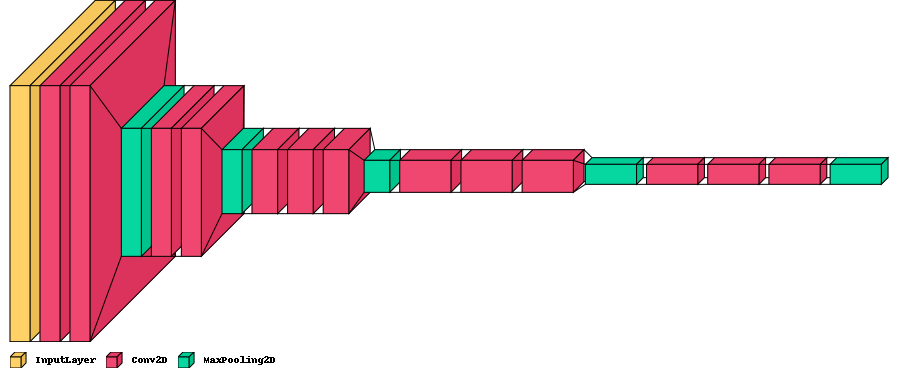

In [ ]:
visualkeras.layered_view(VGG16_model).show() # display using your system viewer
visualkeras.layered_view(VGG16_model, to_file='output.png') # write to disk
visualkeras.layered_view(VGG16_model, to_file='output.png').show() # write and show
visualkeras.layered_view(VGG16_model, legend=True)

In [ ]:
VGG16_model.layers[-11].output

<KerasTensor: shape=(None, 16, 16, 256) dtype=float32 (created by layer 'block3_conv2')>

In [ ]:
# VGG 16
## Note: We do not include the dense layers in the top of the model and adjust the input shape to the shape of our data
VGG16_model = VGG16(include_top=False, input_shape = (64,64,3), weights="imagenet") # (84,84,3) was also tried

# We take the full model and build our own trainable fully connected dense layers on top of it
## Note: we leave the last two blocks of the model fully trainable
x = VGG16_model.output

# Flatten the features to transfrom the inputs into a 1D array
x = Flatten(name="flatten")(x)
x = BatchNormalization()(x)
# Add a sequence of dense layers
x = Dense(256, activation="relu", kernel_initializer="he_normal")(x)
x = Dropout(0.1)(x)
x = BatchNormalization()(x)
x = Dense(128, activation="relu", kernel_initializer="he_normal")(x)
x = Dropout(0.1)(x)
x = BatchNormalization()(x)
x = Dense(64, activation="relu", kernel_initializer="he_normal")(x)
x = Dropout(0.1)(x)
# Add an output layer with softmax activation for the 10 classes
output = Dense(10, activation="softmax")(x)
# Assign the model to the model variable
VGG16_model = keras.Model(inputs=VGG16_model.input, outputs=output)

# Freeze the first three blocks of layers from the ResNet model
for layer in VGG16_model.layers[:-11]:
  layer.trainable=False

In [ ]:
# Compile the model
## Note:
### As usual in classification problems we use the categorical crossentropy as the loss function
### We use the Adam method as the optimizer with learning rate 0.0002
### We set the argument metrics to "accuracy", such that Keras computes and outputs the accuracy of the model on the validation set while it is trained
VGG16_model.compile(loss="sparse_categorical_crossentropy",
              optimizer=keras.optimizers.Adam(learning_rate=0.00007),
              metrics=["accuracy"])

# To ensure that our model training histories are labelled nicely in tensorboard including a time indication of when the model has been fitted, 
## we define a variable to capture the exact logdirectory and assign this directory to the tensorboard callback afterwards.
logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_cb = TensorBoard(logdir, histogram_freq=1)

# To prevent overfitting, we introduce early stopping, such that the training is stopped as soon as no improovement has been monitored over 10 periods according to the validation accuracy
early_stopping_cb = EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True)
#early_stopping_cb = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

In [ ]:
# Train model with data Augmentation and the augmented image sizes (64, 64, 3)

# Data augmentation
datagen = ImageDataGenerator(height_shift_range=0.1, horizontal_flip=True, zoom_range=0.1)
train_data_aug = datagen.flow(X_train, y_train, batch_size=40)

# Train the model on augmented data
history = VGG16_model.fit(train_data_aug, steps_per_epoch=len(X_train)/40, epochs=80, verbose=1,
                    validation_data=(X_valid, y_valid), 
                    callbacks=[early_stopping_cb, tensorboard_cb])

Epoch 1/80
415/415 [==============================] - 25s 53ms/step - loss: 1.9137 - accuracy: 0.3731 - val_loss: 0.9311 - val_accuracy: 0.6908
Epoch 2/80
415/415 [==============================] - 20s 48ms/step - loss: 0.9468 - accuracy: 0.6831 - val_loss: 0.6663 - val_accuracy: 0.7862
Epoch 3/80
415/415 [==============================] - 20s 48ms/step - loss: 0.8025 - accuracy: 0.7337 - val_loss: 0.5914 - val_accuracy: 0.8064
Epoch 4/80
415/415 [==============================] - 20s 49ms/step - loss: 0.7050 - accuracy: 0.7652 - val_loss: 0.5473 - val_accuracy: 0.8132
Epoch 5/80
415/415 [==============================] - 20s 48ms/step - loss: 0.6315 - accuracy: 0.7869 - val_loss: 0.5095 - val_accuracy: 0.8288
Epoch 6/80
415/415 [==============================] - 20s 48ms/step - loss: 0.5974 - accuracy: 0.8011 - val_loss: 0.4845 - val_accuracy: 0.8372
Epoch 7/80
415/415 [==============================] - 20s 48ms/step - loss: 0.5560 - accuracy: 0.8130 - val_loss: 0.4591 - val_accuracy:

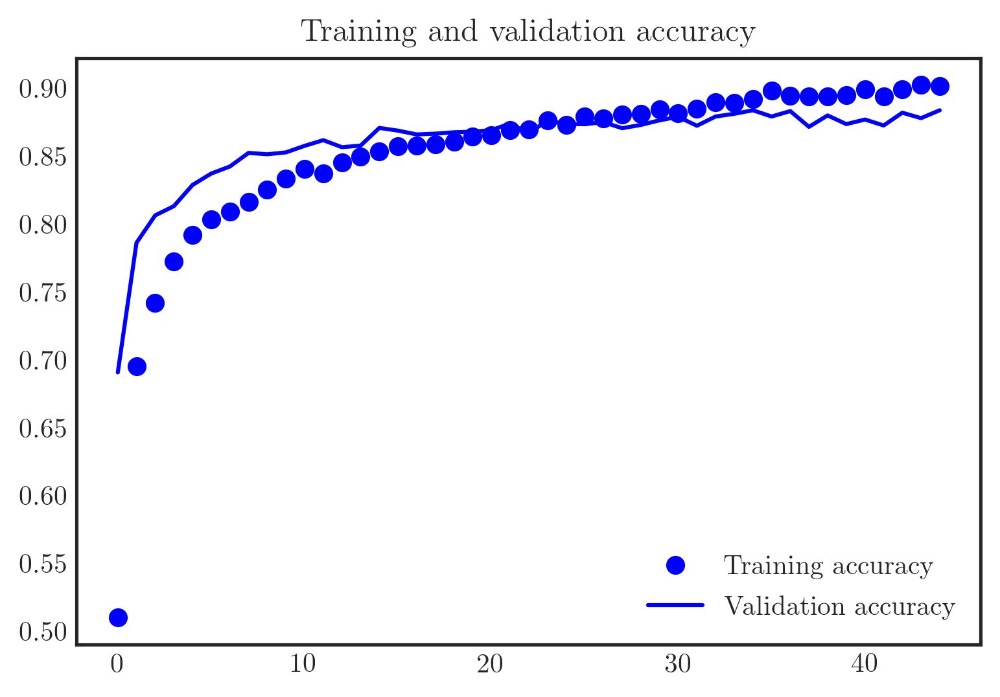

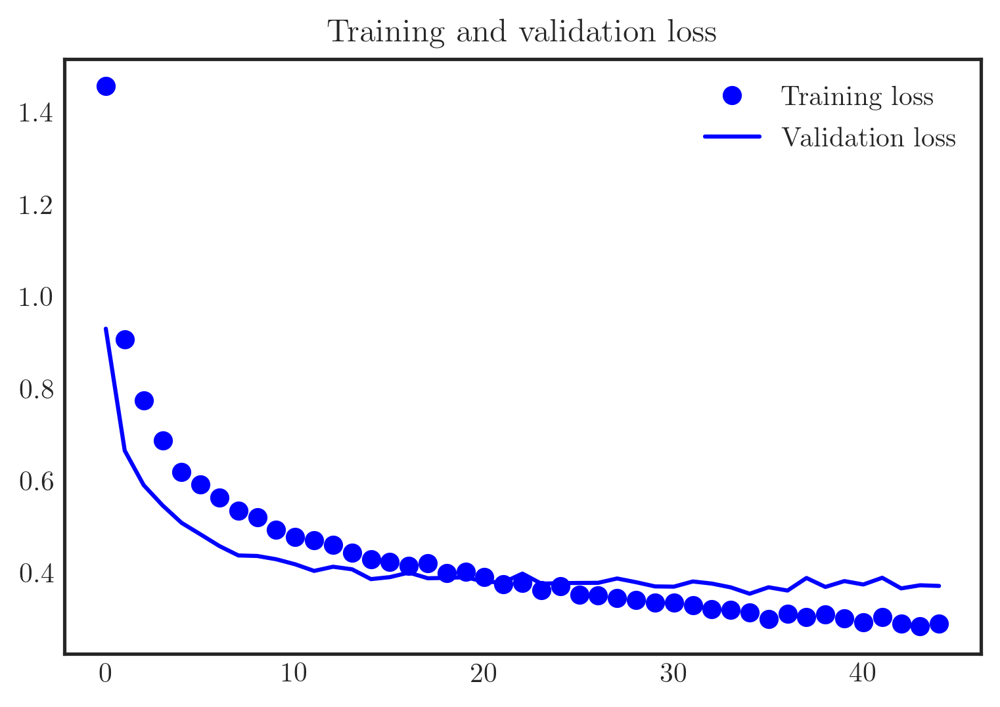

In [ ]:
# Alternative Visualization
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(len(accuracy))
plt.plot(epochs, accuracy, 'bo', label='Training accuracy')
plt.plot(epochs, val_accuracy, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

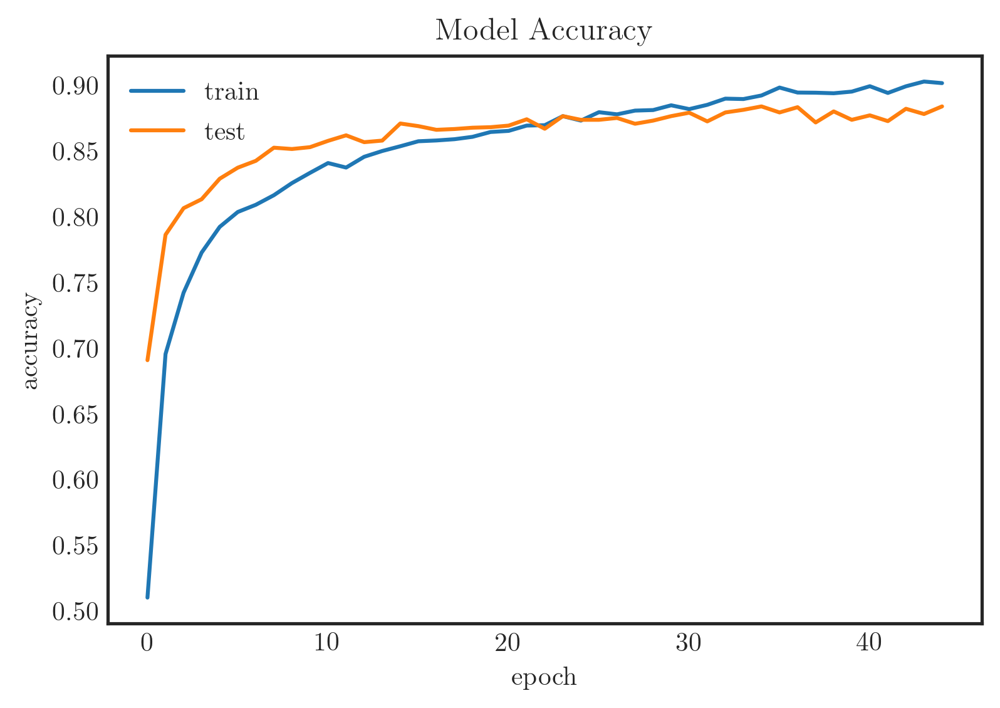

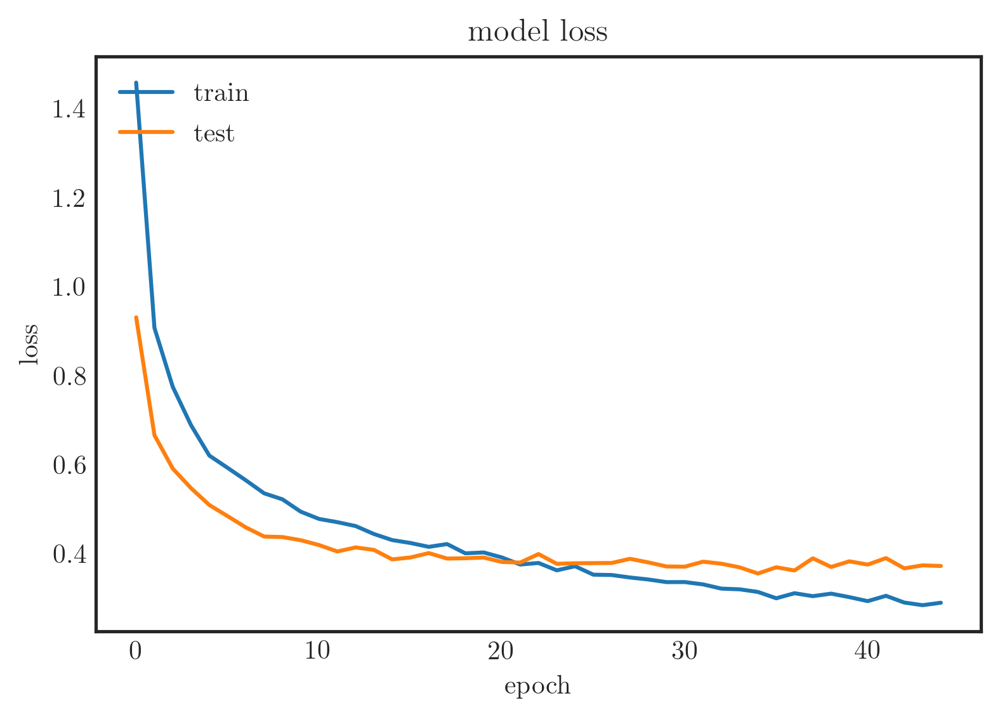

In [ ]:
# summarize history for accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [ ]:
# Look again at these two metrics
predictions_test_vgg = VGG16_model.predict(X_test)
preds_test_vgg = np.argmax(predictions_test_vgg, axis = 1)

print(classification_report(y_test, preds_test_vgg))

print(VGG16_model.evaluate(X_test, y_test))

              precision    recall  f1-score   support

           0       0.91      0.88      0.89       612
           1       0.93      0.96      0.95       597
           2       0.89      0.85      0.87       616
           3       0.77      0.80      0.78       528
           4       0.92      0.93      0.93       503
           5       0.87      0.86      0.86       368
           6       0.85      0.77      0.80       505
           7       0.90      0.97      0.93       598
           8       0.80      0.83      0.81       482
           9       0.99      0.96      0.97       591

    accuracy                           0.89      5400
   macro avg       0.88      0.88      0.88      5400
weighted avg       0.89      0.89      0.89      5400

169/169 [==============================] - 1s 6ms/step - loss: 0.3552 - accuracy: 0.8854
[0.35518383979797363, 0.8853703737258911]


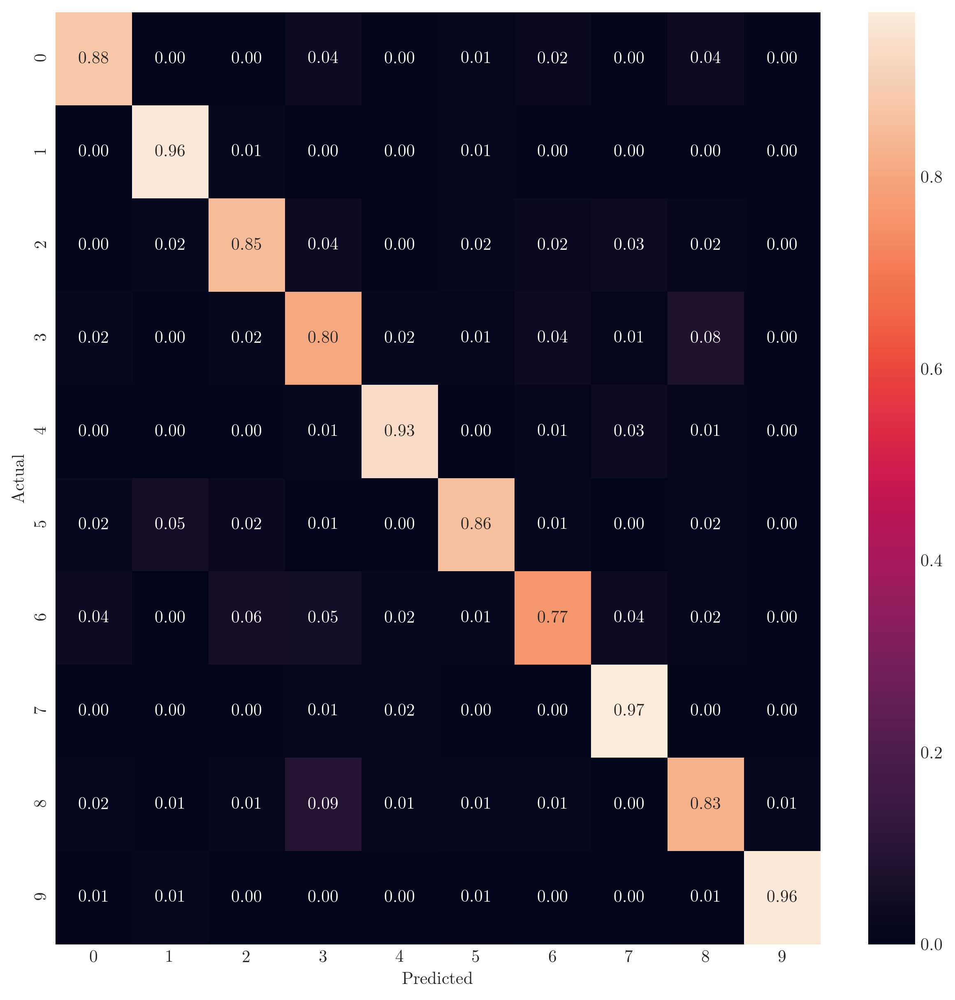

In [ ]:
# Compute confusion matrix
cm = confusion_matrix(y_test, preds_test_vgg)
labels=[0,1,2,3,4,5,6,7,8,9]

# Normalise
cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(cmn, annot=True, fmt='.2f', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show(block=False)

As we can see, using a VGGNet model declines performance on virtually every class observed, compared to the DenseNet or the Tuned model. 

In [ ]:
# Save the model on the drive 
path = "/content/drive/MyDrive/EuroSat_Clean/"

VGG16_model.save(path + "Model_VGG16")

# Save the params as pickle on the drive
with open(path +'train_history_VGGNet16', 'wb') as file_pi_VGG_history:
        pickle.dump(history.history, file_pi_VGG_history)   

INFO:tensorflow:Assets written to: /content/drive/MyDrive/EuroSat_Clean/Model_VGG16/assets


## Label Balancing Approach


As corectly pointed out by Helber et al. (2019), we need to account for imbalances in the dataset for our classification purposes. That is, we need to check whether we have an identical number of observations for each class. 

Imbalanced classification is defined by a dataset with a skewed class distribution. As we have seen, in both the hyperparameter tuned model and the state-of-the-art transfer learning model, we obtained 2,3 and 6 to have a somewhat inferior prediction accuracy than their class counterparts. Since two of the three classes indeed have a reduced data availability, we use a label balancing approach in which we artificially upscale the underrepresented images classes.  

This is often exemplified by a binary (two-class) classification task where most of the examples belong to class 0 with only a few examples in class 1. 

Because the class distribution is not balanced, most machine learning algorithms will perform poorly and require modification to avoid simply predicting the majority class in all cases. Additionally, metrics like classification lose their meaning, and alternate methods for evaluating predictions on imbalanced examples are required, like ROC or AUC.

An additional level of complexity comes from the problem domain from which the examples were drawn. This implies that we need to consider whether class imbalances were attributed to random or systemic exposures. 

Both these considerations are usually extrapolated in the case of large dataset sizes or noisier models. 

This is the reason for the poor performance with traditional machine learning models, as they assume a balanced class distribution.

To define imbalances, we should first print the distribution of each class label:

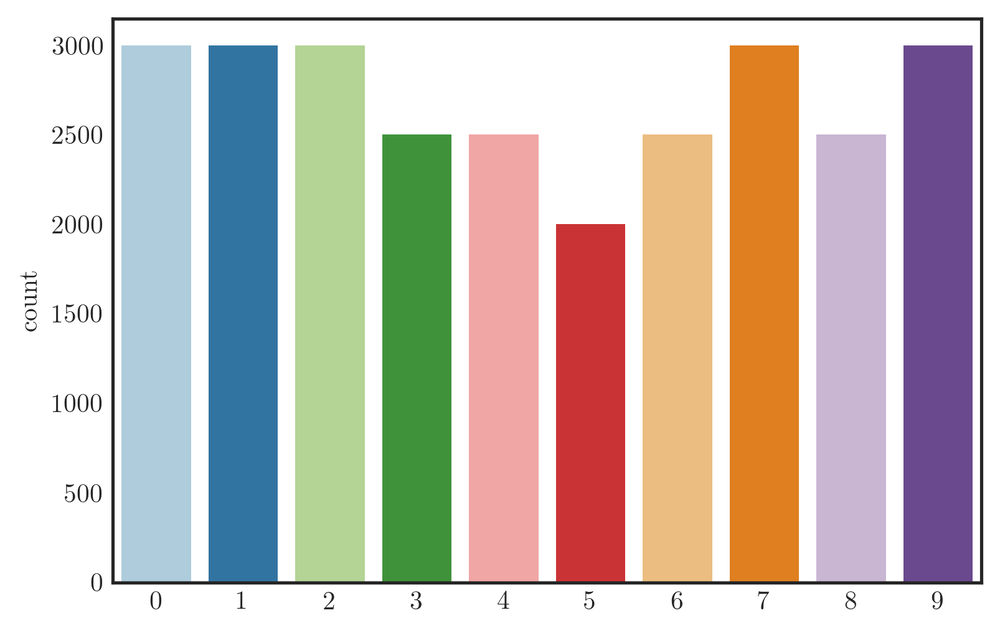

In [ ]:
# Here, we define the countplot
sns.countplot(yLabels, palette='Paired')

### Upsampling Minority Class

We decide to artificially increase the image sizes according to the ImageDataGenerator method. This then poses the additional issue that, when having already augmented images in the balanced sets, we again upscale some of these images during the training process. We did not find any related literature that points out issues on this matter, but decide to keep the image augmentation only for some factors while balancing the labels and then using different augmentation characteristics during the training process, such that an image is not accidentaly augmented on the same variable(s) twice. 

First, we need to define which labels were all underrepresented. That is the case for 5 labels: 3,4,5,6,8. Thus, we need only to perform augmentation on these image classes. Luckily, the dataset is still ordered. As such, we can simply obtain the numbers per class to get all images from the respective classes.

In [ ]:
# Check if dictionary is still correct
label_Dict

{0: b'AnnualCrop',
 1: b'Forest',
 2: b'HerbaceousVegetation',
 3: b'Highway',
 4: b'Industrial',
 5: b'Pasture',
 6: b'PermanentCrop',
 7: b'Residential',
 8: b'River',
 9: b'SeaLake'}

In [ ]:
# We see that we need classes for Highway, Industrial, Pasture, PermanentCrop and River. Furthermore, we need 1000 images from Pasture and 500 from the 
# other classes, respectively. 
tmp_class_3 = np.arange(14000,16500,1)
tmp_class_4 = np.arange(8500,11000,1)
tmp_class_5 = np.arange(16500,18500,1)
tmp_class_6 = np.arange(24500,27000,1)
tmp_class_8 = np.arange(0,2500,1)

# Now, we assign all labels and images to the respective classes
XImages_3 = XImages[tmp_class_3]
yLabels_3 = yLabels[tmp_class_3]

XImages_4 = XImages[tmp_class_4]
yLabels_4 = yLabels[tmp_class_4]

XImages_5 = XImages[tmp_class_5]
yLabels_5 = yLabels[tmp_class_5]

XImages_6 = XImages[tmp_class_6]
yLabels_6 = yLabels[tmp_class_6]

XImages_8 = XImages[tmp_class_8]
yLabels_8 = yLabels[tmp_class_8]

# We also create the class sizes for the other classes to be able to create a new array consisting of all 
tmp_class_1_9 = np.arange(18500,24500,1)
tmp_class_7 = np.arange(11000,14000,1)
tmp_class_0_2 = np.arange(2500,8500,1)

XImages_1_9 = XImages[tmp_class_1_9]
yLabels_1_9 = yLabels[tmp_class_1_9]

XImages_7 = XImages[tmp_class_7]
yLabels_7 = yLabels[tmp_class_7]

XImages_0_2 = XImages[tmp_class_0_2]
yLabels_0_2 = yLabels[tmp_class_0_2]


In [ ]:
# Now, we use the ImageDataGenerator to augment the images. Note that we decide not to use all of the resizing opportunities due to the considerations
# made above. Instead, we will use the rotation_range and width_shift_range, but will use height_shift_range, horizontal_flip as well as zoom_range 
# for training purposes

# Remember we need to reset the datagenerator flow such that we do not use the same technique for all the image classesm (better to have more randomness)

datagen = ImageDataGenerator(rotation_range=25, width_shift_range=0.35)

train_data_aug_test = datagen.flow(XImages_3, yLabels_3, batch_size=500)
XImages_add_3, yLabels_add_3 = next(train_data_aug_test)

train_data_aug_test.reset()

datagen = ImageDataGenerator(rotation_range=25, width_shift_range=0.35)

train_data_aug_test = datagen.flow(XImages_4, yLabels_4, batch_size=500)
XImages_add_4, yLabels_add_4 = next(train_data_aug_test)

train_data_aug_test.reset()

datagen = ImageDataGenerator(rotation_range=25, width_shift_range=0.35)

train_data_aug_test = datagen.flow(XImages_5, yLabels_5, batch_size=1000)
XImages_add_5, yLabels_add_5 = next(train_data_aug_test)

train_data_aug_test.reset()

datagen = ImageDataGenerator(rotation_range=25, width_shift_range=0.35)

train_data_aug_test = datagen.flow(XImages_6, yLabels_6, batch_size=500)
XImages_add_6, yLabels_add_6 = next(train_data_aug_test)

train_data_aug_test.reset()

datagen = ImageDataGenerator(rotation_range=25, width_shift_range=0.35)

train_data_aug_test = datagen.flow(XImages_8, yLabels_8, batch_size=500)
XImages_add_8, yLabels_add_8 = next(train_data_aug_test)

train_data_aug_test.reset()


In [ ]:
# Now, we have the respective sizes as we want them and can concatenate all of them:
XImages_aug = np.concatenate((XImages_1_9, XImages_0_2, XImages_7, XImages_3, XImages_add_3, XImages_4, XImages_add_4, 
                              XImages_5, XImages_add_5, XImages_6, XImages_add_6, XImages_8, XImages_add_8), axis = 0)
print(XImages.shape)

(27000, 64, 64, 3)


(27000,)
AxesSubplot(0.125,0.125;0.775x0.755)


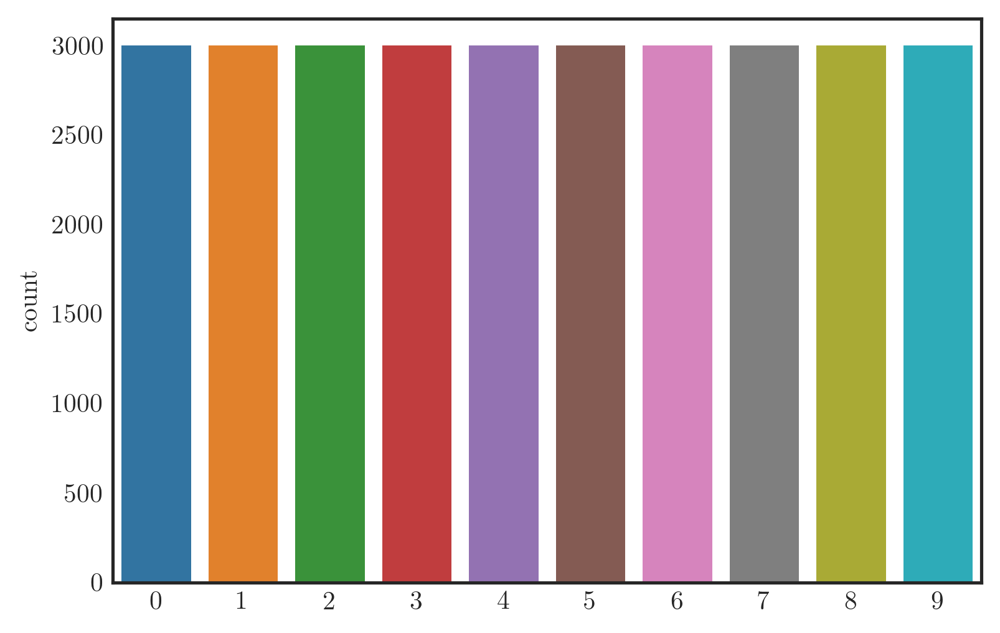

In [ ]:
# Do the same for the labels
yLabels_aug = np.concatenate((yLabels_1_9, yLabels_0_2, yLabels_7, yLabels_3, yLabels_add_3, yLabels_4, yLabels_add_4, 
                              yLabels_5, yLabels_add_5, yLabels_6, yLabels_add_6, yLabels_8, yLabels_add_8), axis = 0)

print(yLabels.shape)
print(sns.countplot(yLabels_aug))

In [ ]:
X_train_full, X_test, y_train_full, y_test = train_test_split(XImages_aug, yLabels_aug, test_size = 0.2, random_state = 42)

In [ ]:
# Now, we randomly assign training and validation status to the respective variables

shuffler = np.random.permutation(X_train_full.shape[0])
X_valid, X_train = X_train_full[shuffler[:5000]], X_train_full[shuffler[5000:]]
y_valid, y_train = y_train_full[shuffler[:5000]], y_train_full[shuffler[5000:]]

In [ ]:
X_train.shape

(19000, 64, 64, 3)

### Model Run On Upsampled Data

**ADD DESCRIPTION HERE**


#### Loading Custom CNN

In [ ]:
# Recreate the exact same model, including weights and optimizer, and all the required params
model_cnn_new_upload = keras.models.load_model('/content/drive/MyDrive/EuroSat_Clean/Model_CNN_tuned')

ValueError: ignored

#### Model Performance without Re-Trained Parameters

ADD DESCRIPTION HERE

In [ ]:
# Look again at these two metrics
predictions_test_own_wo_retrain = model_cnn_new_upload.predict(X_test)
preds_test_own_wo_retrain = np.argmax(predictions_test_own_wo_retrain, axis = 1)

print(classification_report(y_test, preds_test_own_wo_retrain))

print(model_cnn_new_upload.evaluate(X_test, y_test))

              precision    recall  f1-score   support

           0       0.95      0.97      0.96       609
           1       0.95      1.00      0.98       567
           2       0.94      0.97      0.95       635
           3       0.98      0.97      0.97       591
           4       0.98      0.99      0.98       576
           5       0.98      0.95      0.96       595
           6       0.98      0.92      0.95       618
           7       0.99      1.00      0.99       625
           8       0.98      0.97      0.98       572
           9       0.98      0.98      0.98       612

    accuracy                           0.97      6000
   macro avg       0.97      0.97      0.97      6000
weighted avg       0.97      0.97      0.97      6000

188/188 [==============================] - 2s 5ms/step - loss: 0.0976 - accuracy: 0.9705
[0.09762531518936157, 0.9704999923706055]


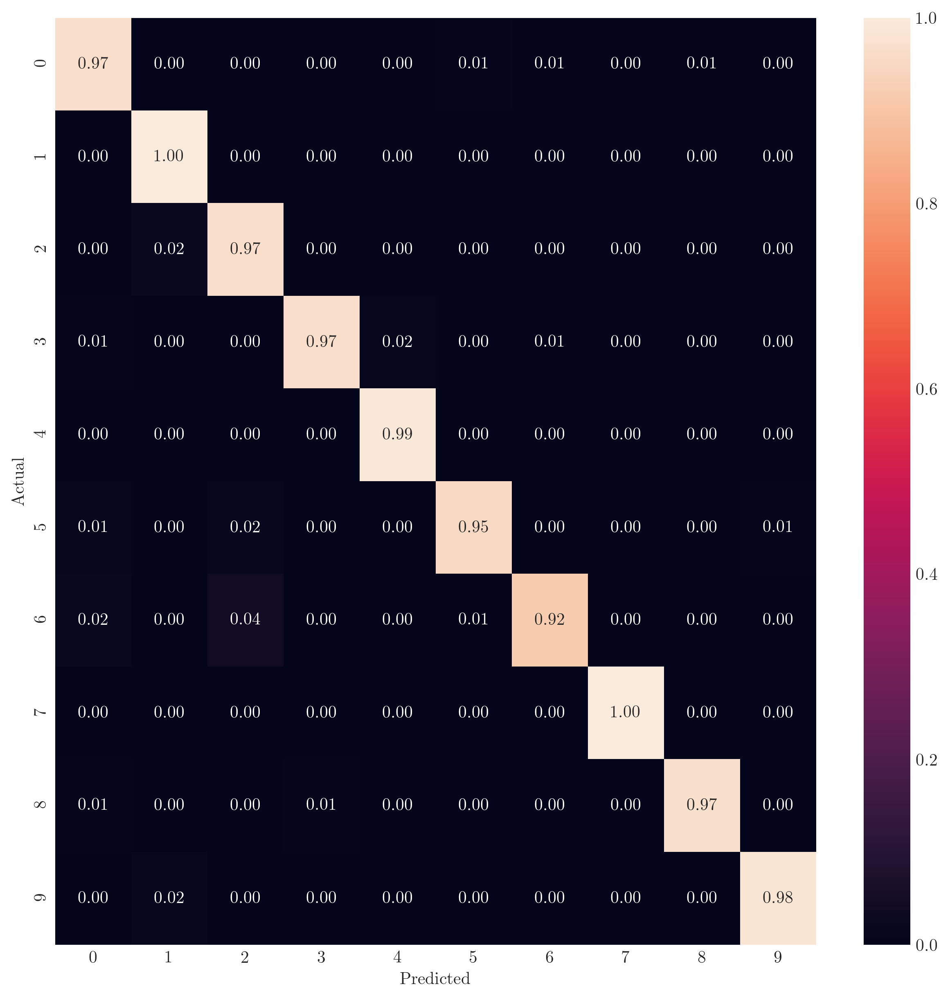

In [ ]:
cm = confusion_matrix(y_test, preds_test_own_wo_retrain)
labels=[0,1,2,3,4,5,6,7,8,9]

# Normalise
cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(cmn, annot=True, fmt='.2f', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show(block=False)

## Comparison with Benchmarks: Balanced Data

### DenseNet201


In [ ]:
# Recreate the exact same transfer model, including weights and optimizer, and all the required params
model_cnn_new_upload_transfer_201 = keras.models.load_model('/content/drive/MyDrive/EuroSat_Clean/Model_DenseNet201')

In [ ]:
# Look again at these two metrics
predictions_test_transfer_201 = model_cnn_new_upload_transfer_201.predict(X_test)
preds_test_transfer_201 = np.argmax(predictions_test_transfer_201, axis = 1)

print(classification_report(y_test, preds_test_transfer_201))

print(model_cnn_new_upload_transfer_201.evaluate(X_test, y_test))

              precision    recall  f1-score   support

           0       0.96      0.98      0.97       609
           1       0.98      0.99      0.99       567
           2       0.98      0.97      0.98       635
           3       0.97      0.96      0.96       591
           4       0.99      0.97      0.98       576
           5       0.98      0.98      0.98       595
           6       0.96      0.95      0.95       618
           7       0.97      1.00      0.99       625
           8       0.98      0.96      0.97       572
           9       1.00      0.99      0.99       612

    accuracy                           0.98      6000
   macro avg       0.98      0.98      0.98      6000
weighted avg       0.98      0.98      0.98      6000

188/188 [==============================] - 19s 22ms/step - loss: 0.0901 - accuracy: 0.9760
[0.0900643840432167, 0.9760000109672546]


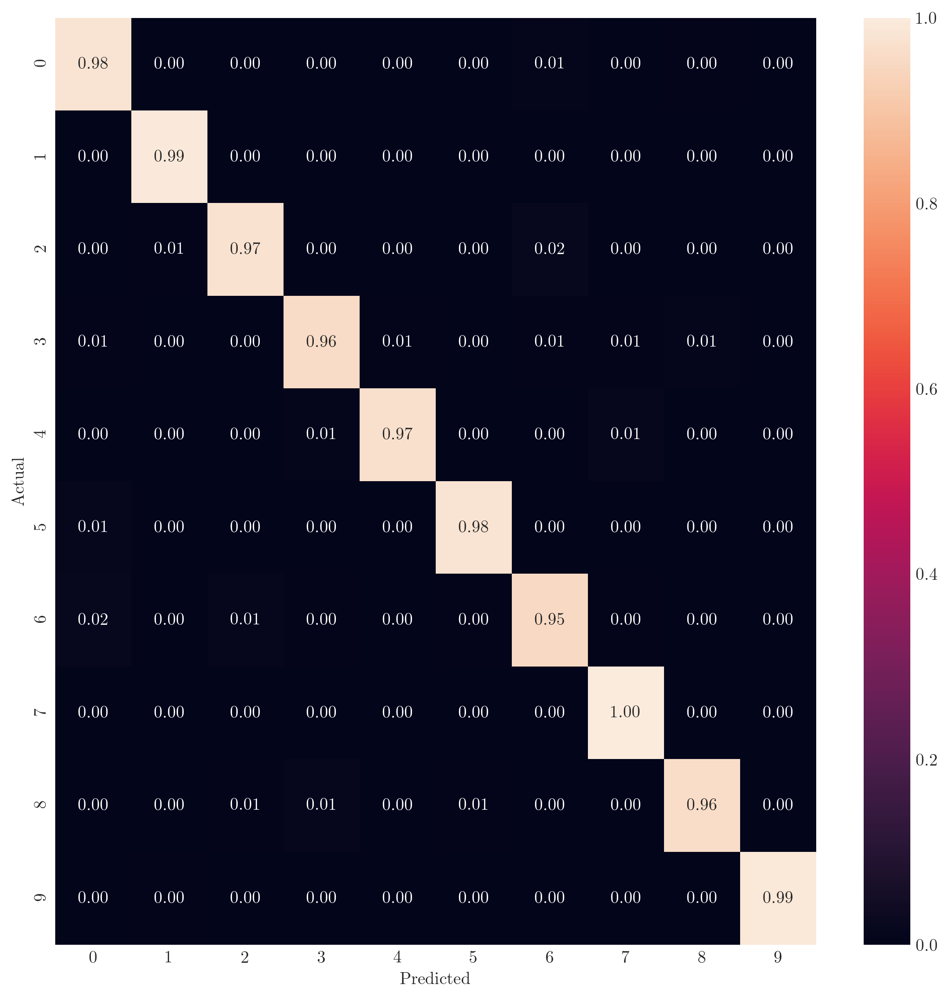

In [ ]:
# Compute confusion matrix
cm = confusion_matrix(y_test, preds_test_transfer_201)
labels=[0,1,2,3,4,5,6,7,8,9]

# Normalise
cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(cmn, annot=True, fmt='.2f', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show(block=False)

ADD PERFORMANCE ASSESSMENT HERE

### VGG 16

In [ ]:
# Recreate the exact same transfer model, including weights and optimizer, and all the required params
model_cnn_new_upload_transfer_vgg16 = keras.models.load_model('/content/drive/MyDrive/EuroSat_Clean/Model_VGG16')

In [ ]:
# Look again at these two metrics
predictions_test_transfer_vgg16 = model_cnn_new_upload_transfer_vgg16.predict(X_test)
preds_test_transfer_vgg16 = np.argmax(predictions_test_transfer_vgg16, axis = 1)

print(classification_report(y_test, preds_test_transfer_vgg16))

print(model_cnn_new_upload_transfer_vgg16.evaluate(X_test, y_test))

              precision    recall  f1-score   support

           0       0.91      0.93      0.92       609
           1       0.93      0.97      0.95       567
           2       0.91      0.91      0.91       635
           3       0.84      0.81      0.83       591
           4       0.95      0.92      0.93       576
           5       0.90      0.87      0.88       595
           6       0.90      0.85      0.87       618
           7       0.90      0.99      0.94       625
           8       0.86      0.85      0.86       572
           9       0.97      0.97      0.97       612

    accuracy                           0.91      6000
   macro avg       0.91      0.91      0.91      6000
weighted avg       0.91      0.91      0.91      6000

188/188 [==============================] - 2s 6ms/step - loss: 0.2912 - accuracy: 0.9065
[0.29124683141708374, 0.906499981880188]


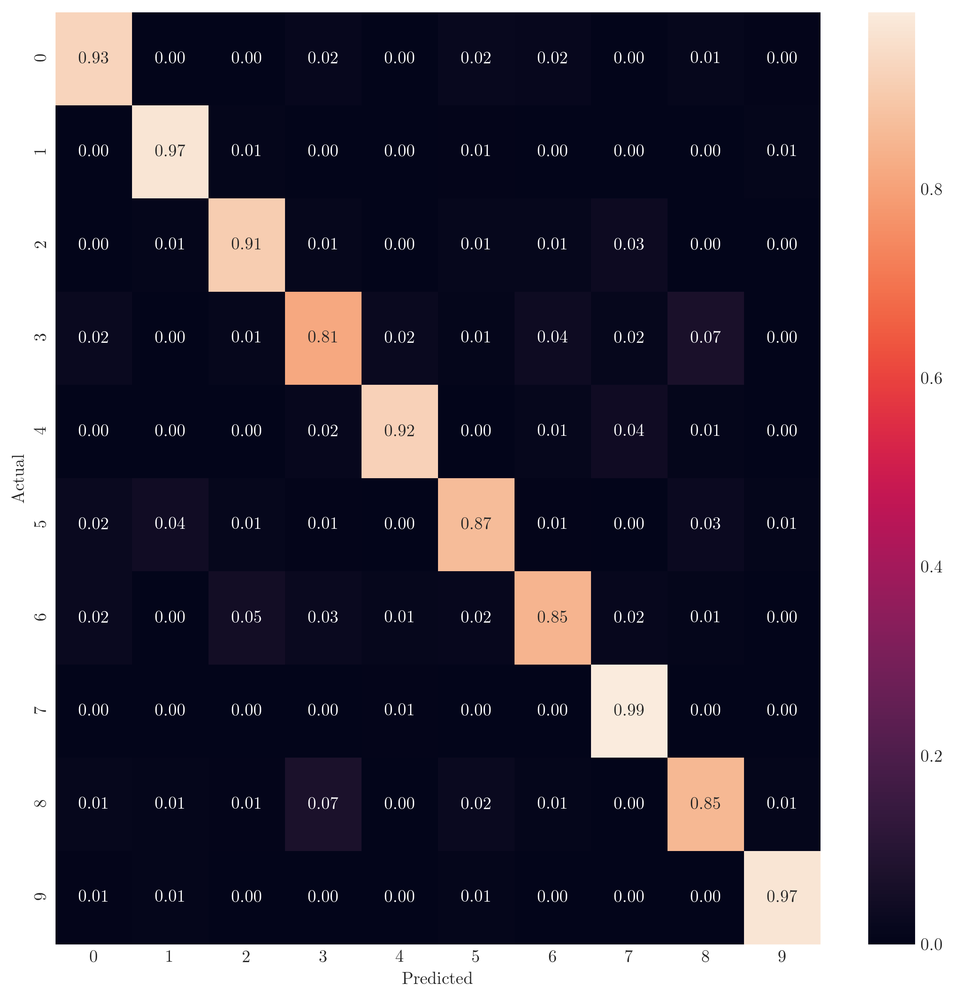

In [ ]:
cm = confusion_matrix(y_test, preds_test_transfer_vgg16)
labels=[0,1,2,3,4,5,6,7,8,9]

# Normalise
cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(cmn, annot=True, fmt='.2f', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show(block=False)

Regarding upsampling of our dataset, we observe that improvements for all different models are observeable. Note again that the upsampled classes were 3,4,5,6 and 8, so we will focus especially on these classes. 



## Exploring Different Bands

ADD DESCRIPTION AND PAPERS HERE: WHY DO WE USE NGR

### Load NGR Data

ADD DESCRIPTION

In [ ]:
# RGB file URL
url_bands = "http://madm.dfki.de/files/sentinel/EuroSATallBands.zip"
# download zip
request = requests.get(url_bands)
zips = zipfile.ZipFile(io.BytesIO(request.content))

In [ ]:
# Extract zip
zips.extractall()

In [ ]:
# Here, we will get the filenames for each image in a first step

image_filenames = []

for file in zips.namelist():
  image_filenames.append(file)

# Now, we store all image filenames that include a "jpg" formulation, to make sure that only jpg files are stored in the dataset.

image_filenames = [x for x in image_filenames if ".tif" in x]

# We will use these filenames to create a new np array that clipps the file strings accordingly and only gets the respective noun (e.g. River)
# We need this dtype in order to convert strings to characters and, as such, get the filnames

labs = np.empty(len(image_filenames), dtype = 'S20')

i = 0
for label in image_filenames:
  labs[i] = label.split('/')[6]
  i += 1

In [ ]:
image_names = []

for x in image_filenames:
  image_names.append("/content/"+x)

In [ ]:
# Normalize bands into 0.0 - 1.0 scale
def normalize(array):
    array_min, array_max = array.min(), array.max()
    return (array - array_min) / (array_max - array_min)

In [ ]:
XImages_MS = np.zeros([len(image_filenames), 64, 64, 3])

i = 0
bands = [8,4,3]
indices = [0,1,2]
for image in image_filenames:
  img = rasterio.open(image)
  for index in indices:
    XImages_MS[i, :, :, index]=normalize(img.read(bands[index]))
    
  i += 1

In [ ]:
XImages_MS.shape

(27000, 64, 64, 3)

In [ ]:
# Now, we just need to convert the names into numbers to obtain a numerical label for each image: 
label_names, yLabels = np.unique(labs, return_inverse=True)

# This command now assigned to each unique name the respective numbering and orders it alphabetically
label_Dict = dict(zip(np.unique(yLabels), label_names))

# Now, we just need to zip both files together in order to get the respective pair 
print(label_Dict)

{0: b'AnnualCrop', 1: b'Forest', 2: b'HerbaceousVegetation', 3: b'Highway', 4: b'Industrial', 5: b'Pasture', 6: b'PermanentCrop', 7: b'Residential', 8: b'River', 9: b'SeaLake'}


6
b'PermanentCrop'


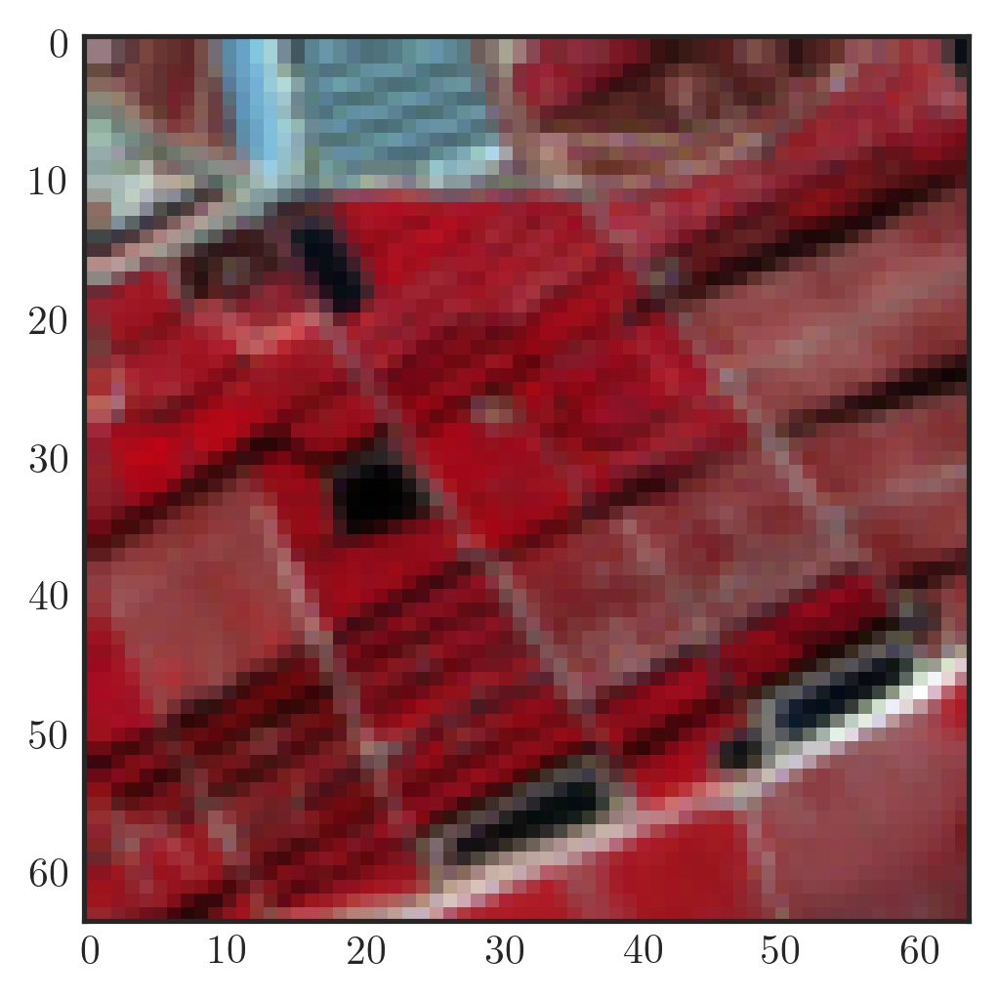

In [ ]:
# Check out the image
tmp = 499
nrg = np.dstack((XImages_MS[tmp, :, :, 0], XImages_MS[tmp, :, :, 1],XImages_MS[tmp, :, :, 2]))

print(yLabels[tmp])
print(label_names[yLabels[tmp]])
plt.imshow(nrg);
plt.savefig("example_ngr.png")

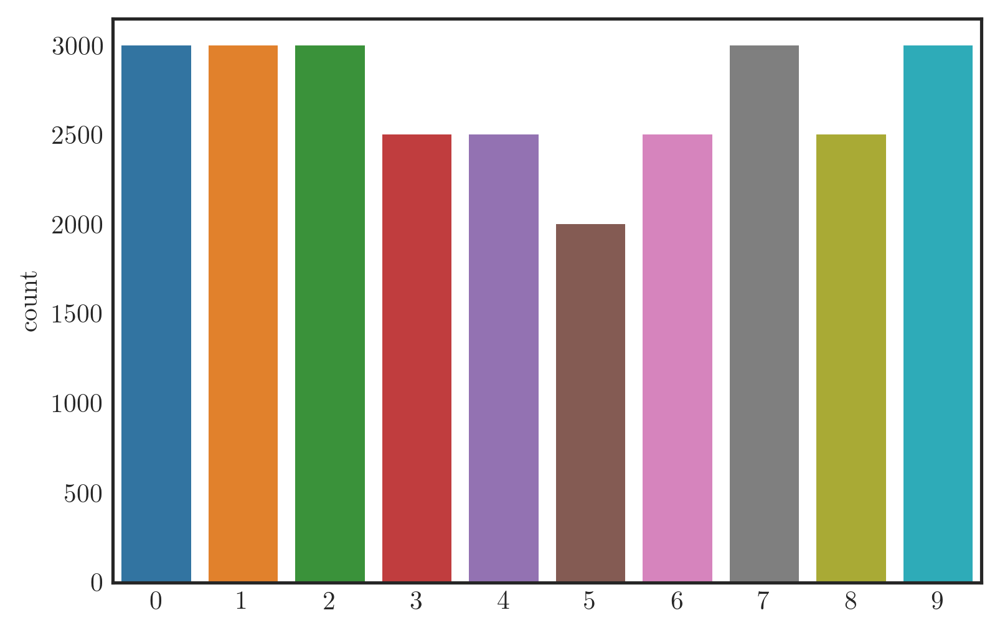

In [ ]:
# Here, we define the countplot
sns.countplot(yLabels)

In [ ]:
# We see that we need classes for Highway, Industrial, Pasture, PermanentCrop and River. Furthermore, we need 1000 images from Pasture and 500 from the 
# other classes, respectively. 
tmp_class_3 = np.arange(5000,7500,1)
tmp_class_4 = np.arange(2500,5000,1)
tmp_class_5 = np.arange(16500,18500,1)
tmp_class_8 = np.arange(24500,27000,1)
tmp_class_6 = np.arange(0,2500,1)

# Now, we assign all labels and images to the respective classes
XImages_3 = XImages_MS[tmp_class_3]
yLabels_3 = yLabels[tmp_class_3]

XImages_4 = XImages_MS[tmp_class_4]
yLabels_4 = yLabels[tmp_class_4]

XImages_5 = XImages_MS[tmp_class_5]
yLabels_5 = yLabels[tmp_class_5]

XImages_6 = XImages_MS[tmp_class_6]
yLabels_6 = yLabels[tmp_class_6]

XImages_8 = XImages_MS[tmp_class_8]
yLabels_8 = yLabels[tmp_class_8]

# We also create the class sizes for the other classes to be able to create a new array consisting of all 
tmp_class_0_1_2 = np.arange(7500,16500,1)
tmp_class_7_9 = np.arange(18500,24500,1)


XImages_0_1_2 = XImages_MS[tmp_class_0_1_2]
yLabels_0_1_2 = yLabels[tmp_class_0_1_2]

XImages_7_9 = XImages_MS[tmp_class_7_9]
yLabels_7_9 = yLabels[tmp_class_7_9]

In [ ]:
# Now, we use the ImageDataGenerator to augment the images. Note that we decide not to use all of the resizing opportunities due to the considerations
# made above. Instead, we will use the rotation_range and width_shift_range, but will use height_shift_range, horizontal_flip as well as zoom_range 
# for training purposes

# Remember we need to reset the datagenerator flow such that we do not use the same technique for all the image classesm (better to have more randomness)
datagen = ImageDataGenerator(rotation_range=25, width_shift_range=0.35)

train_data_aug_test = datagen.flow(XImages_3, yLabels_3, batch_size=500)
XImages_add_3, yLabels_add_3 = next(train_data_aug_test)

train_data_aug_test.reset()

datagen = ImageDataGenerator(rotation_range=25, width_shift_range=0.35)

train_data_aug_test = datagen.flow(XImages_4, yLabels_4, batch_size=500)
XImages_add_4, yLabels_add_4 = next(train_data_aug_test)

train_data_aug_test.reset()

datagen = ImageDataGenerator(rotation_range=25, width_shift_range=0.35)

train_data_aug_test = datagen.flow(XImages_5, yLabels_5, batch_size=1000)
XImages_add_5, yLabels_add_5 = next(train_data_aug_test)

train_data_aug_test.reset()

datagen = ImageDataGenerator(rotation_range=25, width_shift_range=0.35)

train_data_aug_test = datagen.flow(XImages_6, yLabels_6, batch_size=500)
XImages_add_6, yLabels_add_6 = next(train_data_aug_test)

train_data_aug_test.reset()

datagen = ImageDataGenerator(rotation_range=25, width_shift_range=0.35)

train_data_aug_test = datagen.flow(XImages_8, yLabels_8, batch_size=500)
XImages_add_8, yLabels_add_8 = next(train_data_aug_test)

train_data_aug_test.reset()


In [ ]:
# Now, we have the respective sizes as we want them and can concatenate all of them:
XImages_aug_MS = np.concatenate((XImages_0_1_2, XImages_7_9, XImages_3, XImages_add_3, XImages_4, XImages_add_4, 
                              XImages_5, XImages_add_5, XImages_6, XImages_add_6, XImages_8, XImages_add_8), axis = 0)
print(XImages_aug_MS.shape)

(30000, 64, 64, 3)


(27000,)
AxesSubplot(0.125,0.125;0.775x0.755)


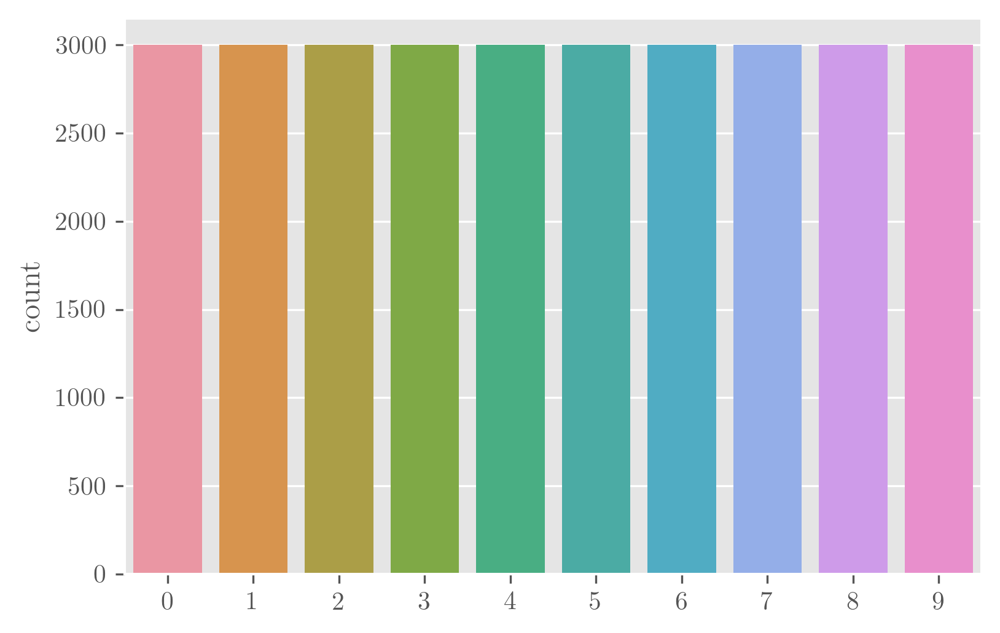

In [ ]:
# Do the same for the labels
yLabels_aug = np.concatenate((yLabels_0_1_2, yLabels_7_9, yLabels_3, yLabels_add_3, yLabels_4, yLabels_add_4, 
                              yLabels_5, yLabels_add_5, yLabels_6, yLabels_add_6, yLabels_8, yLabels_add_8), axis = 0)

print(yLabels.shape)
print(sns.countplot(yLabels_aug))

In [ ]:
X_train_full, X_test, y_train_full, y_test = train_test_split(XImages_aug_MS, yLabels_aug, test_size = 0.2, random_state = 42)

In [ ]:
# Now, we randomly assign training and validation status to the respective variables

shuffler = np.random.permutation(X_train_full.shape[0])
X_valid, X_train = X_train_full[shuffler[:5000]], X_train_full[shuffler[5000:]]
y_valid, y_train = y_train_full[shuffler[:5000]], y_train_full[shuffler[5000:]]

In [ ]:
X_valid.shape

(5000, 64, 64, 3)

### Custom CNN with NGR

#### Custom CNN with NGR: Tuned

In [ ]:
# Let us now create a first CNN to tackle the Satellite Image Dataset.

# Data augmentation
datagen = ImageDataGenerator(height_shift_range=0.25, horizontal_flip=True, zoom_range=0.1)
train_data_aug = datagen.flow(X_train, y_train, batch_size=40)

# Note that we already defined the batchsize here, but we need to change it accordingly in the subsequent training sessions

# We use the initial structure from Stanford Convolutional Neural Networks (CNNs / ConvNets) for Visual Recognition learning source 

def conv_model_tuned_ngr(nh_neurons = 32, fil = 64, k_size = 3, p_size = 2, stri = 2, pad = "same", activ = "relu",  lr = 0.01, batch_norm = False, drop = 0.2, deeper = False):

  if activ == "selu":
    k_init = "lecun_normal"
  else:
    k_init = "he_normal"
  
  model_cnn = keras.models.Sequential()
  model_cnn.add(keras.layers.Conv2D(filters=fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad, input_shape = [64,64,3]))
  
  if batch_norm == True & deeper == True: 
  
    model_cnn.add(keras.layers.Conv2D(filters=fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(BatchNormalization())
    model_cnn.add(keras.layers.MaxPooling2D(pool_size = p_size, strides = stri))
    model_cnn.add(Dropout(drop))
    model_cnn.add(keras.layers.Conv2D(filters=2*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(BatchNormalization())
    model_cnn.add(keras.layers.Conv2D(filters=2*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(BatchNormalization())
    model_cnn.add(keras.layers.MaxPooling2D(pool_size = p_size, strides = stri))
    model_cnn.add(Dropout(drop))
    model_cnn.add(keras.layers.Conv2D(filters=4*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(BatchNormalization())
    model_cnn.add(keras.layers.Conv2D(filters=4*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(BatchNormalization())
    model_cnn.add(keras.layers.Conv2D(filters=4*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(BatchNormalization())
    model_cnn.add(keras.layers.MaxPooling2D(pool_size = p_size, strides = stri))
    model_cnn.add(Dropout(drop))
    model_cnn.add(keras.layers.Conv2D(filters=8*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(BatchNormalization())
    model_cnn.add(keras.layers.Conv2D(filters=8*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(BatchNormalization())
    model_cnn.add(keras.layers.Conv2D(filters=8*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(BatchNormalization())
    model_cnn.add(keras.layers.MaxPooling2D(pool_size = p_size, strides = stri))
    model_cnn.add(Dropout(drop))
    model_cnn.add(keras.layers.Conv2D(filters=8*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(BatchNormalization())
    model_cnn.add(keras.layers.Conv2D(filters=8*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(BatchNormalization())
    model_cnn.add(keras.layers.Conv2D(filters=8*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(BatchNormalization())
    model_cnn.add(keras.layers.MaxPooling2D(pool_size = p_size, strides = stri))
    model_cnn.add(Dropout(drop))
    model_cnn.add(keras.layers.Flatten())
    model_cnn.add(keras.layers.Dense(nh_neurons*16, activation = activ, kernel_initializer = k_init))
    model_cnn.add(Dropout(drop))    
    model_cnn.add(BatchNormalization())
    model_cnn.add(keras.layers.Dense(nh_neurons*8, activation = activ, kernel_initializer = k_init))
    model_cnn.add(Dropout(drop))    
    model_cnn.add(BatchNormalization())
    model_cnn.add(keras.layers.Dense(nh_neurons*4, activation = activ, kernel_initializer = k_init))
    model_cnn.add(Dropout(drop))  
    model_cnn.add(keras.layers.Dense(10, activation = "softmax"))

  elif batch_norm == False & deeper == True:

    model_cnn.add(keras.layers.Conv2D(filters=fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(keras.layers.MaxPooling2D(pool_size = p_size, strides = stri))
    model_cnn.add(Dropout(drop))
    model_cnn.add(keras.layers.Conv2D(filters=2*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(keras.layers.Conv2D(filters=2*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(keras.layers.MaxPooling2D(pool_size = p_size, strides = stri))
    model_cnn.add(Dropout(drop))
    model_cnn.add(keras.layers.Conv2D(filters=4*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(keras.layers.Conv2D(filters=4*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(keras.layers.Conv2D(filters=4*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(keras.layers.MaxPooling2D(pool_size = p_size, strides = stri))
    model_cnn.add(Dropout(drop))
    model_cnn.add(keras.layers.Conv2D(filters=8*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(keras.layers.Conv2D(filters=8*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(keras.layers.Conv2D(filters=8*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(keras.layers.MaxPooling2D(pool_size = p_size, strides = stri))
    model_cnn.add(Dropout(drop))
    model_cnn.add(keras.layers.Conv2D(filters=8*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(keras.layers.Conv2D(filters=8*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(keras.layers.Conv2D(filters=8*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(keras.layers.MaxPooling2D(pool_size = p_size, strides = stri))
    model_cnn.add(Dropout(drop))
    model_cnn.add(keras.layers.Flatten())
    model_cnn.add(keras.layers.Dense(nh_neurons*16, activation = activ, kernel_initializer = k_init))
    model_cnn.add(Dropout(drop))    
    model_cnn.add(keras.layers.Dense(nh_neurons*8, activation = activ, kernel_initializer = k_init))
    model_cnn.add(Dropout(drop))    
    model_cnn.add(keras.layers.Dense(nh_neurons*4, activation = activ, kernel_initializer = k_init))
    model_cnn.add(Dropout(drop))  
    model_cnn.add(keras.layers.Dense(10, activation = "softmax"))

  elif batch_norm == True & deeper == False: 
  
    model_cnn.add(keras.layers.Conv2D(filters=fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(BatchNormalization())
    model_cnn.add(keras.layers.MaxPooling2D(pool_size = p_size, strides = stri))
    model_cnn.add(Dropout(drop))
    model_cnn.add(keras.layers.Conv2D(filters=2*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(BatchNormalization())
    model_cnn.add(keras.layers.MaxPooling2D(pool_size = p_size, strides = stri))
    model_cnn.add(Dropout(drop))
    model_cnn.add(keras.layers.Conv2D(filters=4*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(BatchNormalization())
    model_cnn.add(keras.layers.Conv2D(filters=4*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(BatchNormalization())
    model_cnn.add(keras.layers.MaxPooling2D(pool_size = p_size, strides = stri))
    model_cnn.add(Dropout(drop))
    model_cnn.add(keras.layers.Conv2D(filters=8*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(BatchNormalization())
    model_cnn.add(keras.layers.Conv2D(filters=8*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(BatchNormalization())
    model_cnn.add(keras.layers.MaxPooling2D(pool_size = p_size, strides = stri))
    model_cnn.add(Dropout(drop))
    model_cnn.add(keras.layers.Conv2D(filters=8*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(BatchNormalization())
    model_cnn.add(keras.layers.Conv2D(filters=8*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(BatchNormalization())
    model_cnn.add(keras.layers.MaxPooling2D(pool_size = p_size, strides = stri))
    model_cnn.add(Dropout(drop))
    model_cnn.add(keras.layers.Flatten())
    model_cnn.add(keras.layers.Dense(nh_neurons*16, activation = activ, kernel_initializer = k_init))
    model_cnn.add(Dropout(drop))    
    model_cnn.add(BatchNormalization())
    model_cnn.add(keras.layers.Dense(nh_neurons*8, activation = activ, kernel_initializer = k_init))
    model_cnn.add(Dropout(drop))    
    model_cnn.add(BatchNormalization())
    model_cnn.add(keras.layers.Dense(nh_neurons*4, activation = activ, kernel_initializer = k_init))
    model_cnn.add(Dropout(drop))  
    model_cnn.add(keras.layers.Dense(10, activation = "softmax"))

  else:

    model_cnn.add(keras.layers.Conv2D(filters=fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(keras.layers.MaxPooling2D(pool_size = p_size, strides = stri))
    model_cnn.add(Dropout(drop))
    model_cnn.add(keras.layers.Conv2D(filters=2*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad))  
    model_cnn.add(keras.layers.MaxPooling2D(pool_size = p_size, strides = stri))
    model_cnn.add(Dropout(drop))
    model_cnn.add(keras.layers.Conv2D(filters=4*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(keras.layers.Conv2D(filters=4*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(keras.layers.MaxPooling2D(pool_size = p_size, strides = stri))
    model_cnn.add(Dropout(drop))
    model_cnn.add(keras.layers.Conv2D(filters=8*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(keras.layers.Conv2D(filters=8*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(keras.layers.MaxPooling2D(pool_size = p_size, strides = stri))
    model_cnn.add(Dropout(drop))
    model_cnn.add(keras.layers.Conv2D(filters=8*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(keras.layers.Conv2D(filters=8*fil, kernel_size = k_size, activation = activ, kernel_initializer = k_init, padding = pad)) 
    model_cnn.add(keras.layers.MaxPooling2D(pool_size = p_size, strides = stri))
    model_cnn.add(Dropout(drop))
    model_cnn.add(keras.layers.Flatten())
    model_cnn.add(keras.layers.Dense(nh_neurons*16, activation = activ, kernel_initializer = k_init))
    model_cnn.add(Dropout(drop))    
    model_cnn.add(keras.layers.Dense(nh_neurons*8, activation = activ, kernel_initializer = k_init))
    model_cnn.add(Dropout(drop))    
    model_cnn.add(keras.layers.Dense(nh_neurons*4, activation = activ, kernel_initializer = k_init))
    model_cnn.add(Dropout(drop))  
    model_cnn.add(keras.layers.Dense(10, activation = "softmax"))

  # Compile the model
  ## Note:
  ### As usual in classification problems we use the categorical crossentropy as the loss function
  ### We use the Adam method as the optimizer with learning rate 0.01 for initialisation
  ### We set the argument metrics to "accuracy", such that Keras computes and outputs the accuracy of the model on the validation set while it is trained
  model_cnn.compile(loss="sparse_categorical_crossentropy",
                optimizer=keras.optimizers.Adam(learning_rate=lr),
                metrics=["accuracy"])
  
  return model_cnn

# To ensure that our model training histories are labelled nicely in tensorboard including a time indication of when the model has been fitted, 
## we define a variable to capture the exact logdirectory and assign this directory to the tensorboard callback afterwards.
logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_cb = TensorBoard(logdir, histogram_freq=1)
# tensorboard_cb = TensorBoard(logdir, histogram_freq=1)
# To prevent overfitting, we introduce early stopping, such that the training is stopped as soon as no improvement has been monitored over 10 periods according to the validation accuracy
early_stopping_cb = EarlyStopping(monitor='val_accuracy', patience=17, restore_best_weights=True) 
   


In [ ]:
# We further use the Cyclic LR defined below 

# Define the above described clr callback to achieve an optimal learning rate

step_size = int((5*len(X_train)/40)) #( Number of iterations * 5 / batch size )
clr = CyclicLR(base_lr=0.0001, max_lr=0.001, step_size=step_size, mode='triangular')

In [ ]:
# Create a function to perform grid search
def best_hyp_CNN(X_train, y_train, X_valid, y_valid, X_test, y_test, nh_neurons_range=[16,32], deeper_range = [False], activations=["relu"], 
                 lr_range=[0.0001], filters = [64], kernel_size = [3], pool_size = [2], strides = [2], padding = ["same"], 
                 batch_norm_range=[False], dropout_rate = [0.2]):
  # Create a variable to store the best score seen so far
  predicted_targets = np.array([])
  actual_targets = np.array([])
  best_score = 0
  # Set up a loop to go through all possible parameter combinations
  for nh_neurons in nh_neurons_range:
    for deeper in deeper_range:
      for activ in activations:
        for lr in lr_range:
          for fil in filters:
            for k_size in kernel_size:
              for p_size in pool_size:
                for stri in strides:
                  for pad in padding:
                    for batch_norm in batch_norm_range:
                      for drop in dropout_rate:
                        # Assign the model
                        model_cnn_ngr = conv_model_tuned_ngr(nh_neurons, fil, k_size, p_size, stri, pad, activ, lr, batch_norm, drop, deeper)
                        # Fit the model  
                        history = model_cnn_ngr.fit(train_data_aug, batch_size=40, steps_per_epoch=len(X_train)/40, epochs=50, verbose=1,
                                                validation_data=(X_valid, y_valid), 
                                                callbacks=[early_stopping_cb, clr, tensorboard_cb]) 
                        # Get predicted values
                        predictions = model_cnn_ngr.predict(X_valid)
                        # This is to store the predicted and actual target values for the confusion matrix in the end
                        predicted_targets = np.append(predicted_targets, predictions)
                        actual_targets = np.append(actual_targets, y_valid)
                        # Calculate losses
                        loss, accuracy = model_cnn_ngr.evaluate(X_valid, y_valid, verbose=0)
                        print("The parameter combination", [nh_neurons, deeper, activ, lr, fil, k_size, p_size, stri, pad, batch_norm, drop], "leads to a validation accuracy of", model_cnn_ngr.evaluate(X_valid, y_valid, verbose=0)[1])
                        if accuracy > best_score:
                          best_score = accuracy 
                          best_model = model_cnn_ngr
                          best_params = [nh_neurons, deeper, activ, lr, fil, k_size, p_size, stri, pad, batch_norm, drop]
                          print("The best test accuracy so far is:", best_score, "and it is given by the parameter combination:", best_model)

  return best_score, best_model, best_params, predicted_targets, actual_targets, history

In [ ]:
# Reload the overall model again to ensure consistency of the estimates 

score, model_cnn_ngr, params, predicted, actual, history = best_hyp_CNN(X_train, y_train, X_valid, y_valid, X_test, y_test, nh_neurons_range=[16], deeper_range = [False],
                                                           activations=["relu"], lr_range=[7e-05], filters = [64], kernel_size = [3], pool_size = [2], strides = [2], 
                                                           padding = ["same"], batch_norm_range=[False], dropout_rate = [0.1])

print("The best overall Accuracy score is:", score)
print("The Best model parameters are:", params)

Epoch 1/50
475/475 [==============================] - 54s 47ms/step - loss: 1.7217 - accuracy: 0.4372 - val_loss: 2.0729 - val_accuracy: 0.4368
Epoch 2/50
475/475 [==============================] - 21s 43ms/step - loss: 0.8939 - accuracy: 0.6986 - val_loss: 1.7466 - val_accuracy: 0.5466
Epoch 3/50
475/475 [==============================] - 21s 43ms/step - loss: 0.7586 - accuracy: 0.7408 - val_loss: 1.7839 - val_accuracy: 0.5868
Epoch 4/50
475/475 [==============================] - 20s 43ms/step - loss: 0.6448 - accuracy: 0.7862 - val_loss: 1.6167 - val_accuracy: 0.5898
Epoch 5/50
475/475 [==============================] - 21s 43ms/step - loss: 0.5679 - accuracy: 0.8150 - val_loss: 0.9448 - val_accuracy: 0.7192
Epoch 6/50
475/475 [==============================] - 20s 43ms/step - loss: 0.5053 - accuracy: 0.8403 - val_loss: 0.7180 - val_accuracy: 0.7548
Epoch 7/50
475/475 [==============================] - 21s 44ms/step - loss: 0.3606 - accuracy: 0.8848 - val_loss: 0.4382 - val_accuracy:

findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.


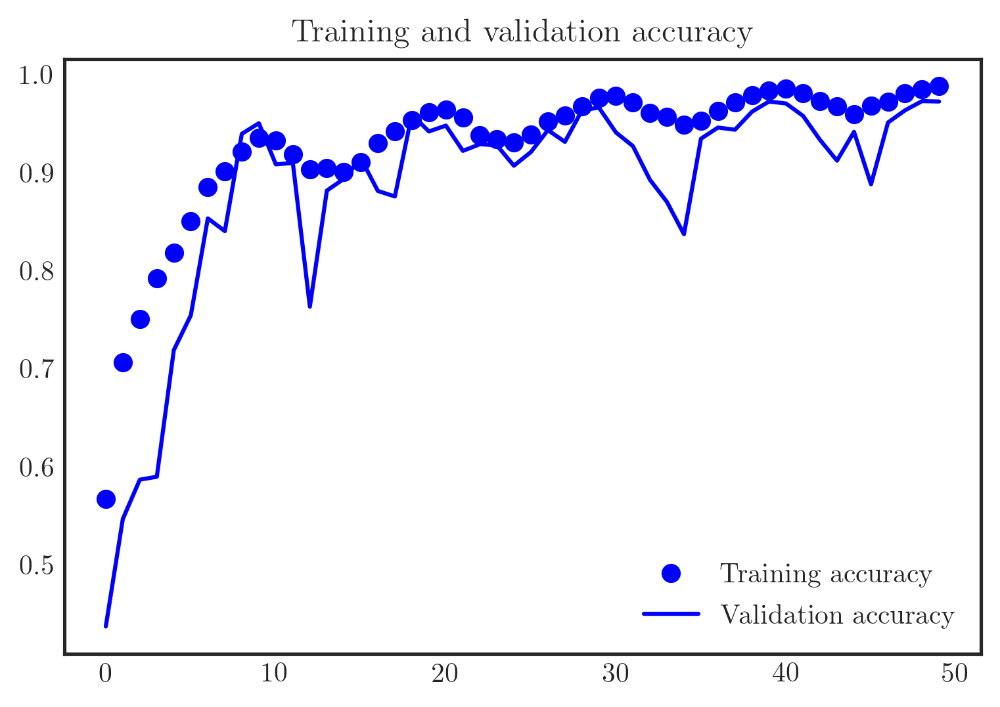

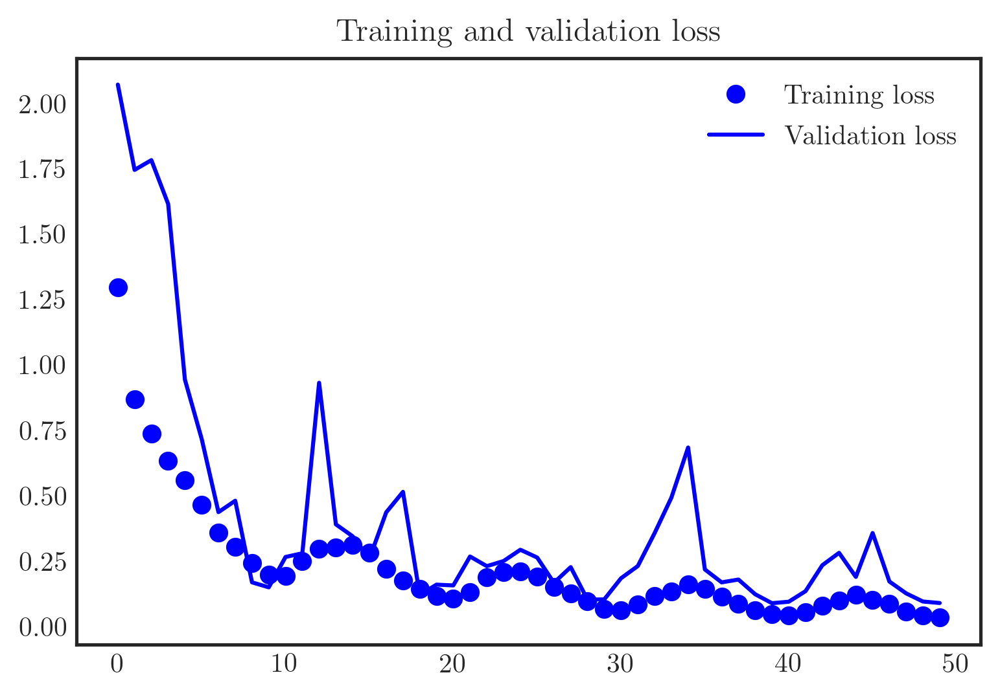

In [ ]:
# Alternative Visualization
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(len(accuracy))
plt.plot(epochs, accuracy, 'bo', label='Training accuracy')
plt.plot(epochs, val_accuracy, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

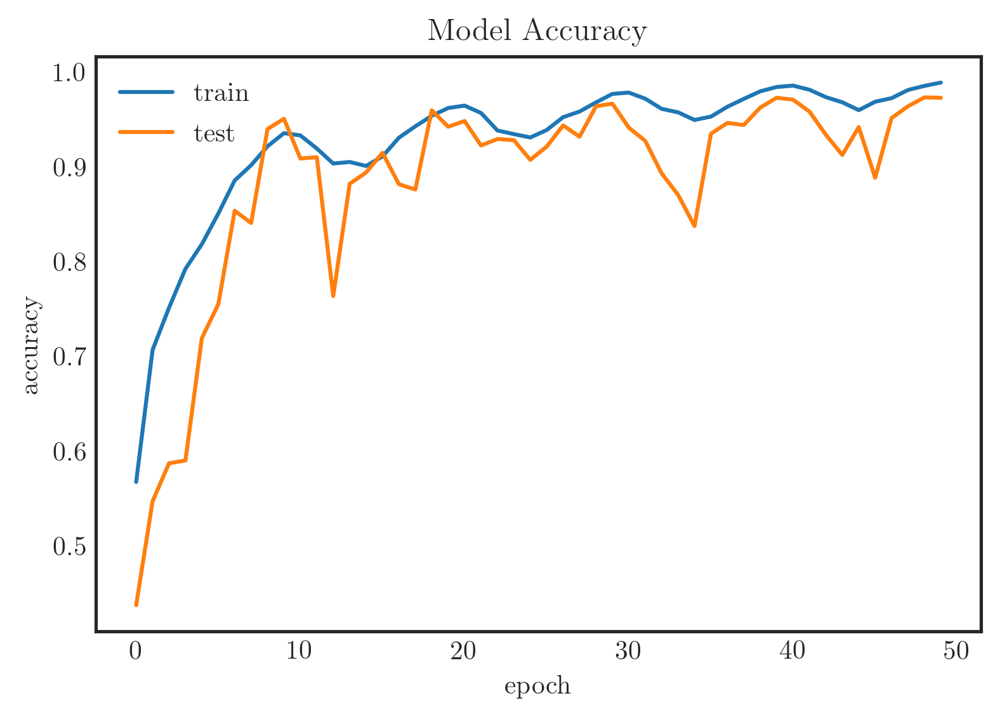

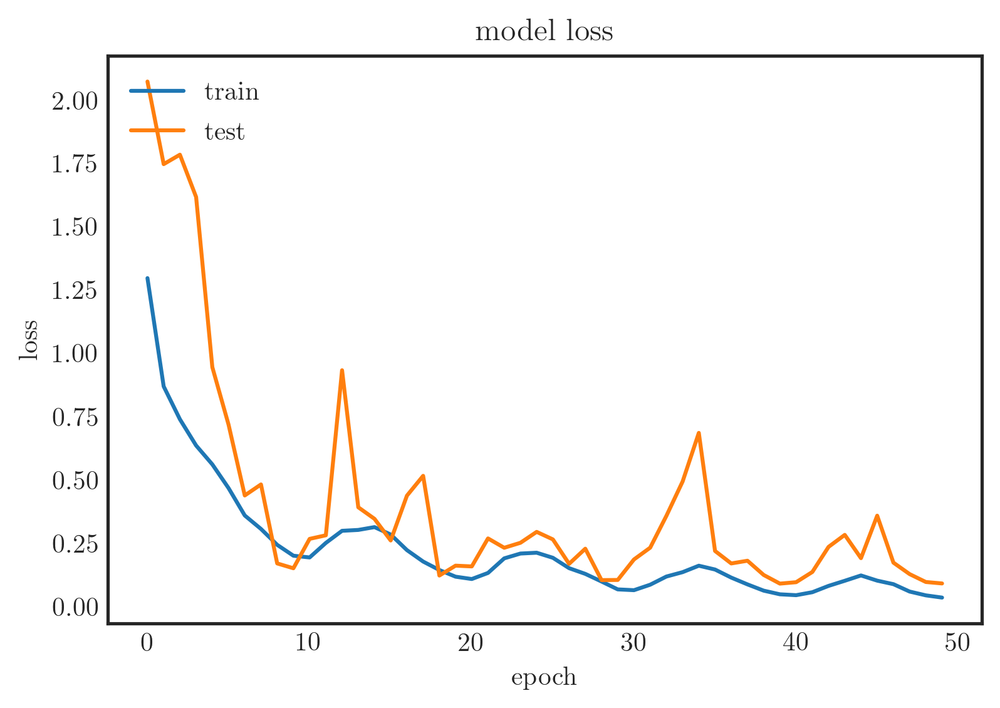

In [ ]:
# summarize history for accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [ ]:
# Look again at these two metrics
predictions_test_cnn_ngr = model_cnn_ngr.predict(X_test)
preds_test_cnn_ngr = np.argmax(predictions_test_cnn_ngr, axis = 1)

print(classification_report(y_test, preds_test_cnn_ngr))

print(model_cnn_ngr.evaluate(X_test, y_test))

              precision    recall  f1-score   support

           0       0.97      0.97      0.97       609
           1       0.96      1.00      0.98       612
           2       0.95      0.93      0.94       567
           3       0.99      0.96      0.98       591
           4       0.99      0.97      0.98       576
           5       0.97      0.96      0.96       595
           6       0.96      0.94      0.95       618
           7       0.95      1.00      0.98       635
           8       0.98      0.99      0.99       572
           9       0.99      1.00      0.99       625

    accuracy                           0.97      6000
   macro avg       0.97      0.97      0.97      6000
weighted avg       0.97      0.97      0.97      6000

188/188 [==============================] - 1s 8ms/step - loss: 0.1101 - accuracy: 0.9712
[0.11009960621595383, 0.9711666703224182]


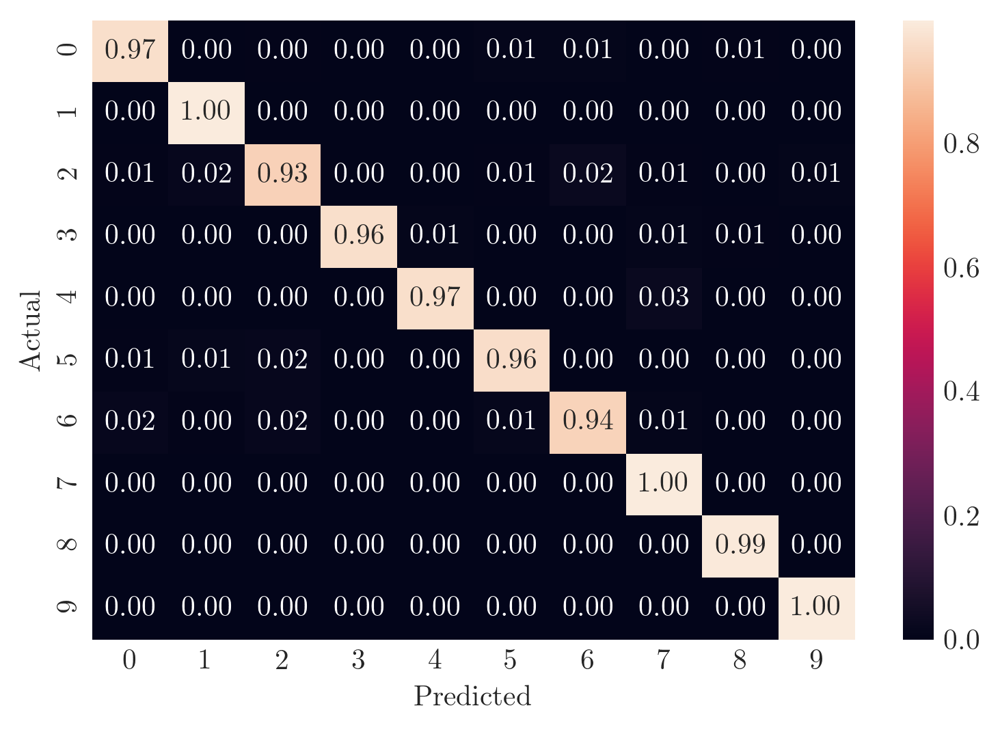

In [ ]:
cm = confusion_matrix(y_test, preds_test_cnn_ngr)
labels=[0,1,2,3,4,5,6,7,8,9]

# Normalise
cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
fig, ax = plt.subplots()
sns.heatmap(cmn, annot=True, fmt='.2f', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show(block=False)

In [ ]:
# Save the model on the drive 
path = "/content/drive/MyDrive/EuroSat_Clean/"

model_cnn_ngr.save(path + "Model_NGR_Tuned")

# Save the params as pickle on the drive
with open(path +'train_history_ngr_tuned', 'wb') as file_pi_ngr_tuned_history:
        pickle.dump(history.history, file_pi_ngr_tuned_history)   


#### Testing the Upload from Google Drive - Tuned NGR Model



dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.


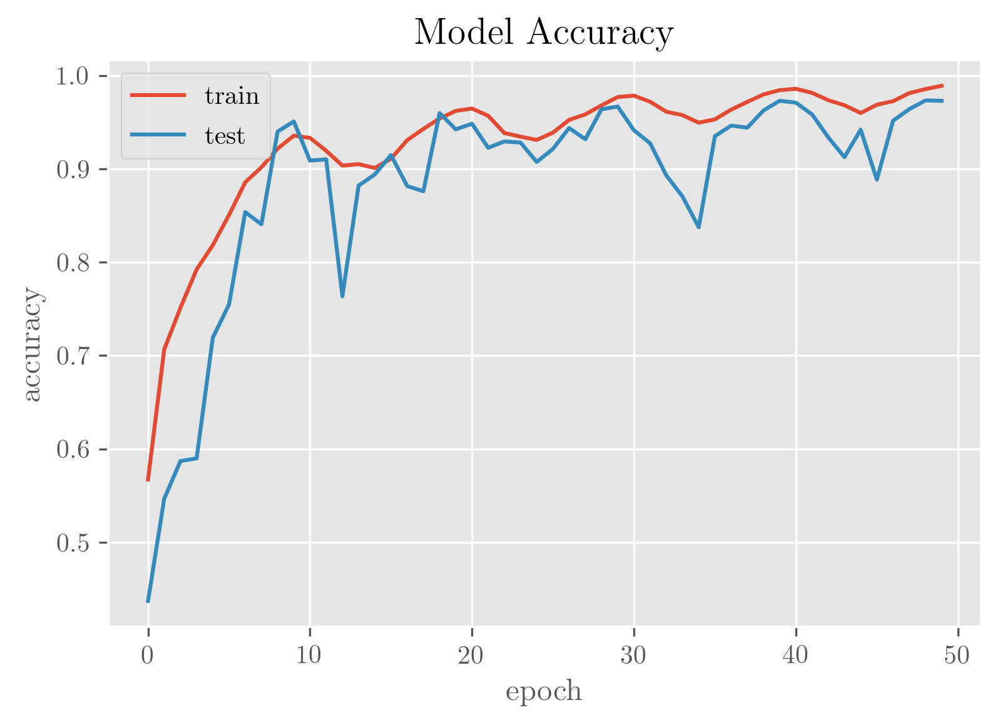

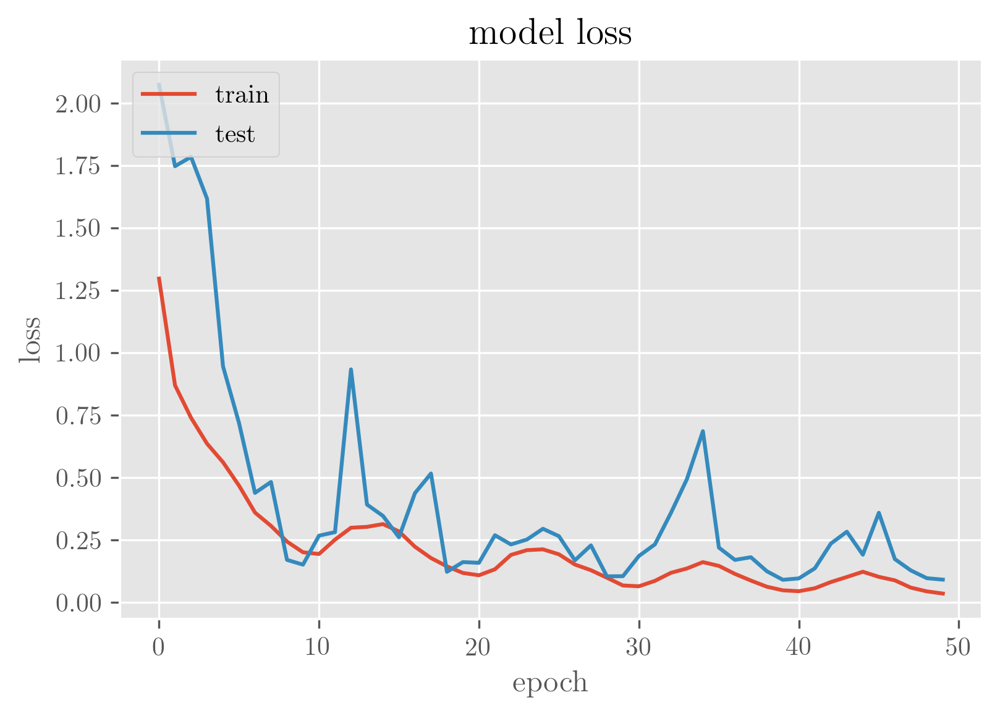

In [ ]:
# Here, I saved the baseline history as history_new

# Save the model on the drive 
path = "/content/drive/MyDrive/EuroSat_Clean/"

history_new = pickle.load(open(path +'train_history_ngr_tuned', "rb"))

# This is how to print it:

# Alternative Visualization
print("\n")
print(history_new.keys())

# summarize history for accuracy
plt.plot(history_new['accuracy'])
plt.plot(history_new['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

# summarize history for loss
plt.plot(history_new['loss'])
plt.plot(history_new['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

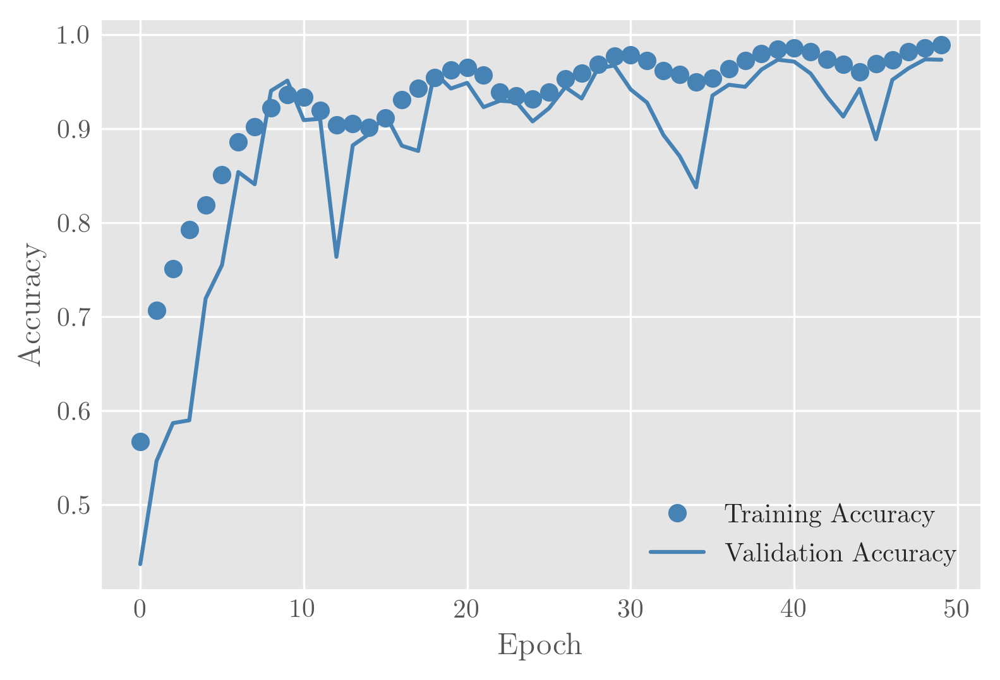

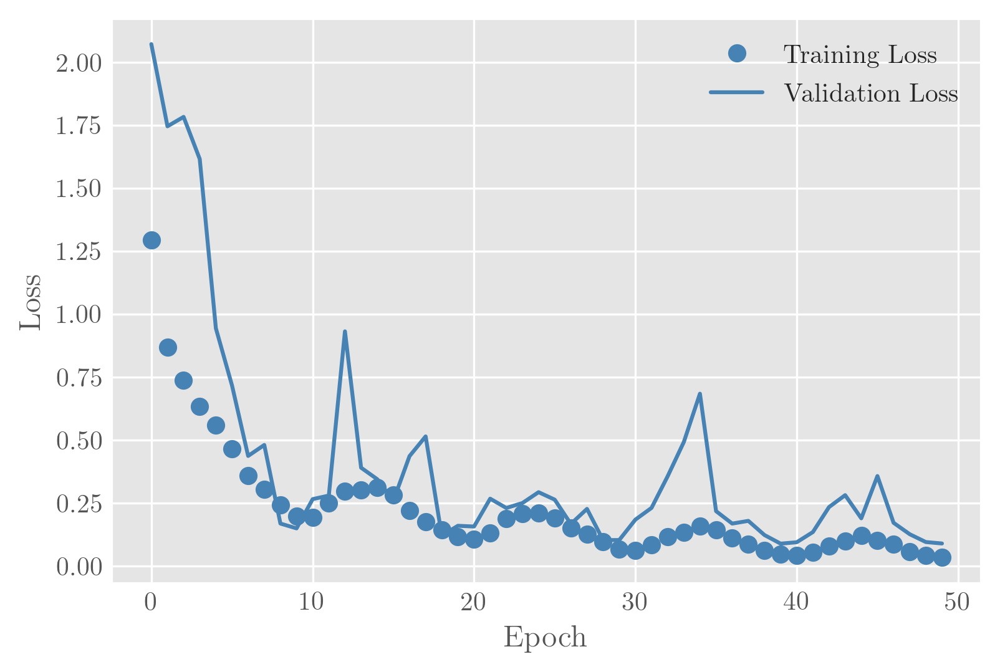

In [ ]:
path = "/content/drive/MyDrive/EuroSat_Clean/"

history_new = pickle.load(open(path +'train_history_ngr_tuned', "rb"))

# Alternative Visualization
accuracy = history_new['accuracy']
val_accuracy = history_new['val_accuracy']
loss = history_new['loss']
val_loss = history_new['val_loss']
epochs = range(len(accuracy))
plt.plot(epochs, accuracy, 'bo', label='Training Accuracy', color="steelblue")
plt.plot(epochs, val_accuracy, 'b', label='Validation Accuracy', color="steelblue")
#plt.title('Training and Validation Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend()
plt.savefig('Validation_Accuracy_Tuned.pdf')  
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training Loss', color="steelblue")
plt.plot(epochs, val_loss, 'b', label='Validation Loss', color="steelblue")
#plt.title('Training and Validation Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend()
plt.savefig('Validation_Loss_Tuned.pdf')  
plt.show()

              precision    recall  f1-score   support

           0       0.97      0.97      0.97       609
           1       0.96      1.00      0.98       612
           2       0.95      0.93      0.94       567
           3       1.00      0.96      0.98       591
           4       0.99      0.97      0.98       576
           5       0.97      0.96      0.96       595
           6       0.96      0.94      0.95       618
           7       0.95      1.00      0.98       635
           8       0.97      0.99      0.98       572
           9       0.99      1.00      0.99       625

    accuracy                           0.97      6000
   macro avg       0.97      0.97      0.97      6000
weighted avg       0.97      0.97      0.97      6000

188/188 [==============================] - 7s 6ms/step - loss: 0.1100 - accuracy: 0.9712
[0.11001159995794296, 0.9711666703224182]


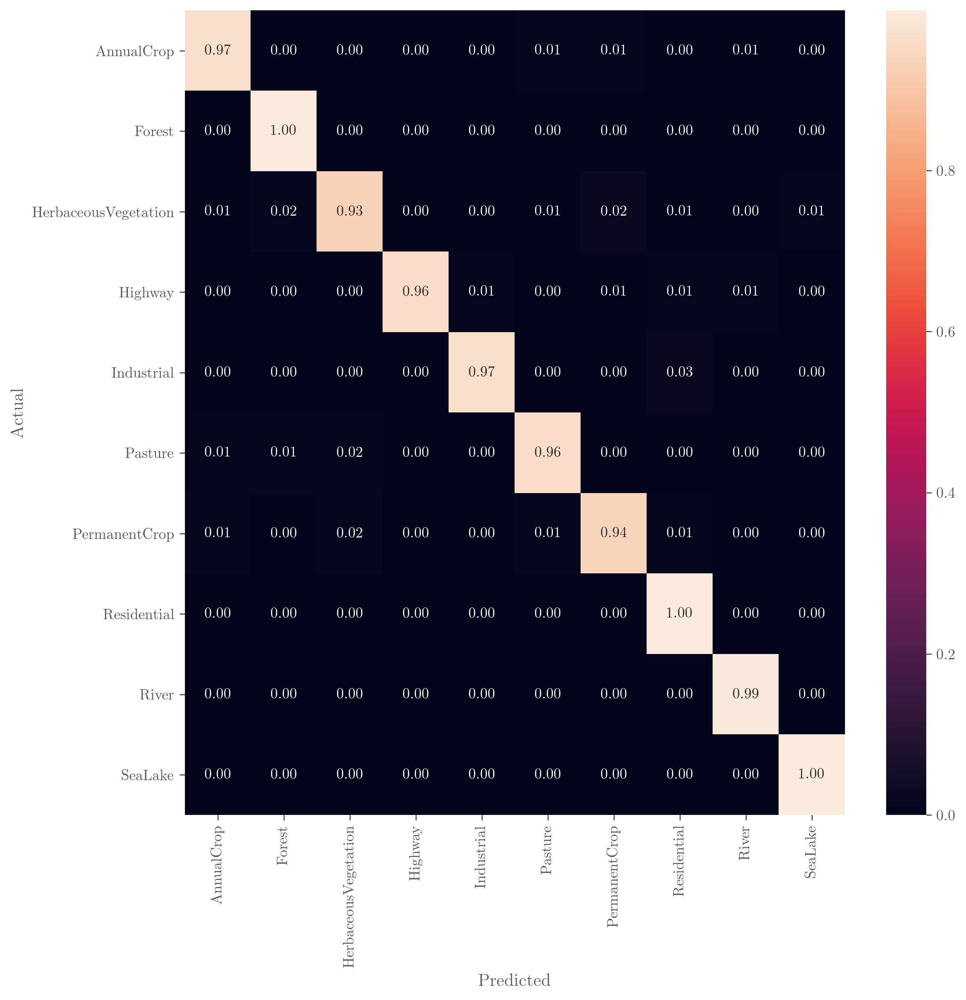

In [ ]:
model_cnn_ngr = keras.models.load_model('/content/drive/MyDrive/EuroSat_Clean/Model_NGR_Tuned')

predictions_test = model_cnn_ngr.predict(X_test)
preds_test = np.argmax(predictions_test, axis = 1)

print(classification_report(y_test, preds_test))

print(model_cnn_ngr.evaluate(X_test, y_test))


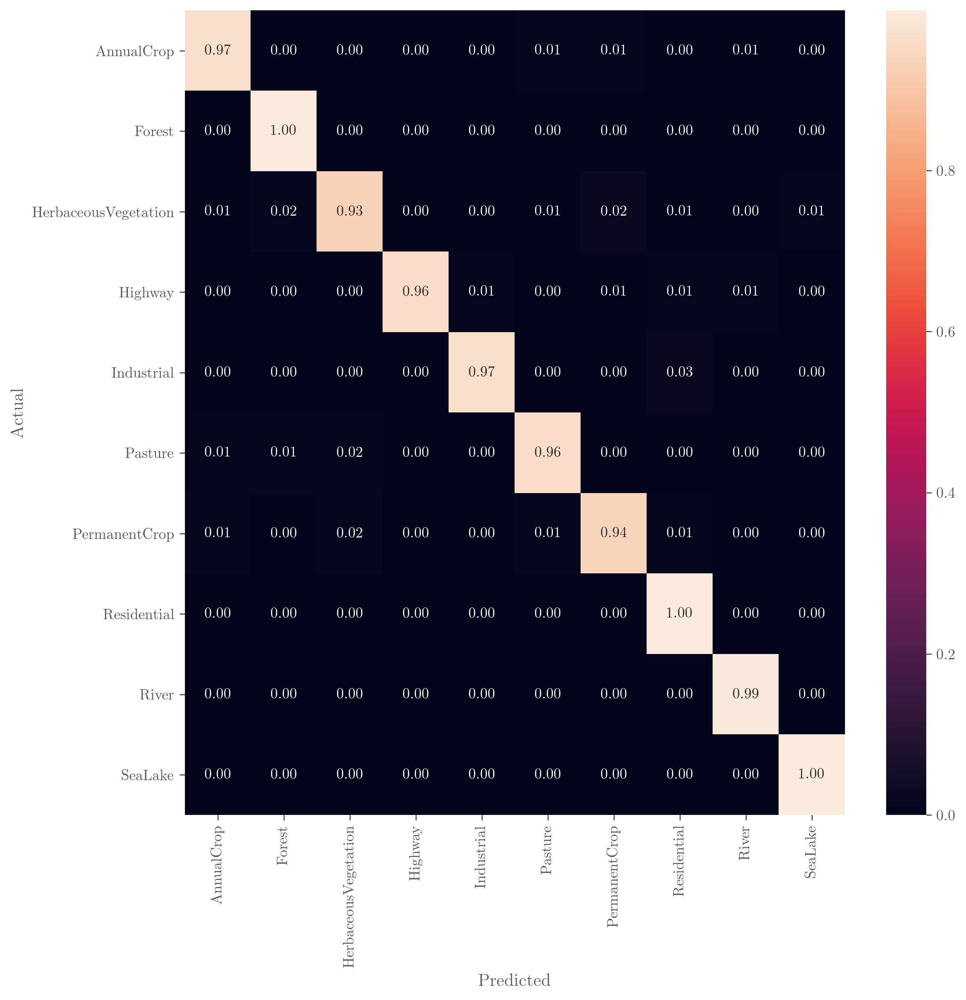

<Figure size 1800x1200 with 0 Axes>

In [ ]:
# Create confusion matrix

model_cnn_ngr = keras.models.load_model('/content/drive/MyDrive/EuroSat_Clean/Model_NGR_Tuned')

preds_test = np.argmax(predictions_test, axis = 1)

cm = confusion_matrix(y_test, preds_test)
labels = ['AnnualCrop','Forest','HerbaceousVegetation','Highway',
        'Industrial','Pasture','PermanentCrop','Residential','River','SeaLake']

# Normalise
cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(cmn, annot=True, fmt='.2f', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show(block=False)
plt.savefig('Confusion_Matrix_Balanced_Tuned_NGR.pdf')  

## References

#### Custom CNN with NGR: Baseline

In [ ]:
# We use the initial structure from Stanford Convolutional Neural Networks (CNNs / ConvNets) for Visual Recognition learning source 

def conv_model_ngr():

  model_cnn = keras.models.Sequential()
  model_cnn.add(keras.layers.Conv2D(filters=64, kernel_size = 3, activation = "relu", kernel_initializer="he_normal", padding = "same", input_shape = [64,64,3]))
  model_cnn.add(keras.layers.Conv2D(filters=64, kernel_size = 3, activation = "relu", kernel_initializer="he_normal", padding = "same")) 
  model_cnn.add(keras.layers.MaxPooling2D(pool_size = 2, strides = 2))
  model_cnn.add(keras.layers.Conv2D(filters=128, kernel_size = 3, activation = "relu", kernel_initializer="he_normal", padding = "same")) 
  model_cnn.add(keras.layers.Conv2D(filters=128, kernel_size = 3, activation = "relu", kernel_initializer="he_normal", padding = "same")) 
  model_cnn.add(keras.layers.MaxPooling2D(pool_size = 2, strides = 2))
  model_cnn.add(keras.layers.Conv2D(filters=256, kernel_size = 3, activation = "relu", kernel_initializer="he_normal", padding = "same")) 
  model_cnn.add(keras.layers.Conv2D(filters=256, kernel_size = 3, activation = "relu", kernel_initializer="he_normal", padding = "same")) 
  model_cnn.add(keras.layers.Conv2D(filters=256, kernel_size = 3, activation = "relu", kernel_initializer="he_normal", padding = "same")) 
  model_cnn.add(keras.layers.MaxPooling2D(pool_size = 2, strides = 2))
  model_cnn.add(keras.layers.Conv2D(filters=512, kernel_size = 3, activation = "relu", kernel_initializer="he_normal", padding = "same")) 
  model_cnn.add(keras.layers.Conv2D(filters=512, kernel_size = 3, activation = "relu", kernel_initializer="he_normal", padding = "same")) 
  model_cnn.add(keras.layers.Conv2D(filters=512, kernel_size = 3, activation = "relu", kernel_initializer="he_normal", padding = "same")) 
  model_cnn.add(keras.layers.MaxPooling2D(pool_size = 2, strides = 2))
  model_cnn.add(keras.layers.Conv2D(filters=512, kernel_size = 3, activation = "relu", kernel_initializer="he_normal", padding = "same")) 
  model_cnn.add(keras.layers.Conv2D(filters=512, kernel_size = 3, activation = "relu", kernel_initializer="he_normal", padding = "same")) 
  model_cnn.add(keras.layers.Conv2D(filters=512, kernel_size = 3, activation = "relu", kernel_initializer="he_normal", padding = "same")) 
  model_cnn.add(keras.layers.MaxPooling2D(pool_size = 2, strides = 2))
  model_cnn.add(keras.layers.Flatten())
  model_cnn.add(keras.layers.Dense(512, activation = "relu", kernel_initializer="he_normal"))
  model_cnn.add(keras.layers.Dense(256, activation = "relu", kernel_initializer="he_normal"))
  model_cnn.add(keras.layers.Dense(10, activation = "softmax"))

  # Compile the model
  ## Note:
  ### As usual in classification problems we use the categorical crossentropy as the loss function
  ### We use the Adam method as the optimizer with learning rate 0.01 for initialisation
  ### We set the argument metrics to "accuracy", such that Keras computes and outputs the accuracy of the model on the validation set while it is trained
  model_cnn.compile(loss="sparse_categorical_crossentropy",
                optimizer=keras.optimizers.Adam(learning_rate=0.0001),
                metrics=["accuracy"])

  return model_cnn
# To ensure that our model training histories are labelled nicely in tensorboard including a time indication of when the model has been fitted, 
## we define a variable to capture the exact logdirectory and assign this directory to the tensorboard callback afterwards.
logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_cb = TensorBoard(logdir, histogram_freq=1)

# To prevent overfitting, we introduce early stopping, such that the training is stopped as soon as no improovement has been monitored over 10 periods according to the validation accuracy
early_stopping_cb = EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True)
#early_stopping_cb = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

In [ ]:
model_cnn_ngr_baseline = conv_model_ngr()

In [ ]:
# This can only be done with a GPU connection
  # Train the model on augmented data
history = model_cnn_ngr_baseline.fit(X_train, y_train, batch_size=50, epochs=50, verbose=1,
                    validation_data=(X_valid, y_valid), 
                    callbacks=[early_stopping_cb, tensorboard_cb])

Epoch 1/50
380/380 [==============================] - 371s 973ms/step - loss: 1.6059 - accuracy: 0.4176 - val_loss: 0.7955 - val_accuracy: 0.7212
Epoch 2/50
380/380 [==============================] - 370s 973ms/step - loss: 0.8130 - accuracy: 0.7163 - val_loss: 0.8264 - val_accuracy: 0.7106
Epoch 3/50
380/380 [==============================] - 369s 972ms/step - loss: 0.6363 - accuracy: 0.7806 - val_loss: 0.5950 - val_accuracy: 0.7996
Epoch 4/50
380/380 [==============================] - 376s 989ms/step - loss: 0.5055 - accuracy: 0.8235 - val_loss: 0.4726 - val_accuracy: 0.8434
Epoch 6/50
380/380 [==============================] - 376s 989ms/step - loss: 0.4280 - accuracy: 0.8505 - val_loss: 0.4702 - val_accuracy: 0.8426
Epoch 7/50
380/380 [==============================] - 389s 1s/step - loss: 0.3592 - accuracy: 0.8770 - val_loss: 0.4693 - val_accuracy: 0.8434
Epoch 8/50
380/380 [==============================] - 373s 981ms/step - loss: 0.3306 - accuracy: 0.8871 - val_loss: 0.4198 - va

In [ ]:
model_cnn_ngr_baseline.evaluate(X_test, y_test)

188/188 [==============================] - 19s 100ms/step - loss: 0.3996 - accuracy: 0.9128


[0.39958456158638, 0.9128333330154419]

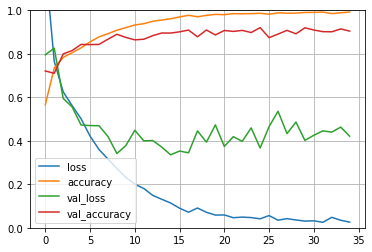

In [ ]:
# Show the learning curves
## Note: It is assumed that the training history is stored in the variable "history"
pd.DataFrame(history.history).plot()
plt.gca().set_ylim(0, 1)
plt.grid(True)
plt.show()

In [ ]:
# Look again at these two metrics
predictions_test_cnn_ngr_baseline = model_cnn_ngr_baseline.predict(X_test)
preds_test_cnn_ngr_baseline = np.argmax(predictions_test_cnn_ngr_baseline, axis = 1)

print(classification_report(y_test, preds_test_cnn_ngr_baseline))

print(model_cnn_ngr_baseline.evaluate(X_test, y_test))

              precision    recall  f1-score   support

           0       0.89      0.90      0.90       609
           1       0.98      0.96      0.97       612
           2       0.76      0.88      0.82       567
           3       0.93      0.86      0.89       591
           4       0.92      0.94      0.93       576
           5       0.91      0.93      0.92       595
           6       0.84      0.74      0.79       618
           7       0.96      0.95      0.96       635
           8       0.96      0.97      0.97       572
           9       0.97      0.99      0.98       625

    accuracy                           0.91      6000
   macro avg       0.91      0.91      0.91      6000
weighted avg       0.91      0.91      0.91      6000

188/188 [==============================] - 19s 101ms/step - loss: 0.3996 - accuracy: 0.9128
[0.39958456158638, 0.9128333330154419]


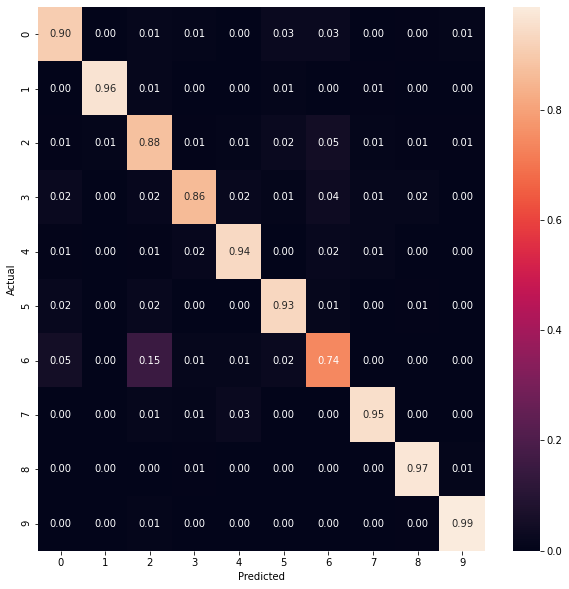

In [ ]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, preds_test_cnn_ngr_baseline)
labels=[0,1,2,3,4,5,6,7,8,9]

# Normalise
cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(cmn, annot=True, fmt='.2f', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show(block=False)

In [ ]:
# Save the model on the drive 

path = "/content/drive/MyDrive/EuroSat/"

model_cnn_ngr_baseline.save(path + "Model_NGR_baseline")

INFO:tensorflow:Assets written to: /content/drive/MyDrive/EuroSat/Model_NGR_baseline/assets


- Source 1
- Source 2
- Source 3
- Source 4